In [56]:
# -*- coding: utf-8 -*-
"""
Created on Thu Jun 30 13:54:02 2016

@author: anna
"""
import sys
sys.path.append('/usr/local/lib/python2.7/dist-packages/')

import time
import os
import re
import traceback
import pandas as pd
import mmap
import itertools
import numpy as np
import datetime
from os import listdir
from os.path import isfile, join
import sys, getopt
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline  
import logging
logging.getLogger("paramiko").setLevel(logging.WARNING)
from sar import PART_CPU, PART_MEM, PART_SWP, PART_IO, \
    PATTERN_CPU, PATTERN_MEM, PATTERN_SWP, PATTERN_IO, PATTERN_RESTART, \
    FIELDS_CPU, FIELD_PAIRS_CPU, FIELDS_MEM, FIELD_PAIRS_MEM, FIELDS_SWP, \
    FIELD_PAIRS_SWP, FIELDS_IO, FIELD_PAIRS_IO



In [2]:
user="annac"
password="ITssa2016"
path="/home/annac/tmp/"#/Users/annachystiakova/Documents/Capacity/sar_analysis/sar_data/"

Load sysstat data from remote hosts

In [103]:
import paramiko
# The function to parse the input script arguments
def parse_args(argv):
    user = ''
    password = ''
    host = ''
    param = ''
    minsize=''
    try:
        opts, args = getopt.getopt(argv,"u:p:h:v:s:",["user=","password=", "host=", "param=", "size="])
    except getopt.GetoptError:
        print 'argparse_my.py -u <user> -p <password> -h <host>'
        sys.exit(2)
    for opt, arg in opts:
        if opt == '-N':
            print 'argparse_my.py -u <user> -p <password> -h <host>'
            sys.exit()
        elif opt in ("-u", "--user"):
            user = arg
        elif opt in ("-p", "--password"):
            password = arg
        elif opt in ("-h", "--host"):
            host = arg
        elif opt in ("-v", "--param"):
            param = arg
        elif opt in ("-s", "--size"):
            minsize = arg
    return ([user, password, host, param, minsize])

#Copy sar data from remote host
def get_host_data (host, user, password):
    #Create the directory to store data
    if not os.path.exists('/home/'+user+'/tmp'):
        os.makedirs('/home/'+user+'/tmp')
    if not os.path.exists('/home/'+user+'/tmp/'+host):
        os.makedirs('/home/'+user+'/tmp/'+host)
    host=host
    user = user
    password = password
    files_stat=['sar']
    k=1
    paramiko.util.log_to_file('ssh.log') # sets up logging
    client = paramiko.SSHClient()
    client.set_missing_host_key_policy(paramiko.AutoAddPolicy())
    client.connect(host+'.etadirect.com', username=user, password=password)
    cmd='uname'
    stdin, stdout, stderr = client.exec_command(cmd)
    out=[x.replace('\n','') for x in stdout]
    print ("OS is:", out)
    if out[0]!=u'Linux':
        return 0
    cmd='ls /var/log/sa/'
    stdin, stdout, stderr = client.exec_command(cmd)
    sars=[x.replace('\n','') for x in stdout if 'sar' in x]
    #print ("Response was:", sars)
    time.sleep(1)
    #print ('Done')

        #Copy file from remote host to local
    port=22
    transport = paramiko.Transport((host+'.etadirect.com', port))
    transport.connect(username = user, password = password)
    sftp = paramiko.SFTPClient.from_transport(transport)
    # Download
    filepath = '/var/log/sa/'
    localpath = '/home/'+user+'/tmp/'+host+'/'
    for sar in sars:
        sftp.get(filepath+sar, localpath+sar)
    client.close()


Get required data from sar

In [4]:
def _split_file(self, data=''):
    '''
    Splits SAR output or SAR output file (in ASCII format) in order to
    extract info we need for it, in the format we want.
        :param data: Input data instead of file
        :type data: str.
        :return: ``List``-style of SAR file sections separated by
            the type of info they contain (SAR file sections) without
            parsing what is exactly what at this point
    '''

    # Filename passed checks through __init__
    if ((self and os.access(self, os.R_OK))
        or data != ''):

        fhandle = None

        if (data == ''):
            try:
                fhandle = os.open(self, os.O_RDONLY)
            except OSError:
                print(("Couldn't open file %s" % (self.__filename)))
                fhandle = None

        if (fhandle or data != ''):

            datalength = 0
            dataprot = mmap.PROT_READ

            if (data != ''):
                fhandle = -1
                datalength = len(data)
                dataprot = mmap.PROT_READ | mmap.PROT_WRITE

            try:
                sarmap = mmap.mmap(
                    fhandle, length=datalength, prot=dataprot
                )
                if (data != ''):
                    sarmap.write(data)
                    sarmap.flush()
                    sarmap.seek(0, os.SEEK_SET)

            except (TypeError, IndexError):
                if (data == ''):
                    os.close(fhandle)
                traceback.print_exc()
                # sys.exit(-1)
                return False

            # Here we'll store chunks of SAR file, unparsed
            searchunks = []
            oldchunkpos = 0

            dlpos = sarmap.find(b"\n\n", 0)
            size = 0

            if (data == ''):
                # We can do mmap.size() only on read-only mmaps
                size = sarmap.size()
            else:
                # Otherwise, if data was passed to us,
                # we measure its length
                len(data)

            # oldchunkpos = dlpos

            while (dlpos > -1):  # mmap.find() returns -1 on failure.

                tempchunk = sarmap.read(dlpos - oldchunkpos)
                searchunks.append(tempchunk.strip())

                # We remember position, add 2 for 2 DD's
                # (newspaces in production). We have to remember
                # relative value
                oldchunkpos += (dlpos - oldchunkpos) + 2

                # We position to new place, to be behind \n\n
                # we've looked for.
                try:
                    sarmap.seek(2, os.SEEK_CUR)
                except ValueError:
                    print(("Out of bounds (%s)!\n" % (sarmap.tell())))
                # Now we repeat find.
                dlpos = sarmap.find(b"\n\n")

            # If it wasn't the end of file, we want last piece of it
            if (oldchunkpos < size):
                tempchunk = sarmap[(oldchunkpos):]
                searchunks.append(tempchunk.strip())

            sarmap.close()

        if (fhandle != -1):
            os.close(fhandle)

        if (searchunks):
            return searchunks
        else:
            return False

    return False


def get_values(s, di):
    df = {}
    if s is None:
        return df
    s = s.split()
    if s[0] == 'Average:':
        df['time'] = s[0]
        for k, v in di.items():
            df[k] = s[(int(v) - 1)]
    else:
        df['time'] = ' '.join([':'.join([s[0].split(':')[0], s[0].split(':')[1], "00"]), s[1]])

        for k, v in di.items():
            pattern_re = re.compile(k)
            if (pattern_re.search(s[v])):
                df[k] = np.nan
            else:
                df[k] = s[v]

    return (df)


def data_ind(part_parts, FIELDS_CPU):
    return_dict = {}
    counter = 0
    for piece in part_parts:
        for colname in FIELDS_CPU:
            pattern_re = re.compile(colname)
            if (pattern_re.search(piece)) and piece == colname.replace("\\", ""):
                return_dict[colname.replace("%", "").replace("\\", "")] = counter
                # print(piece)
                break
        counter += 1
    return return_dict


def get_data(S):
    cpu_pattern = re.compile('.*CPU.*(usr|user).*nice.*sys.*')
    mem_pattern = re.compile(PATTERN_MEM)
    swp_pattern = re.compile(PATTERN_SWP)
    io_pattern = re.compile(PATTERN_IO)
    #PATTERN_IO_P = ['DEV', '^tps', '^rd_sec\\/s', '^wr_sec\\/s', 'avgrq-sz', 'avgqu-sz', 'await', 'svctm', '\\%util']
    PATTERN_IO_P = '.*tps.*rd_sec\/s.*wr_sec\/s.*avgrq-sz.*avgqu-sz.*await.*svctm.*\%util.*'
    io_pattern_p=re.compile(PATTERN_IO_P)
    restart_pattern = re.compile(PATTERN_RESTART)
    iface_pattern = re.compile('.*IFACE.*rxerr.*txerr.*coll.*rxdrop.*txdrop.*txcarr.*rxfram.*rxfifo.*txfifo.*')
    di = {}
    dm = {}
    df = {}
    io = {}
    iop={}
    FIELDS_MEM= ['kbmemfree', 'kbmemused', '\\%memused', 'kbbuffers', 'kbcached', 'kbcommit','\\%commit']
    FIELDS_CPU = ['CPU', '\\%usr', '\\%nice', '\\%sys', '\\%iowait', '\\%idle']
    FIELDS_IFACE = ['IFACE', 'rxerr/s', 'txerr/s', 'coll/s', 'rxdrop/s', 'txdrop/s', 'txcarr/s', 'rxfram/s', 'rxfifo/s',
                    'txfifo/s']
    FIELDS_IOPS = ['tps', 'rtps', 'wtps', 'bread/s', 'bwrtn/s']
    FIELDS_IOPS_PERC = ['DEV', 'tps', 'rd_sec/s', 'wr_sec/s', 'avgrq-sz', 'avgqu-sz', 'await', 'svctm','\\%util']

    CPU = list()
    MEM = list()
    IF = list()
    IO = list()
    IOP = list()
    for k in range(len(S)):

        D = (S[k].decode().split('\n'))
        part = D[0]
        if (cpu_pattern.search(part)):
            if len(di) == 0:
                part_parts = part.split()
                di = data_ind(part_parts, FIELDS_CPU)
            CPUn = []
            for dd in D:
                CPUn.append(get_values(dd, di))
            # CPUn=list(map(get_values, D, itertools.repeat(di)))
            CPU.extend(CPUn)
        elif (mem_pattern.search(part)):
            if len(dm) == 0:
                part_parts = part.split()
                dm = data_ind(part_parts, FIELDS_MEM)
            MEMn = []
            for dd in D:
                MEMn.append(get_values(dd, dm))
            MEM.extend(MEMn)
        elif (iface_pattern.search(part)):
            if len(df) == 0:
                part_parts = part.split()
                df = data_ind(part_parts, FIELDS_IFACE)
            IFn = []
            for dd in D:
                IFn.append(get_values(dd, df))
            IF.extend(IFn)
        elif (io_pattern.search(part)):
            if len(io) == 0:
                part_parts = part.split()
                io = data_ind(part_parts, FIELDS_IOPS)
            IOn = []
            for dd in D:
                IOn.append(get_values(dd, io))
            IO.extend(IOn)
        elif (io_pattern_p.search(part)):
            if len(iop) == 0:
                part_parts = part.split()
                iop = data_ind(part_parts, FIELDS_IOPS_PERC)
            IOPn = []
            for dd in D:
                IOPn.append(get_values(dd, iop))
            IOP.extend(IOPn)

    return (CPU, MEM, IF, IO, IOP)

def modification_date(filename):
    t = os.path.getmtime(filename)
    return datetime.datetime.fromtimestamp(t)

def get_resource_tables(mypath):
    onlyfiles = [f for f in listdir(mypath) if isfile(join(mypath, f))]
    pattern_res = re.compile('sar\\d{2}')
    DFR = pd.DataFrame()
    DMR = pd.DataFrame()
    IFR = pd.DataFrame()
    IOR = pd.DataFrame()
    IOPR = pd.DataFrame()
    dr=re.compile('(\d+-\d+-\d+)')
    for o in onlyfiles:
        if (o.replace("sar", "")).isdigit():
            sarfile = join(mypath, o)
            with open(sarfile, 'r') as f:
                first_line=f.readline()
            dd=dr.findall(first_line)    
            if len(dd)==1:
                dd=str(dd[0])
            else:
                raise ValueError("Cannot define the date in line  ", s)
            S = _split_file(sarfile)
            FF, MEM, IF, IO, IOP = get_data(S)
            DF = pd.DataFrame(FF)
            DM = pd.DataFrame(MEM)
            IF = pd.DataFrame(IF)
            IO = pd.DataFrame(IO)
            IOP = pd.DataFrame(IOP)
            d = datetime.date.today()
                            
            DF.time = DF.time.apply(lambda x: ' '.join([dd, x]))
            DM.time = DM.time.apply(lambda x: ' '.join([dd, x]))
            IF.time = IF.time.apply(lambda x: ' '.join([dd, x]))
            IO.time = IO.time.apply(lambda x: ' '.join([dd, x]))
            IOP.time = IOP.time.apply(lambda x: ' '.join([dd, x]))
            
            DF = DF.dropna()
            DM = DM.dropna()
            IF = IF.dropna()
            IO = IO.dropna()
            IOP = IOP.dropna()

            DFR = DFR.append(DF, ignore_index=True)
            DMR = DMR.append(DM, ignore_index=True)
            IFR = IFR.append(IF, ignore_index=True)
            IOR = IOR.append(IO, ignore_index=True)
            IOPR = IOPR.append(IOP, ignore_index=True)

    import time
    start = time.time()

    DFR['idle'] = DFR['idle'].apply(float)
    DFR['used_cpu'] = 100-DFR['idle']
    
    l = 'Average:'
    DFR_Average = DFR[DFR.time.apply(lambda v: True if l in v else False)]#= DFR.loc[DFR.index.map(lambda v: True if l in v else False)]
    DFR = DFR[DFR.time.apply(lambda v: False if l in v else True)]

    DMR['memused'] = DMR['memused'].apply(float)
    DMR_Average = DMR[DMR.time.apply(lambda v: True if l in v else False)]
    DMR = DMR[DMR.time.apply(lambda v: False if l in v else True)]

    IFR['rxerr/s'] = IFR['rxerr/s'].apply(float)
    IFR_Average = IFR[IFR.time.apply(lambda v: True if l in v else False)]
    IFR = IFR[IFR.time.apply(lambda v: False if l in v else True)]
    IFR.columns =['Network_interface','CollisionN','Received_dropped_packets','Bad_packets','FIFO_overrun_errors', 'Frame_alignment_errors', 'time','Carrier_errors', 'Transmitted_dropped_packets', 'Errors_transmit_packets', 'FIFO_overrun_errors']


    IOR['tps'] = IOR['tps'].apply(float)
    IOR_Average = IOR[IOR.time.apply(lambda v: True if l in v else False)]
    IOR = IOR[IOR.time.apply(lambda v: False if l in v else True)]

    IOPR = IOPR[IOPR.time.apply(lambda v: False if l in v else True)]

    DFR.to_csv(mypath + "/cpu_data.csv", index=False)
    DMR.to_csv(mypath + "/mem_data.csv", index=False)
    IFR.to_csv(mypath + "/net_errors_data.csv", index=False)
    IOR.to_csv(mypath + "/io_data.csv", index=False)
    IOPR.to_csv(mypath + "/io_perc_data.csv", index=False)




# Capacity estimation. Forecast

In [39]:

'''The function is desighned to analyse the resourse 
    utilization based on clusterization and linear models of trend.
    Use the R function to detect last period of homogeneous structure
'''

import rpy2.interactive as r
import rpy2.interactive.packages # this can take few seconds
rlib = r.packages.packages
r.packages.importr("utils")
#rlib.utils.install_packages("devtools")
from rpy2.robjects.packages import importr
devtools=importr('devtools')
devtools.install_github(repo="BreakoutDetection", username="twitter")
import sklearn
from sklearn.cluster import KMeans
from sklearn.linear_model import LinearRegression
import matplotlib
import matplotlib.pyplot as plt

""" median filtering """
def get_median_filtered(signal, threshold=3):
    """
    signal: is numpy array-like
    returns: signal, numpy array
    """
    difference = np.abs(signal - np.median(signal))
    median_difference = np.median(difference)
    s = [0 if median_difference == 0 else dd / float(median_difference) for dd in difference]
    mask = [ss > threshold for ss in s]
    signal = [np.median(signal) if mask[i] else signal[i] for i in range(len(signal))]
    return signal


def get_util(test, index, plot_clust, min_clust_size=0.1):
    clust_n=6
    if len(set(test)) < clust_n:
        test_h = test
        inds = range(len(test_h))
    else:
        km = KMeans(clust_n)
        km.fit(np.array(test).reshape(len(test), 1), clust_n)
        clust = km.predict(np.array(test).reshape(len(test), 1))
        val = [np.argmax(km.cluster_centers_)]
        inds = [int(x) for x in range(len(clust)) if clust[x] in val]
        test_h = [test[i] for i in inds]#test[inds]
        clust_cent = km.cluster_centers_

        while len(test_h) < min_clust_size * len(test):
            if len(np.unique(clust_cent[0])) == 1  and (np.unique(clust_cent[0])[0] == 0 or np.unique(clust_cent[0])[0] < 0):
                test_h = test
                inds = range(len(test_h))
                break
            clust_cent[val] = 0
            val.append(np.argmax(clust_cent))
            inds = [int(x) for x in range(len(clust)) if clust[x] in val]
            test_h = [test[i] for i in inds] 
    if plot_clust:
        plt.figure()
        plt.scatter(index,test)
        #plt.plot(test)
        plt.scatter(x=[index[i] for i in inds], y=test_h, color='red')
        plt.show()
        plt.clf()
    test_h = get_median_filtered(test_h)
    return max(test_h)
 
def last_period_forecast(data, min_size, min_clust_size=0.1):
    BreakoutDetection = importr('BreakoutDetection')
    base = importr('base')
    data2 = [x for x in data]
    data3 = data2
    points = []
    #print("Length of input data "+str(len(data3)))
    #print("min size"+str(min_size))
    while len(data3) > min_size:
        breaks = BreakoutDetection.breakout(base.as_numeric(data3), min_size)
        if int(np.asarray(breaks[0])[0]) == 0:
            if len(points)==0:
                points=[0]
            break
        if len(points) > 0:
            points.append(int(np.asarray(breaks[0])[0]) + points[len(points) - 1])
        else:
            points = [int(np.asarray(breaks[0])[0])]
        data3 = data3[int(np.asarray(breaks[0])[0]):]

    #print(points)
    #print(len(data))
    test = data[points[len(points) - 1]:]
    i = 1
    while len(test) < min_size:
        test = data[points[len(points) - i]:]
    clust_n=6

    if len(set(test))<clust_n:
        test_h=test
        inds=range(len(test_h))
    else:
        km = KMeans(clust_n)
        km.fit(np.array(test).reshape(len(test), 1), clust_n)
        clust = km.predict(np.array(test).reshape(len(test), 1))
        #print(km.cluster_centers_)
        val = [np.argmax(km.cluster_centers_)]
        # print(val)
        inds = [int(x) for x in range(len(clust)) if clust[x] in val]
        test_h = [test[i] for i in inds]  # test[inds]
        clust_cent = km.cluster_centers_
        
        #print(len(test_h))

        while len(test_h) < min_clust_size * len(test):
            if all(np.ravel(clust_cent))<=0:
                test_h = test
                inds = range(len(test_h))
                break
            clust_cent[val] = 0
            val.append(np.argmax(clust_cent))
            inds = [int(x) for x in range(len(clust)) if clust[x] in val]
            test_h = test[inds]
            # print(len(test_h))
        #print(len(test_h))
    test_h = get_median_filtered(test_h)
    #print("Test H is calculated")

    lr1 = LinearRegression()
    # if param == 'used_cpu':
    #    test_h = [np.float16(x) for x in test_h]
    lr1.fit(np.array(inds).reshape(len(inds), 1), np.array(test_h).reshape(len(test_h), 1))
    # predict for 1 week L =2016
    X = np.array(range(max(inds), (max(inds) + 1008)))
    res = lr1.predict(X.reshape(len(X), 1))
    res = [x for x in res.ravel()]

    return res, np.std(test_h), points[len(points) - 1]


def forecast_on_sar(host, user, min_size=566, start=0, plot_clust=True):
    #ID = pd.DataFrame({'kbmemused': "mem_data", "used_cpu": "cpu_data", "bread/s": "io_data",
    #                   "bwrtn/s": "io_data"}, index=range(1))
    ID = pd.DataFrame({'kbmemused': "mem_data", "used_cpu": "cpu_data", "bread/s": "io_data",
                       "wr_sec/s": "io_perc_data"}, index=range(1))
    npl = 221
    my_dpi = 80
    #fig1 = plt.figure()
    fig1 = plt.figure(0, figsize=(2000 / my_dpi, 900 / my_dpi), dpi=my_dpi)
    ncores=0
    ram=0
    D=pd.DataFrame()
    # for input_data in ID:
    for param in ID.columns:
        #print(param)
        input_data = ID[param][0]
        mem = pd.read_csv(path+host+"/" + input_data + ".csv", index_col=False)
        if start>0:
            mem=mem[mem.time>start]
        #print(mem.head())
        #print(input_data)
        if input_data=="cpu_data":
            ncores=(len(pd.unique(mem['CPU']))-1)
            mem2=mem[mem['CPU']!="all"]
            mem2.index = pd.DatetimeIndex(mem2.time)
            mem2 = mem2.sort_index()
            dm=mem2.groupby(mem2.index)[param].sum()
            data = dm.values
            min_clust_size=0.05
            util = get_util([x for x in data], dm.index, plot_clust, min_clust_size)
            mem=mem[mem['CPU']=="all"]

            #print("CPU Cores " + str(ncores))
        elif input_data=="mem_data":
            ram=np.float32(mem['kbmemused'].values[0]+mem['kbmemfree'].values[0])
            
            mem['real_kbfree']=mem['kbmemfree']+mem['kbcached']
            mem['real_used']=[(ram-x) for x in mem['real_kbfree']]
            mem.to_csv(path+host+"/memory_calculated.csv")
            param='real_used'
            mem.index = pd.DatetimeIndex(mem.time)
            mem = mem.sort_index()
            dm = mem[param]
            data = dm.values
            util = get_util([x for x in data], dm.index, plot_clust)
            ram=np.ceil(ram/1024/1024)
            D = D.append(pd.DataFrame({"Resource": input_data, "Capacity": ram, "Param":param, "Used": np.ceil(util/1024/1024), "Details":"All data in GB"}, index=[host]))
            #param='kbmemused'
            param='real_used'
            dm = mem[param]
            #dm.index = pd.DatetimeIndex(dm.time)
            dm = dm.sort_index()
            data = dm.values
            min_clust_size=0.1
            util = get_util([x for x in data], dm.index, plot_clust, min_clust_size)

            #print("RAM " + str(ram))
        else:
            mem.index = pd.DatetimeIndex(mem.time)
            mem = mem.sort_index()
            dm = mem[param]
            #dm = dm.sort_index()
            data = dm.values
            min_clust_size=0.1
            util = get_util([x for x in data], dm.index, plot_clust, min_clust_size)
            
        res, stand_dev, point = last_period_forecast(data, min_size, min_clust_size=0.03)
        #print("Utilized "+ str(util))
        #print("forecast_done")
        #print(dm.index)
        
        res = [np.median(data) if res[i]<min(data) else res[i] for i in range(len(res))]
        
        pred = (pd.Series(res, index=pd.date_range(str(dm.index[dm.shape[0] - 1]), periods=1008, freq='10min')))
        pred.index = pd.to_datetime(pred.index, unit='s')
        RES = pd.concat([dm, pred], axis=0)
        #print("plot_forecast")
        fig1.add_subplot(npl)
        plt.plot(dm.index, dm.values, lw=1, label="Input data", color='blue')
        plt.plot(pred.index, pred.values, lw=2, label="Forecast", color='red', ls='--')
        plt.plot(pred.index, pred.values + 3 * stand_dev, lw=2, label="Forecast with confidence interval",
                 color='orange', ls='--')
        plt.fill_between(RES.index[point:len(dm.index) - 1], max(RES), min(RES), \
                         facecolor='yellow', alpha=0.5, \
                         label="last period with uniform structure")
        plt.title("Forecast of " + param + " based on sar")
        plt.legend(loc='upper left',prop={'size':8})
        #print("done")
        npl = npl + 1
        if input_data == "cpu_data":
            #print("Cores %")
            #print(np.float64(ncores)/100)
            D=D.append(pd.DataFrame({"Resource":input_data, "Capacity":ncores,"Param":param,"Used":(str(util)+" %"), "Details":"Used in %. All data ncores*100%"}, index=[host]))
        elif input_data=="mem_data":
            D = D.append(pd.DataFrame({"Resource": input_data, "Capacity": ram, "Param":param,"Used": util/1024/1024, "Details":"All data in GB"}, index=[host]))

    #plt.show(block=False)
    plt.show()
    fig1.show()
    fig1.savefig(path+host+"/Forecast_"+host.replace(".","_")+"_min_period_"+str(min_size), dpi=300)
    #''/home/'+user+'/tmp/'+host + "/Forecast_"+host.replace(".","_")+"_min_period_"+str(min_size), dpi=300)
    fig1.clf()
    return (D)
    



In [1]:
def get_resource_data(group_serv):
    D=pd.DataFrame()
    for G in data.Group.unique():
        if group_serv in G:
            print(G)
            df=pd.DataFrame()
            fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20, 5))
            ax0, ax1= axes.flat

            d=DFR_RAM[DFR_RAM.Group==G]
            print(d)
            D=D.append(d)
            X, Y=d.shape
            ind = np.arange(X)
            width = 0.5
            #d=d[['server','Used', 'Available']]
            p1 = ax0.bar(ind, d.Used.values,  color='red', label='Used_memory_Gb')
            p2 = ax0.bar(ind, d.Available.values, color='green', bottom=d.Used.values, label='Available')
            ax0.set_xticks(range(d.shape[0]))
            ax0.set_xticklabels([str(x) for x in d.server.values], rotation=90)
            ax0.set_title(G+" Memory usage Gb")
            ax0.get_legend()
            ax0.set_xlabel("KB")
            df=df.append(pd.DataFrame({"Group":G, "Number":d.shape[0],"Resource":"Memory","Sum_used":d.Used.sum(),"Sum_capacity":d.Capacity.sum() }, index=['RAM']))


            d=DFR_CPU[DFR_CPU.Group==G]
            D=D.append(d)
            X, Y=d.shape
            ind = np.arange(X)
            width = 0.5
            #d=d[['server','Used', 'Available']]
            d['Used']=np.float16(d['Used'].str.replace(" %", ""))
            p1 = ax1.bar(ind, d.Used.values,  color='red', label='Used_CPU_%')
            p2 = ax1.bar(ind, d.Available.values, color='green', bottom=d.Used.values, label='Available')
            ax1.set_xticks(range(d.shape[0]))
            ax1.set_xticklabels([str(x) for x in d.server.values], rotation=90)
            ax1.set_title(G+" CPU usage %")
            ax1.set_xlabel("%")

            #fig.text(G)
            fig.set_label(G)
            fig.show

            print(G)
            df=df.append(pd.DataFrame({"Group":G, "Number":d.shape[0], "Resource":"CPU","Sum_used":d.Used.sum(),"Sum_capacity":100*d.Capacity.sum() }, index=['CPU']), ignore_index=True)
            print(df)
            print("Summary CPU ")
            print("Used "+str(d.Used.sum()/d.Capacity.sum())+" %")
            print("Summary RAM ")
            print("Used "+str(100*np.float16(df['Sum_used'][df.Resource=='Memory'].values/df.Sum_capacity[df.Resource=='Memory'].values)[0])+" %")
    return D

                Group             server
0  PC-BE-PROD-ED1-101  be101.pc.prod.ed1
1                 NaN  be102.pc.prod.ed1
2  PC-DB-PROD-ED1-101  db101.pc.prod.ed1
3                 NaN  db102.pc.prod.ed1
4  PC-FE-PROD-ED1-101  fe101.pc.prod.ed1

[5 rows x 2 columns]
Index([u'group', u'server'], dtype='object')
be101.pc.prod.ed1


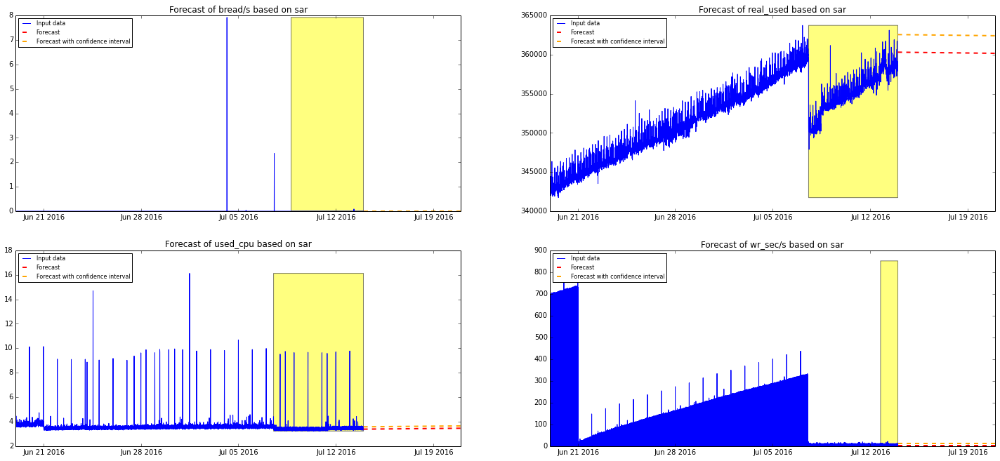

be102.pc.prod.ed1


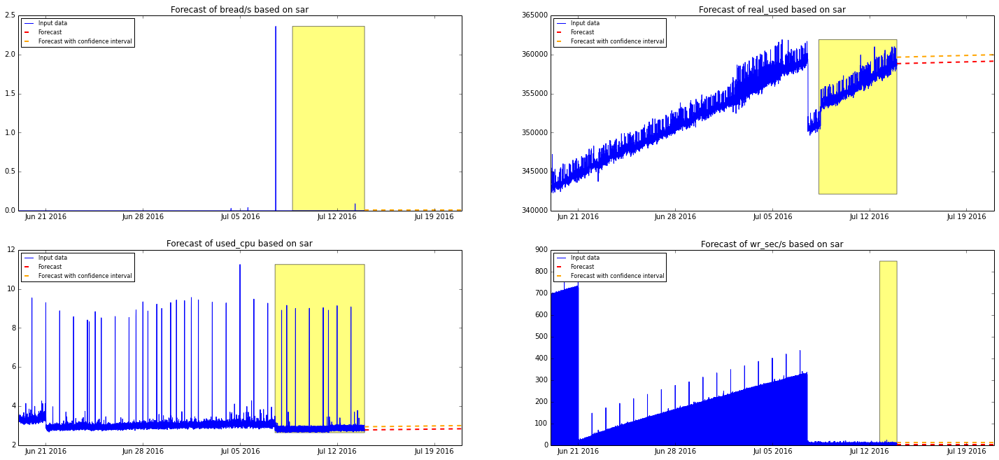

db101.pc.prod.ed1


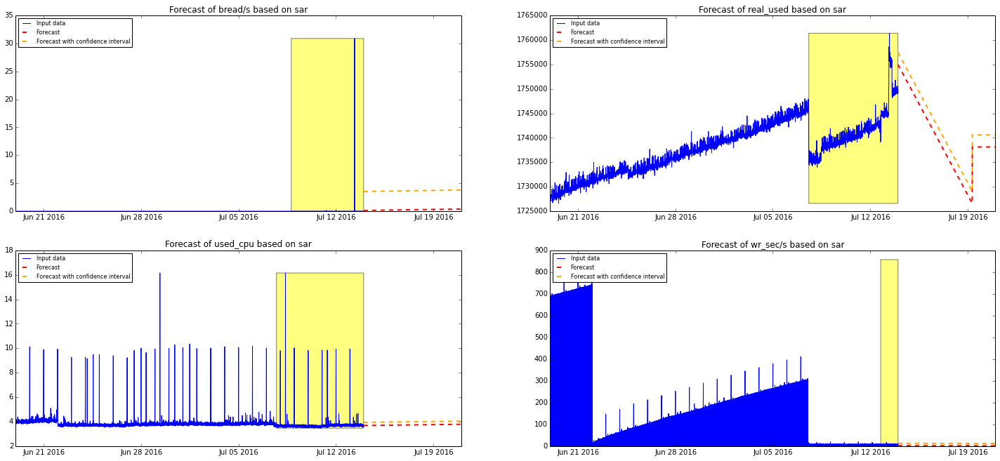

db102.pc.prod.ed1


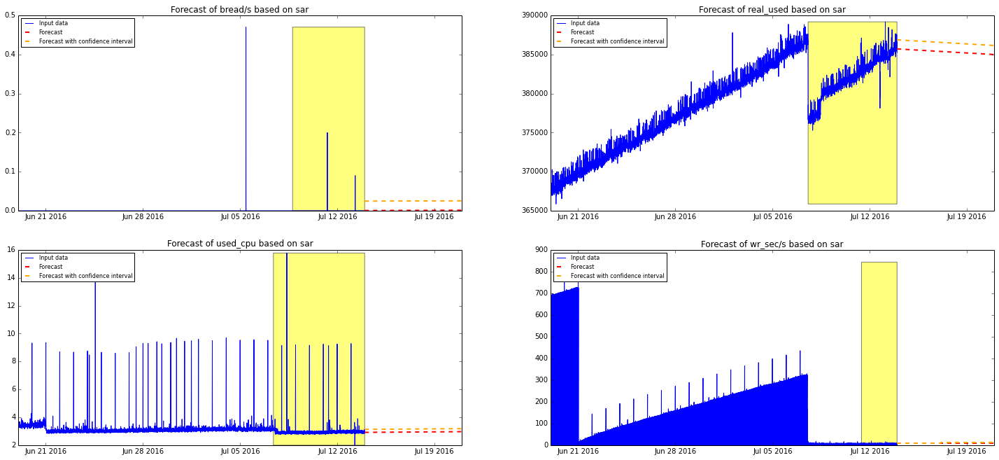

fe101.pc.prod.ed1


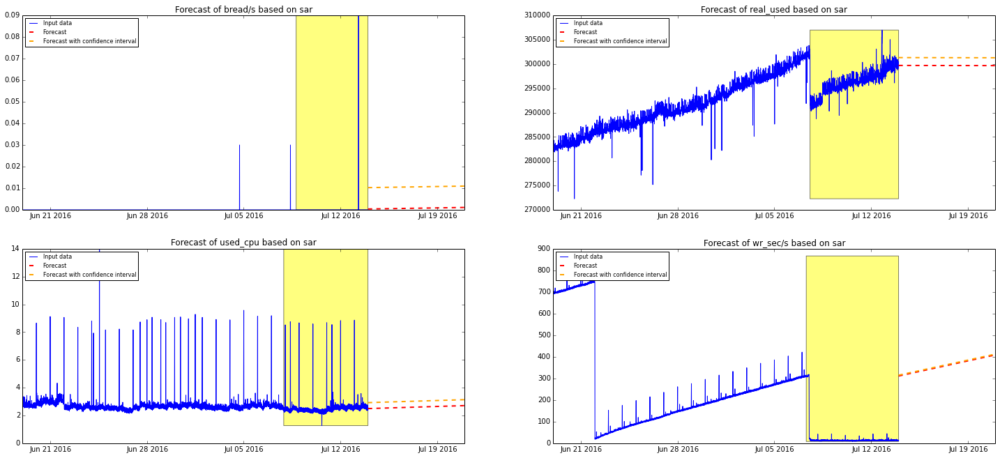

fe102.pc.prod.ed1


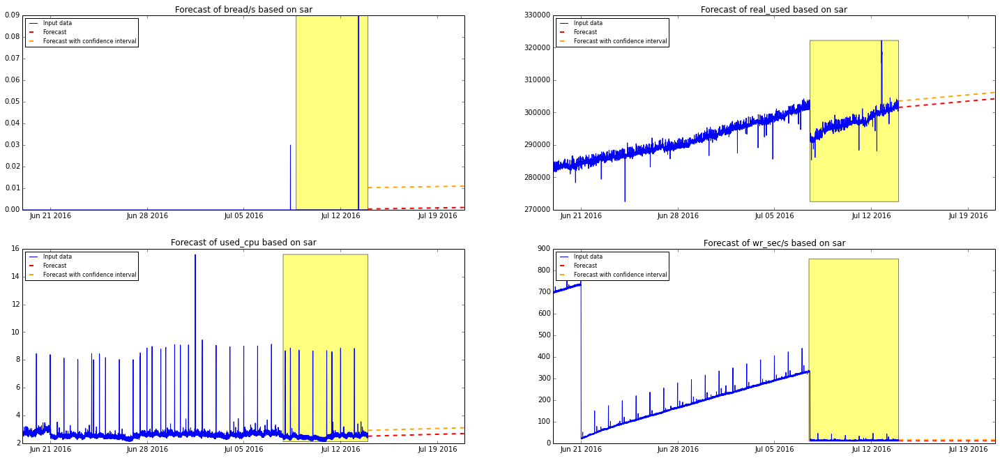

red004.lp.prod.ed1


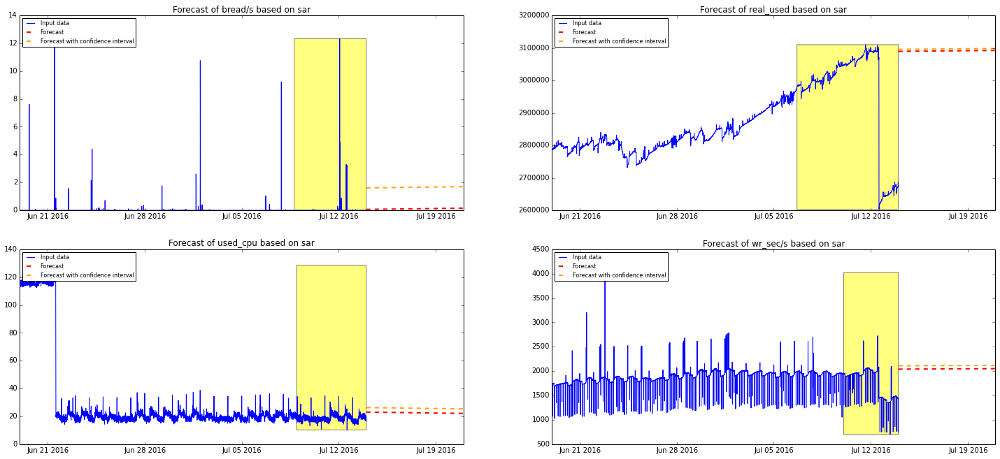

red005.lp.prod.ed1


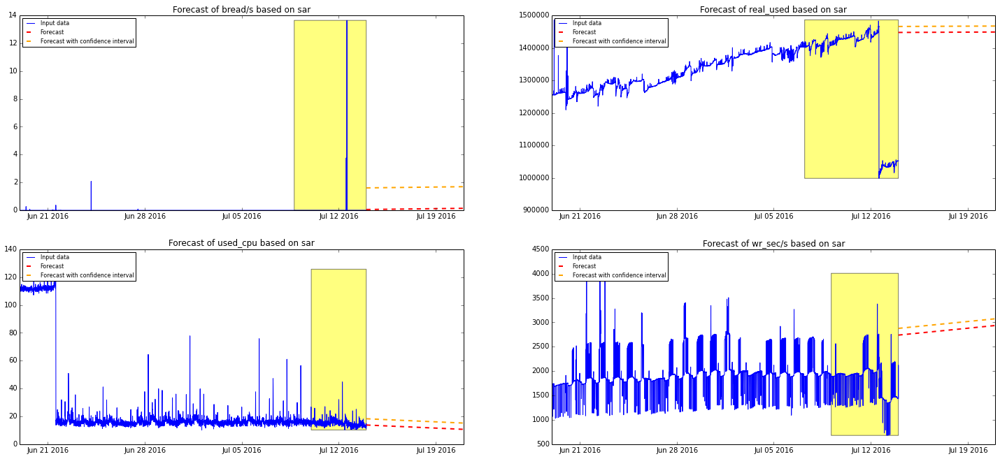

red006.lp.prod.ed1


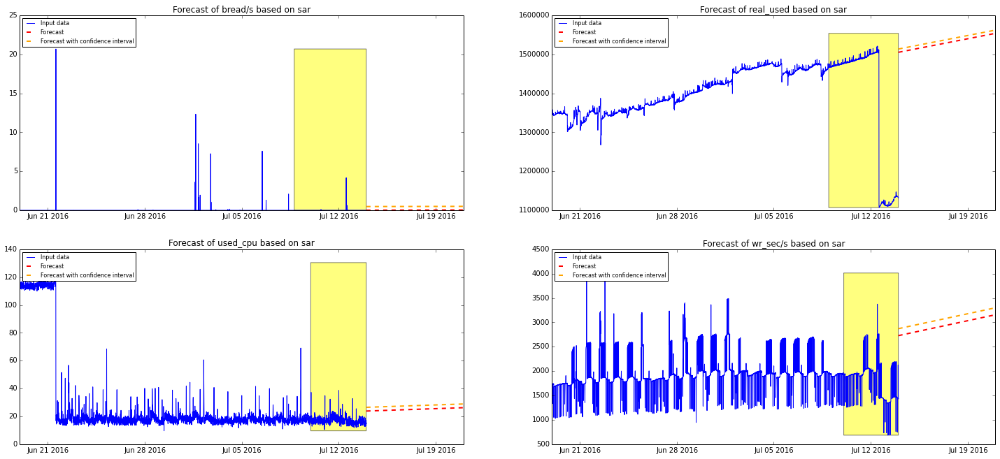

red002.lp.prod.ed1
red003.lp.prod.ed1


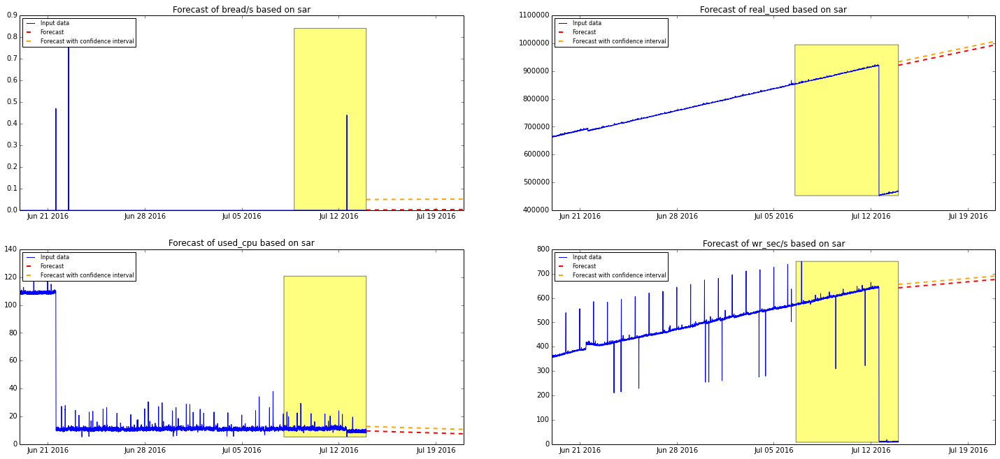

web001.lp.prod.ed1


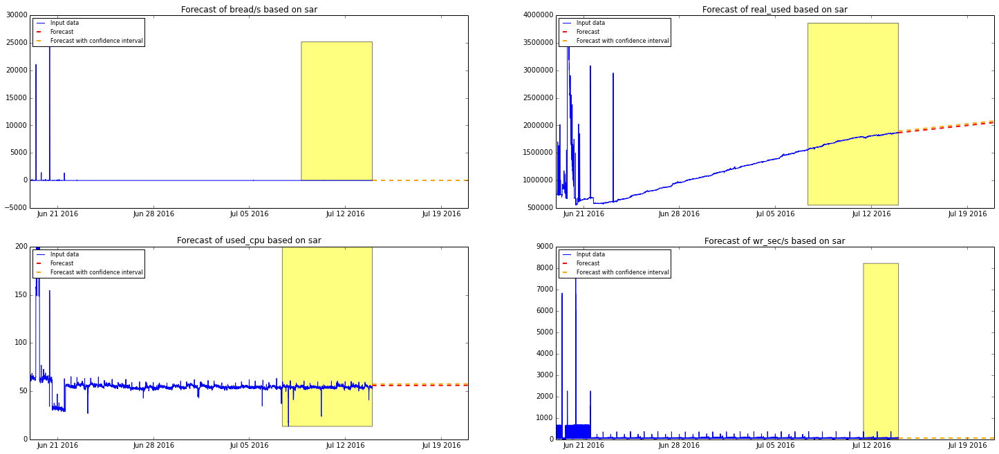

web002.lp.prod.ed1


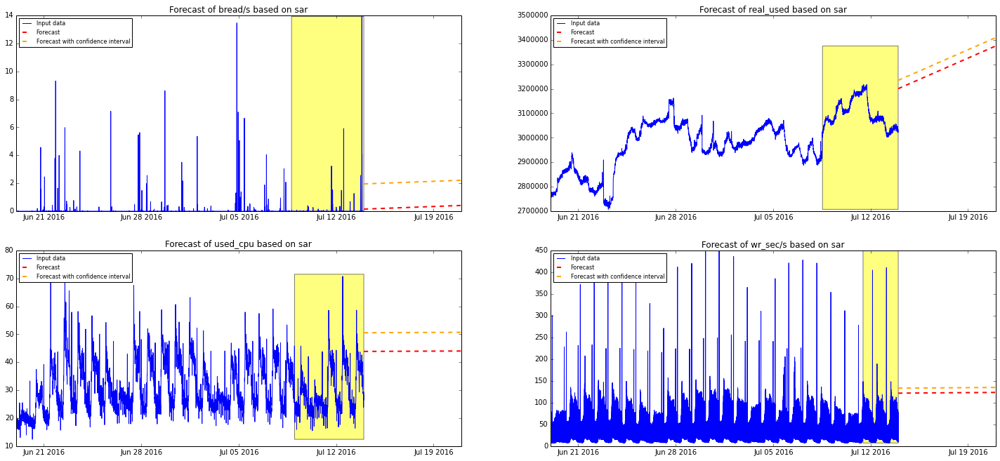

web003.lp.prod.ed1


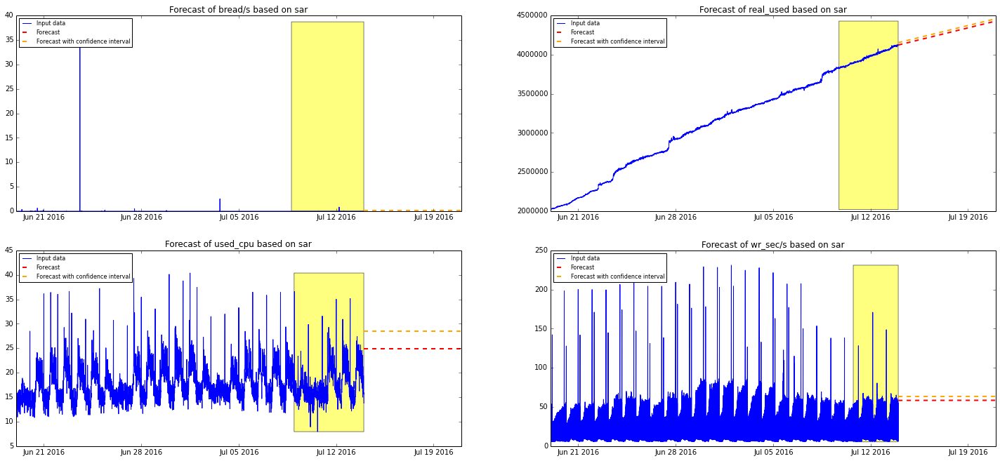

web004.lp.prod.ed1


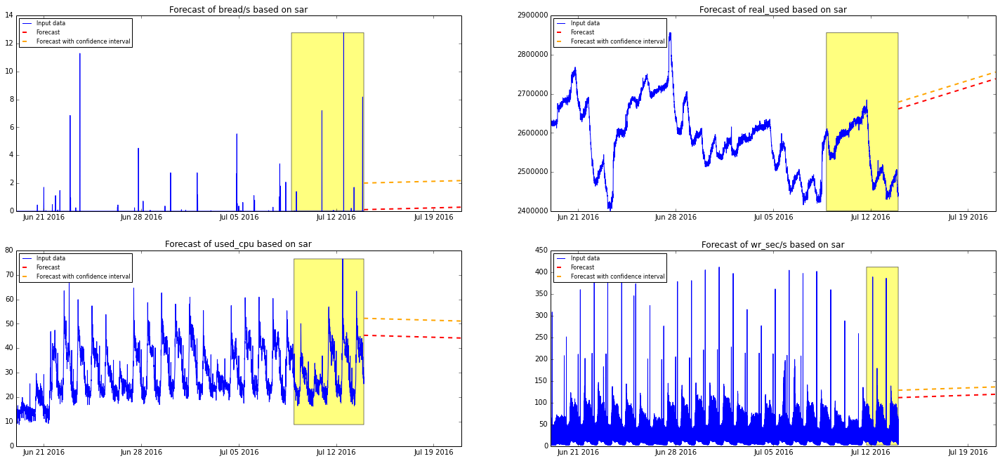

web005.lp.prod.ed1


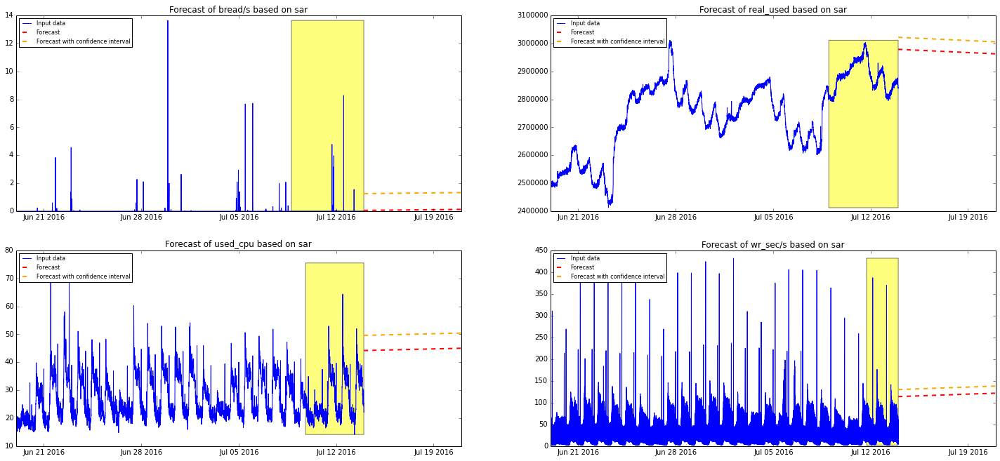

fe001.sc.prod.ed1
fe002.sc.prod.ed1
fe003.sc.prod.ed1
fe004.sc.prod.ed1
fe005.sc.prod.ed1
fe006.sc.prod.ed1
fe007.sc.prod.ed1
fe008.sc.prod.ed1
red101.sc.prod.ed1


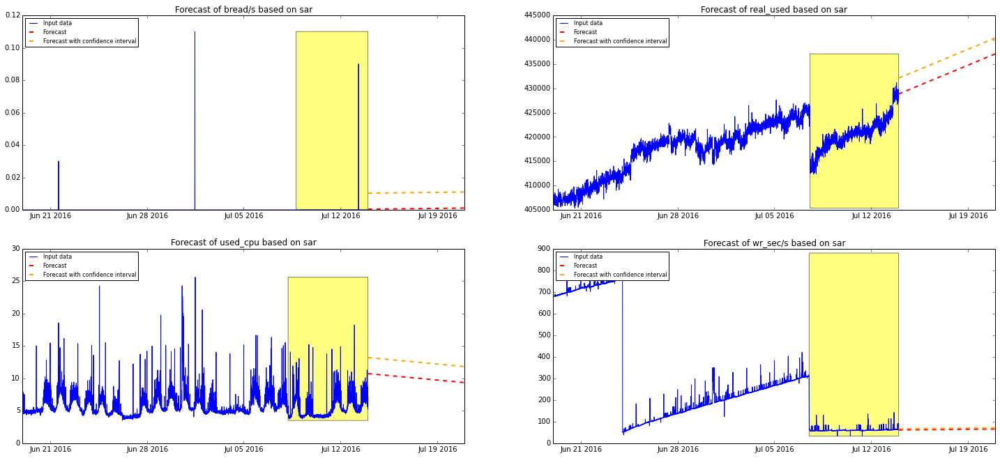

red102.sc.prod.ed1


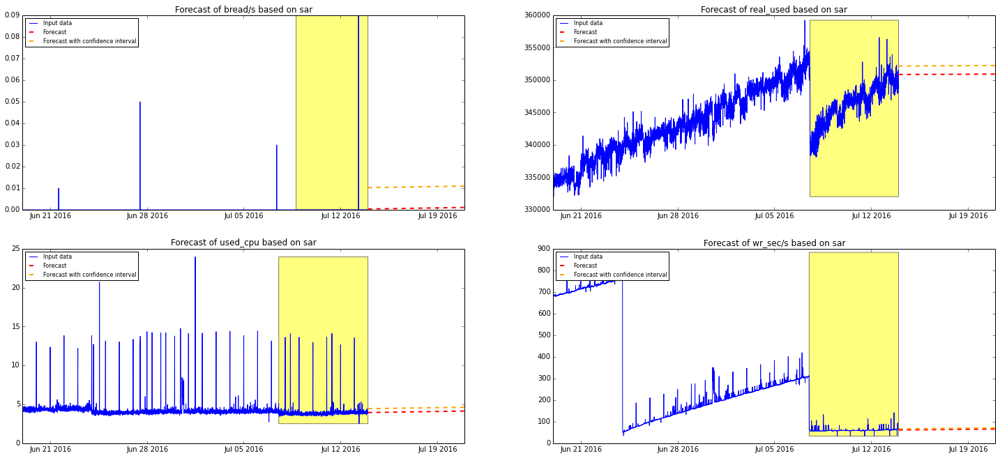

red103.sc.prod.ed1


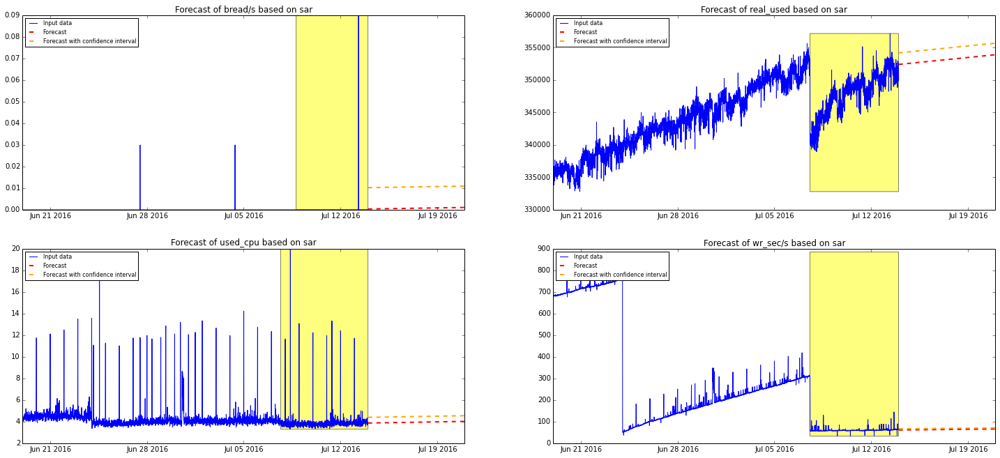

be101.fsa.prod.ed1


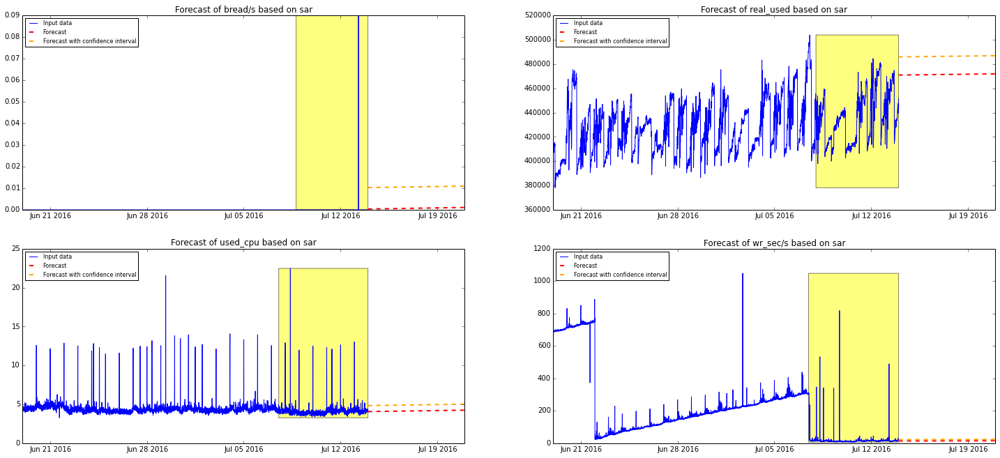

be102.fsa.prod.ed1


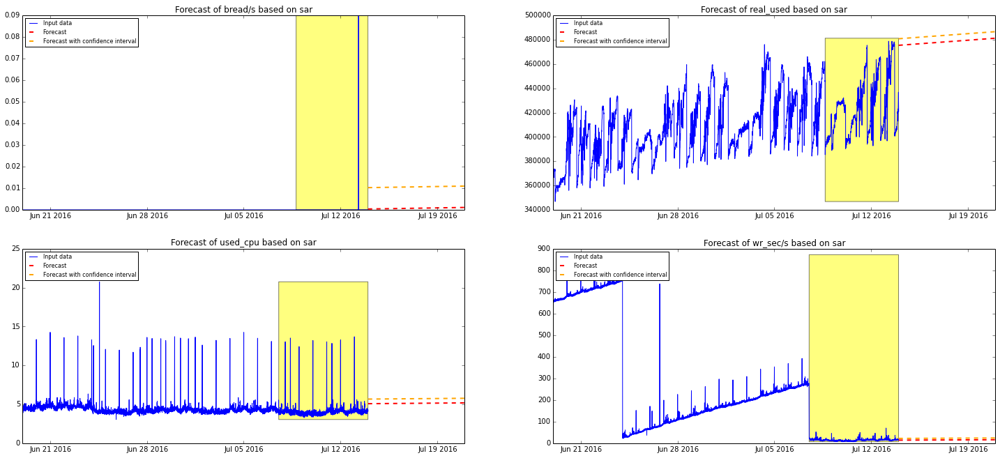

be103.fsa.prod.ed1


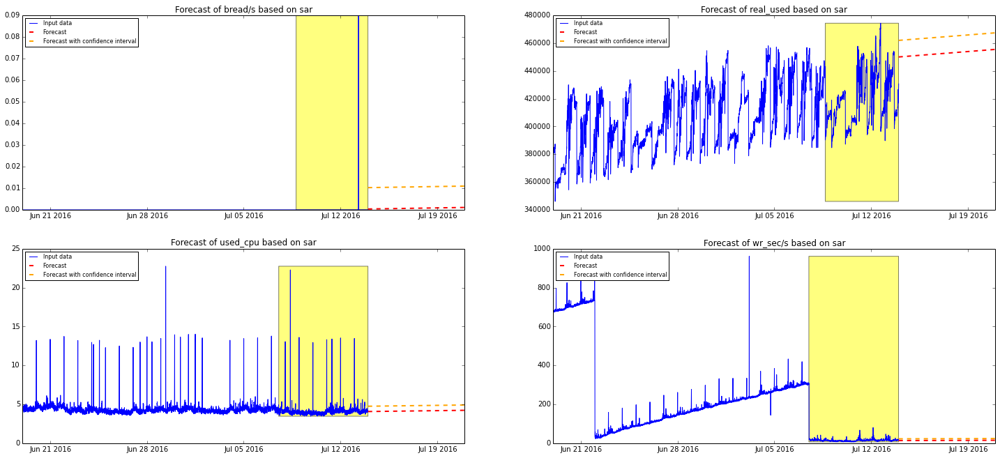

be104.fsa.prod.ed1


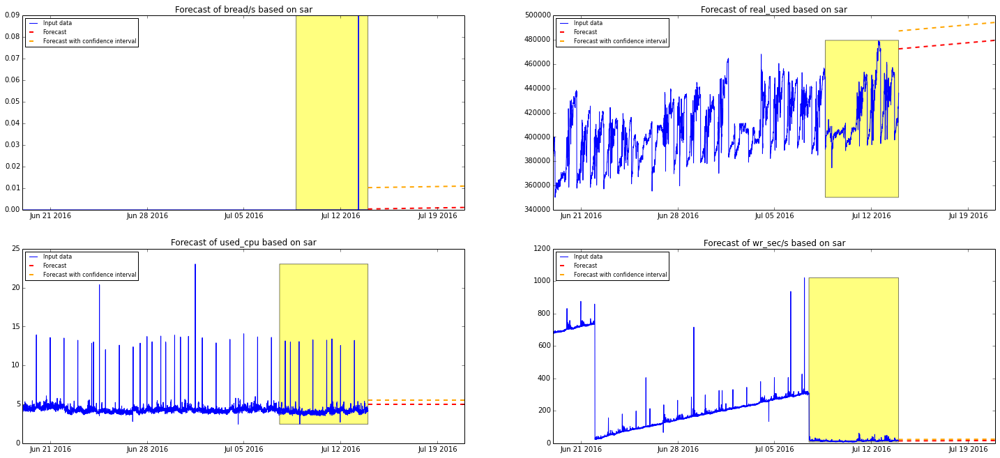

be101.rgt.prod.ed1


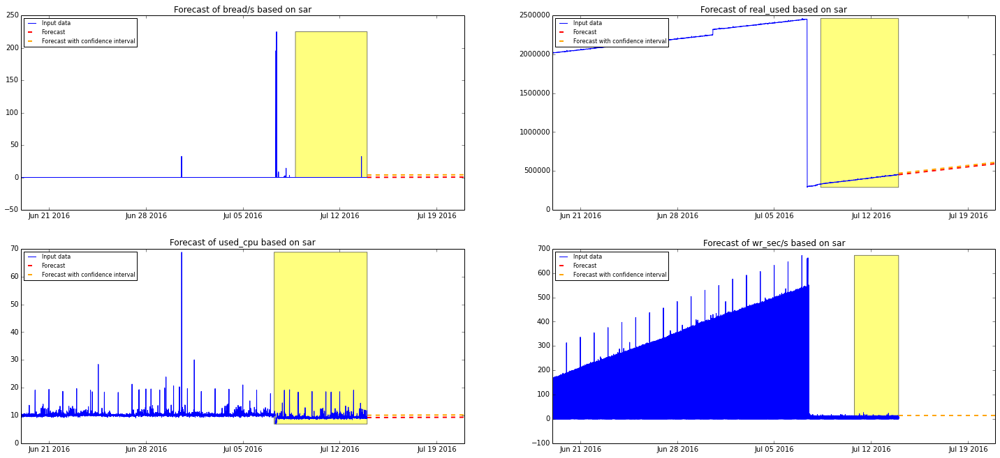

be102.rgt.prod.ed1


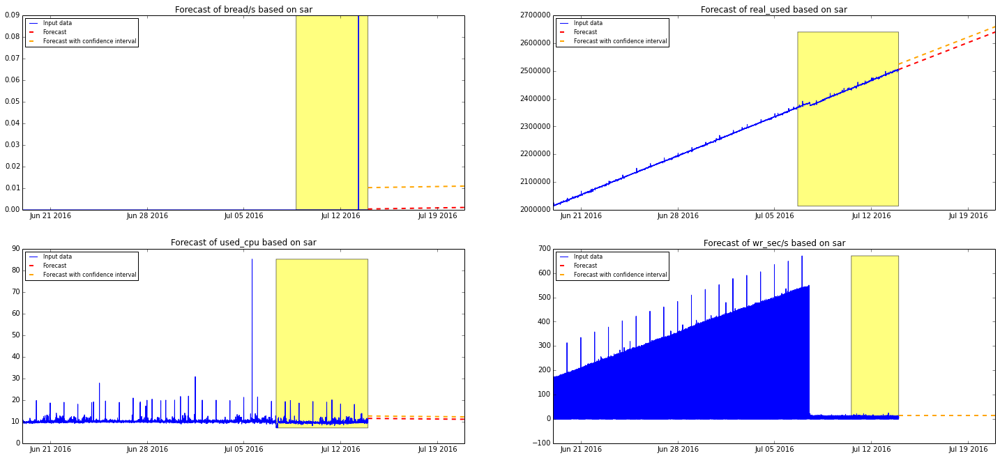

be103.rgt.prod.ed1


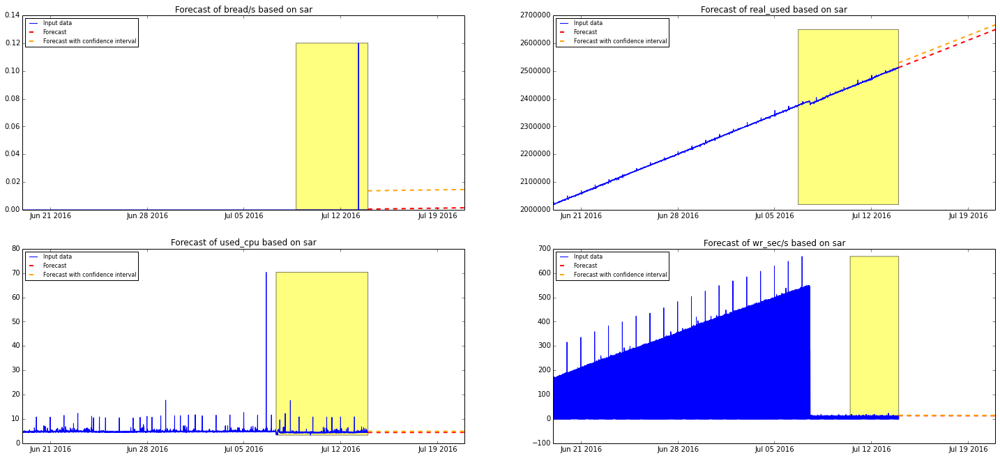

be104.rgt.prod.ed1


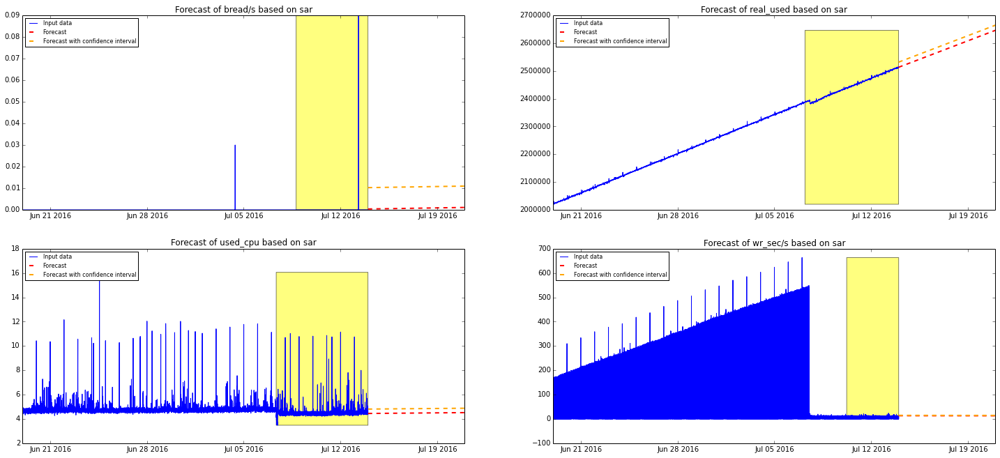

be105.rgt.prod.ed1


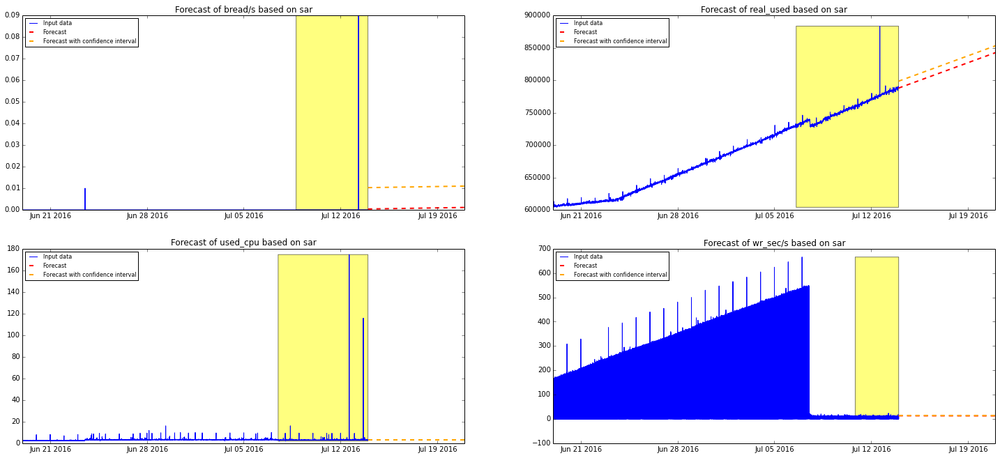

be106.rgt.prod.ed1


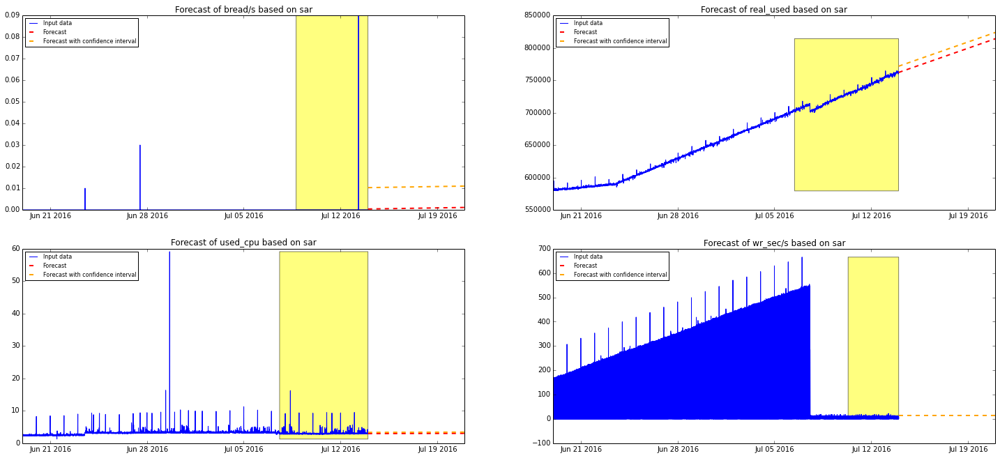

be107.rgt.prod.ed1


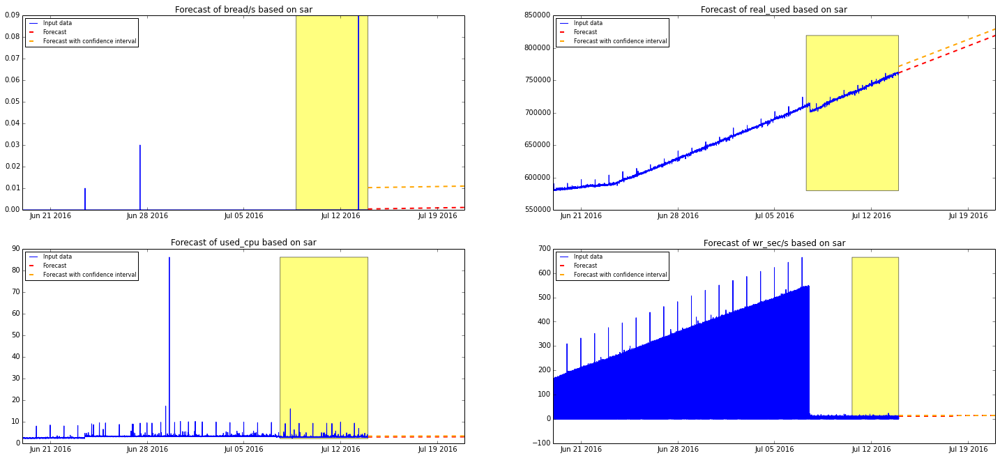

be108.rgt.prod.ed1


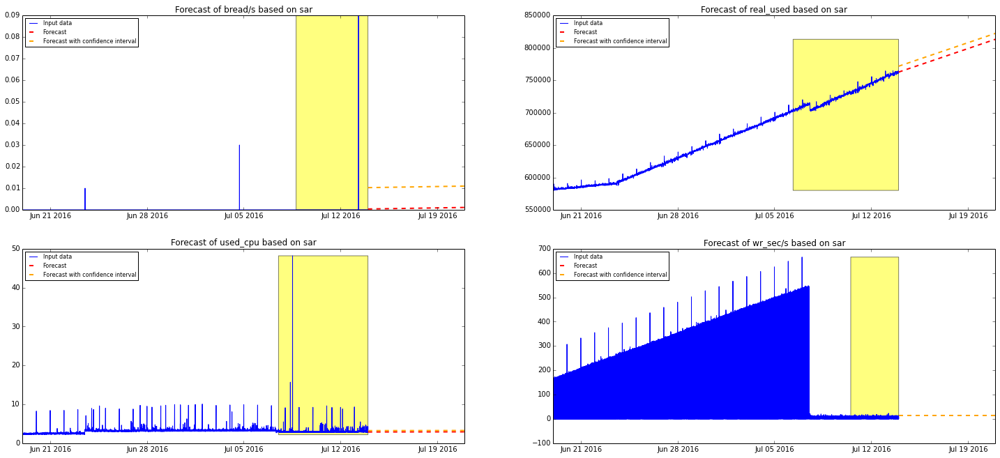

ha101.rgt.prod.ed1


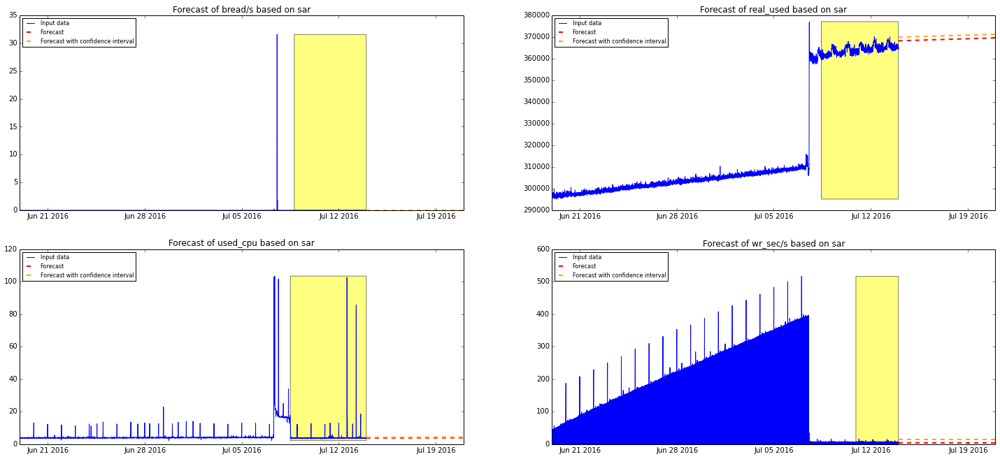

ha102.rgt.prod.ed1


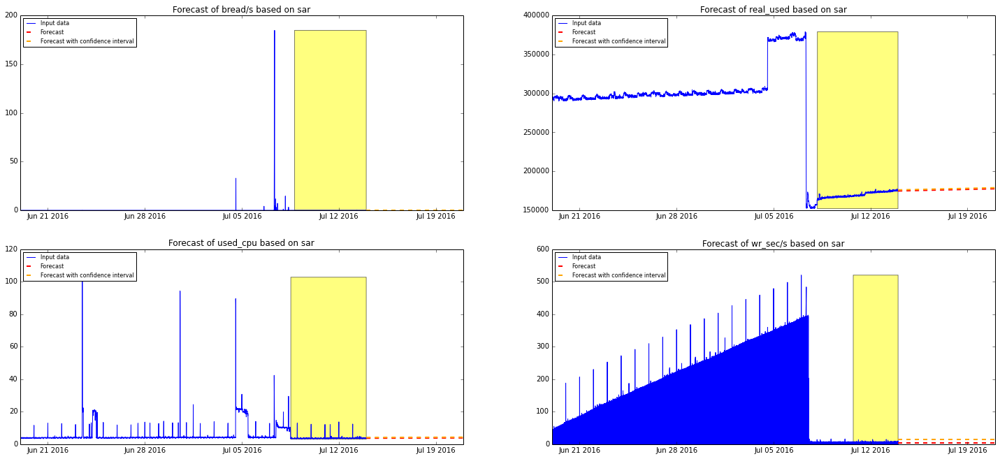

be101.sl.prod.ed1


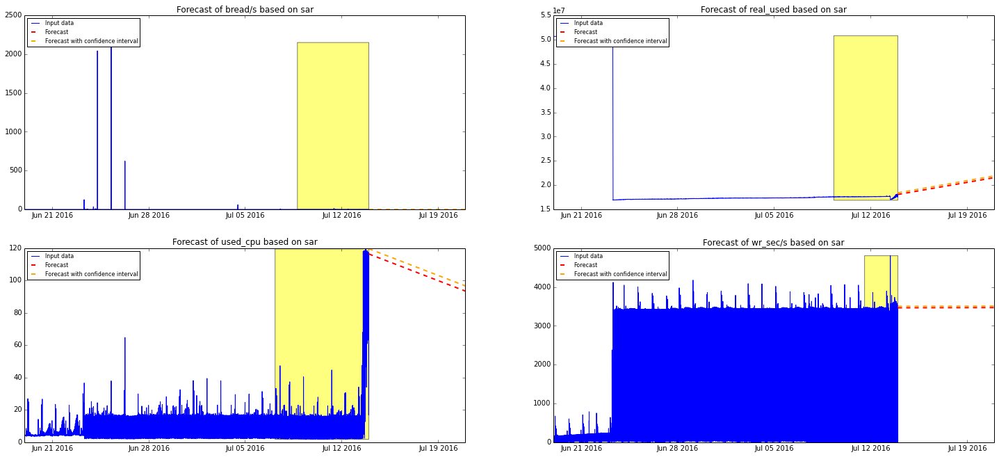

be102.sl.prod.ed1


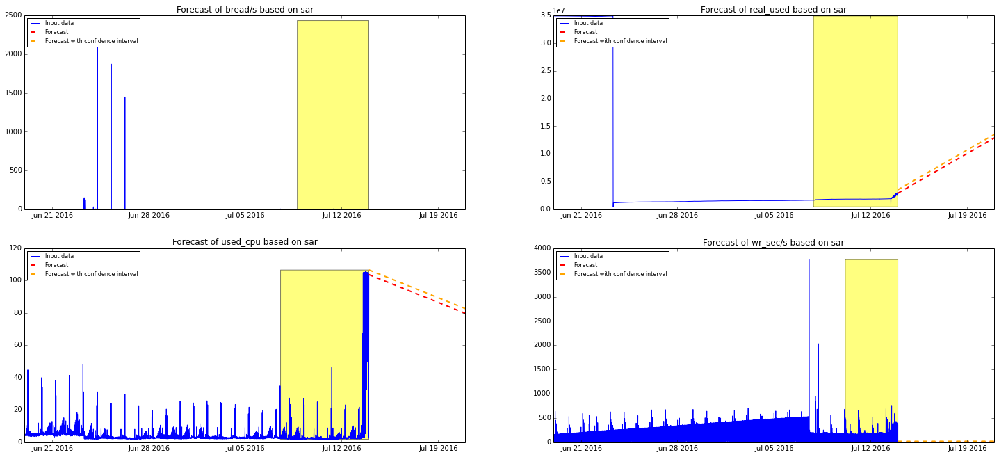

be103.sl.prod.ed1


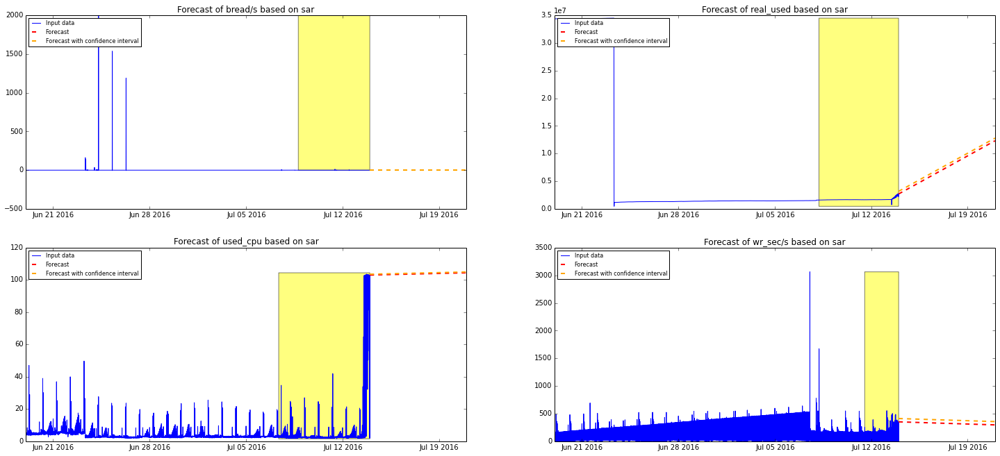

be101.sl.prod.ed2


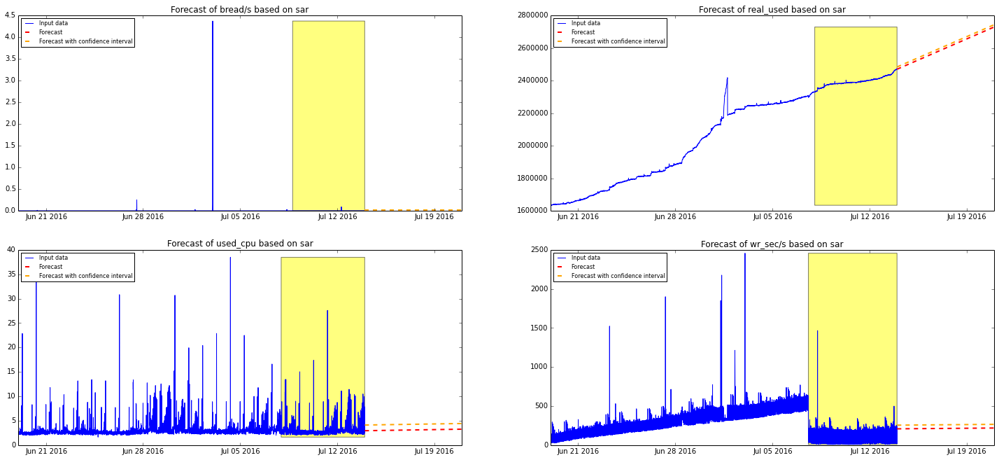

be102.sl.prod.ed2


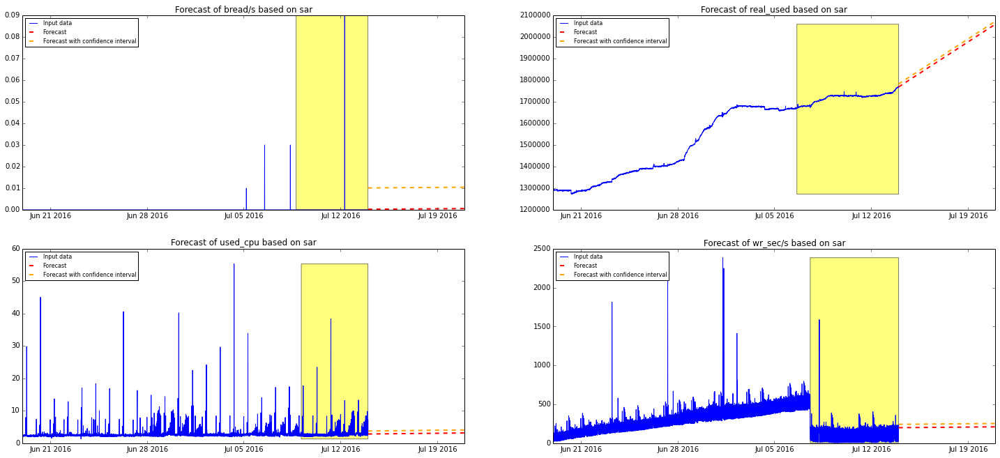

be103.sl.prod.ed2


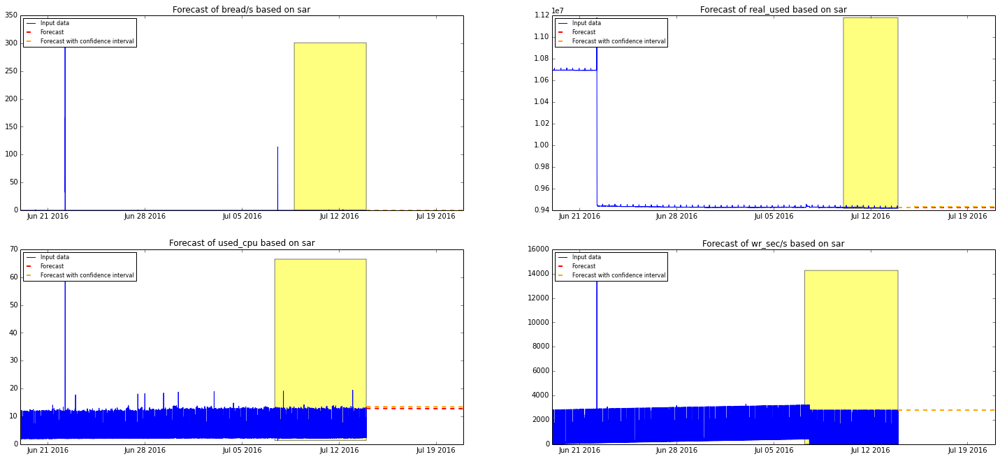

be101.sl.prod.ed5


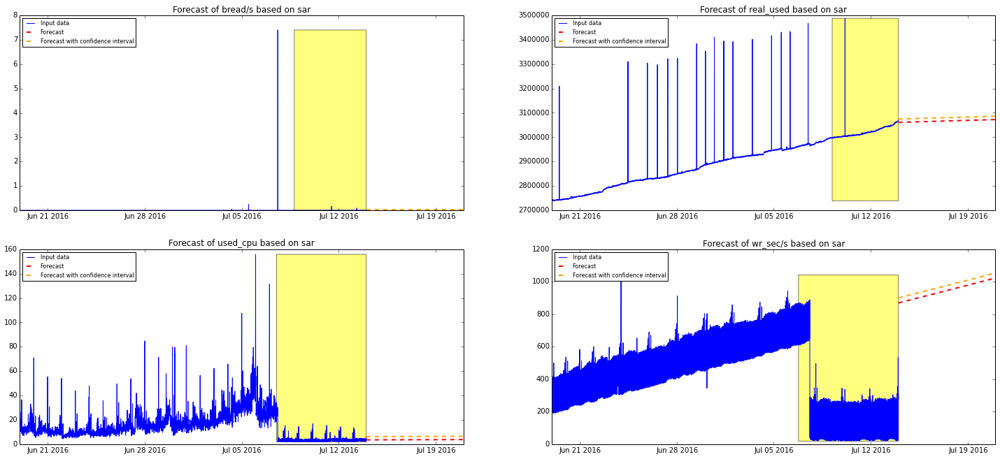

be102.sl.prod.ed5


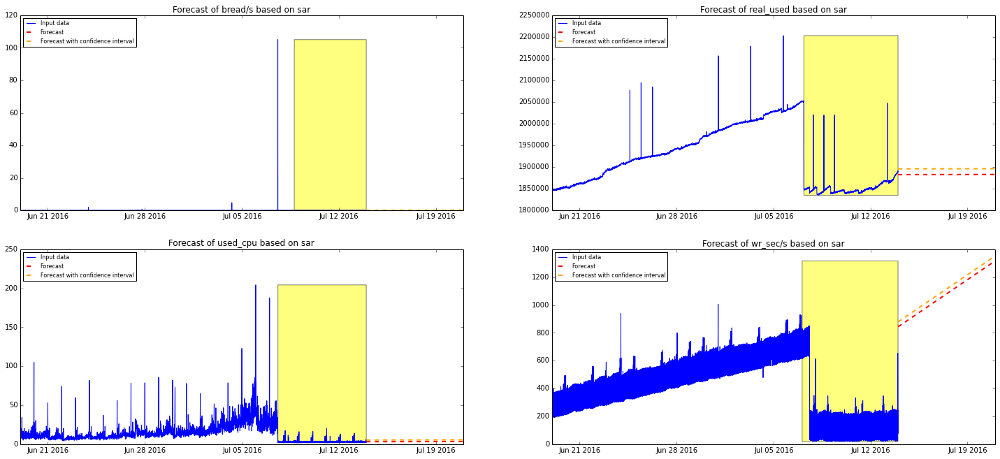

be103.sl.prod.ed5


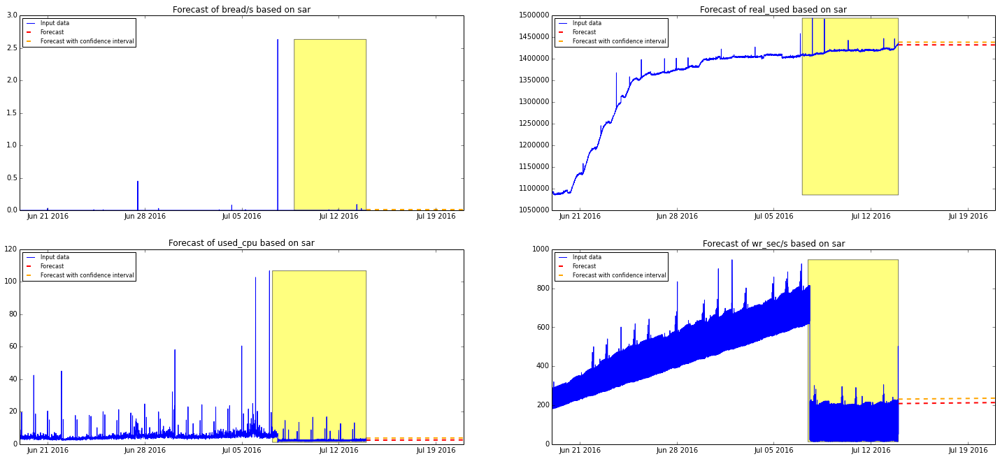

db101.sl.prod.ed1


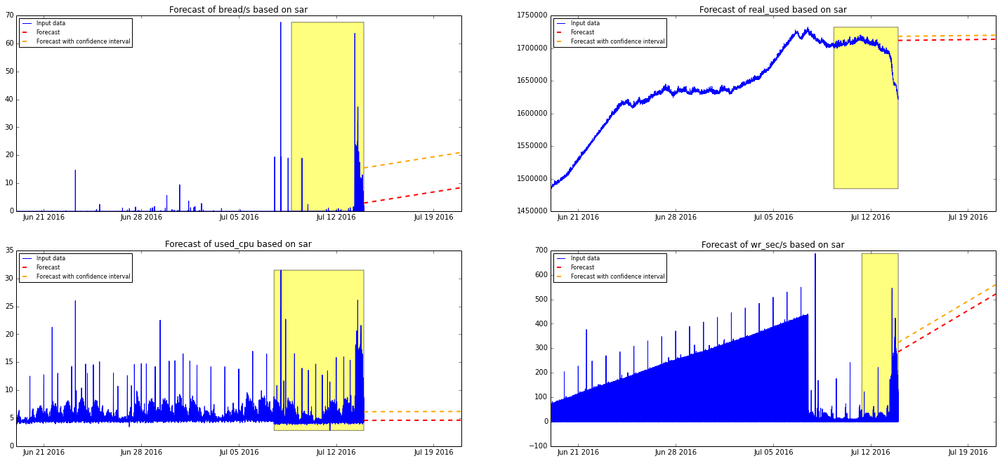

db102.sl.prod.ed1


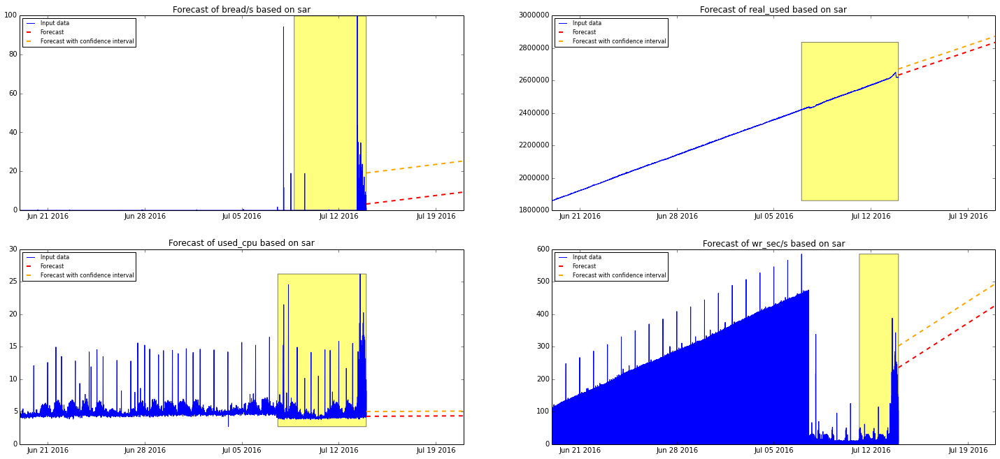

db101.sl.prod.ed2


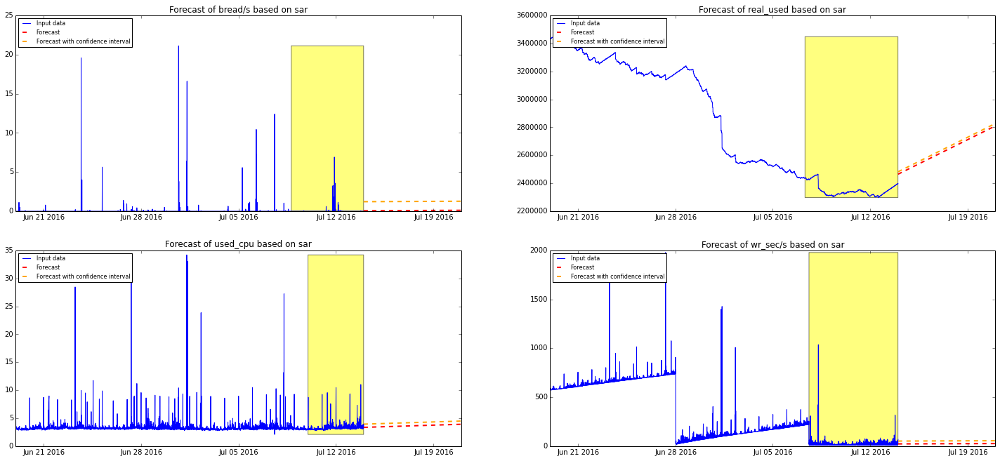

db102.sl.prod.ed2


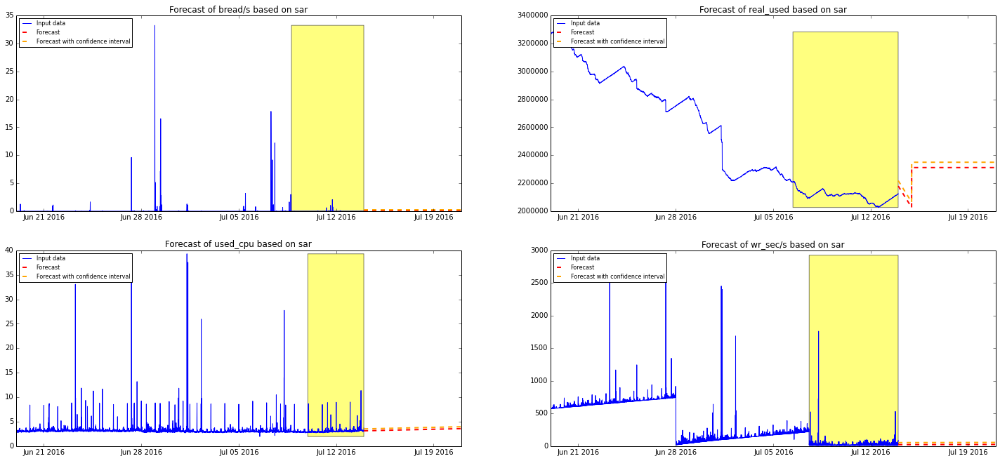

db101.sl.prod.ed5


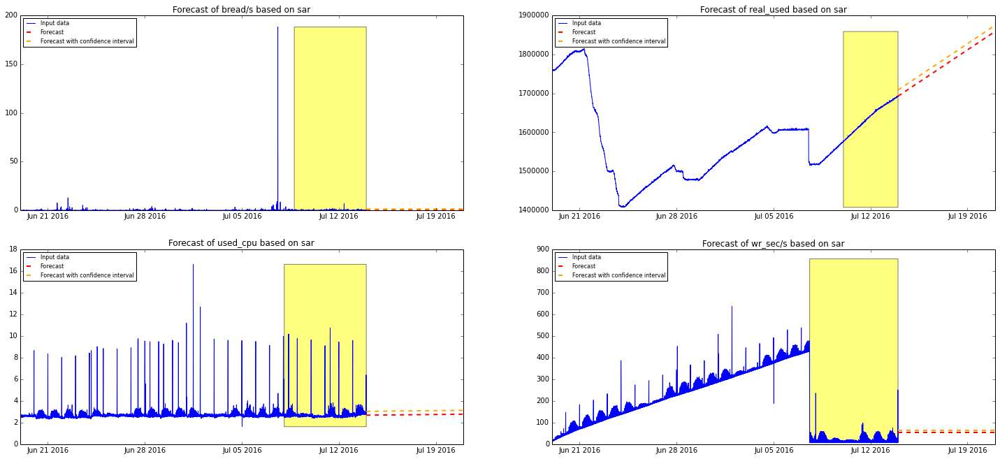

db102.sl.prod.ed5


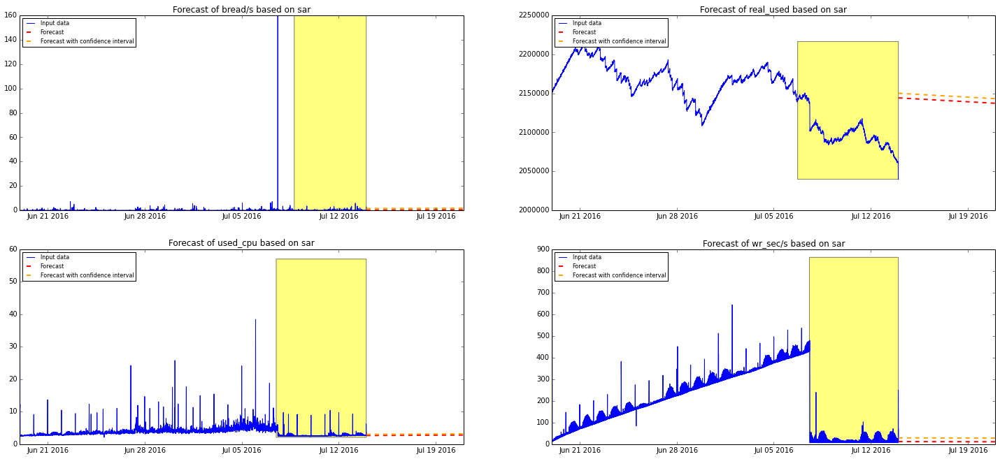

web001.api.prod.ed1


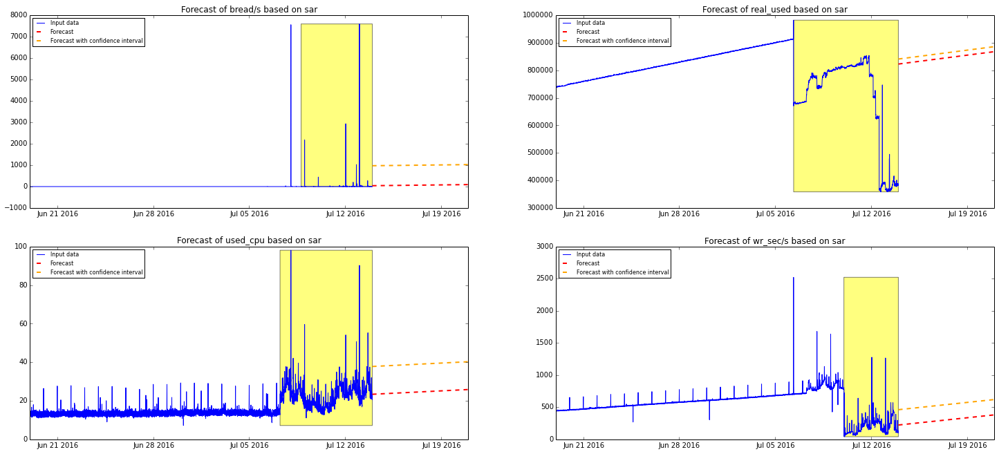

web002.api.prod.ed1


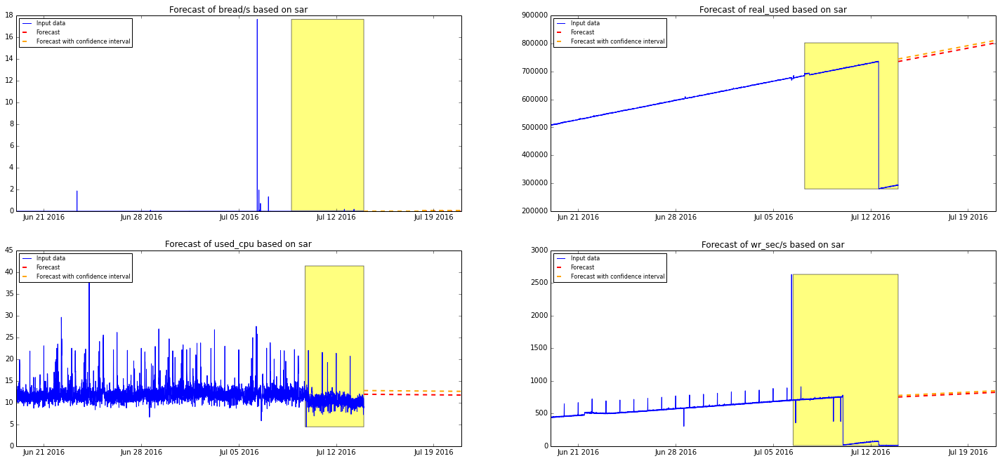

web003.api.prod.ed1


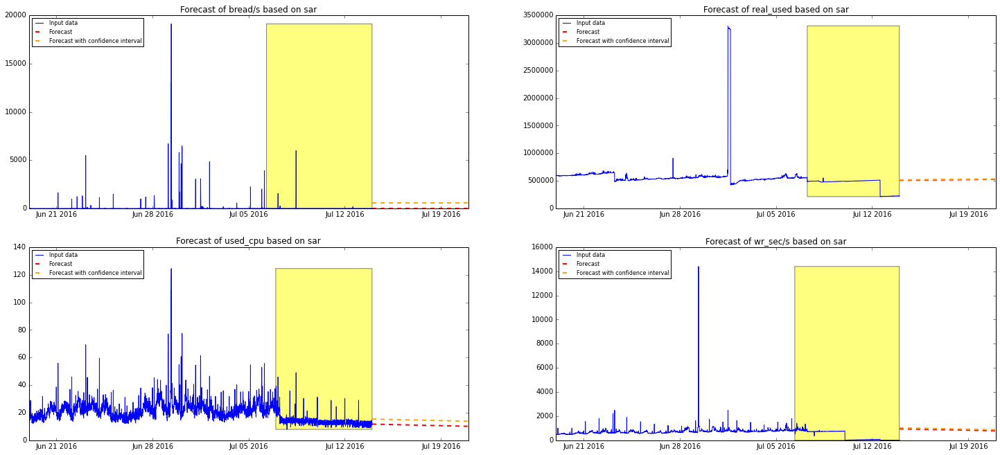

web004.api.prod.ed1


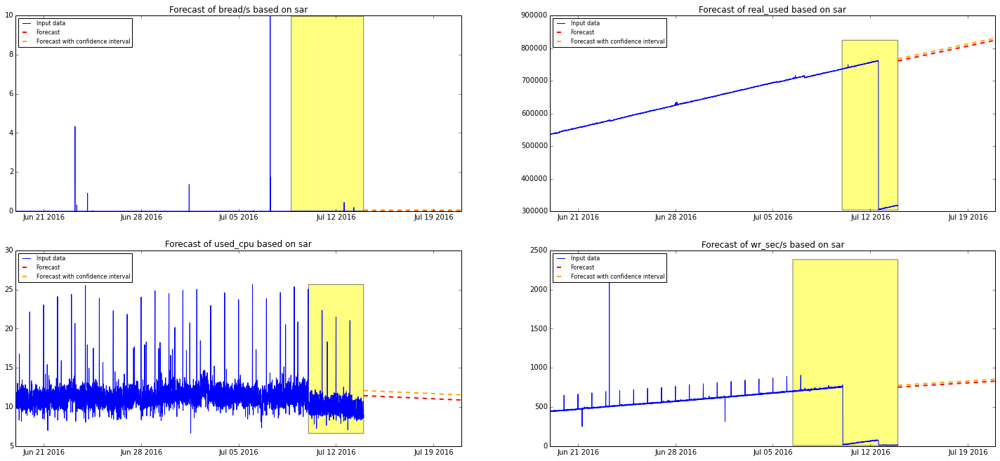

web101.api.prod.ed2


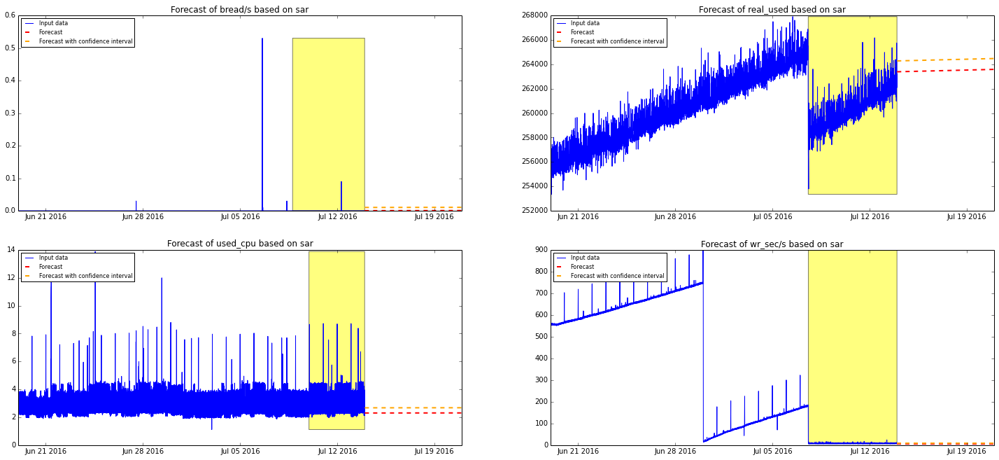

web102.api.prod.ed2


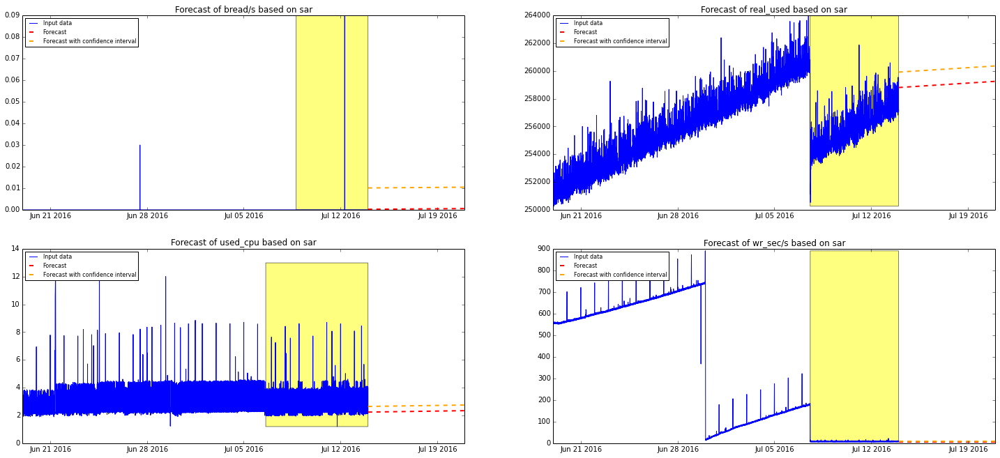

web101.api.prod.ed5


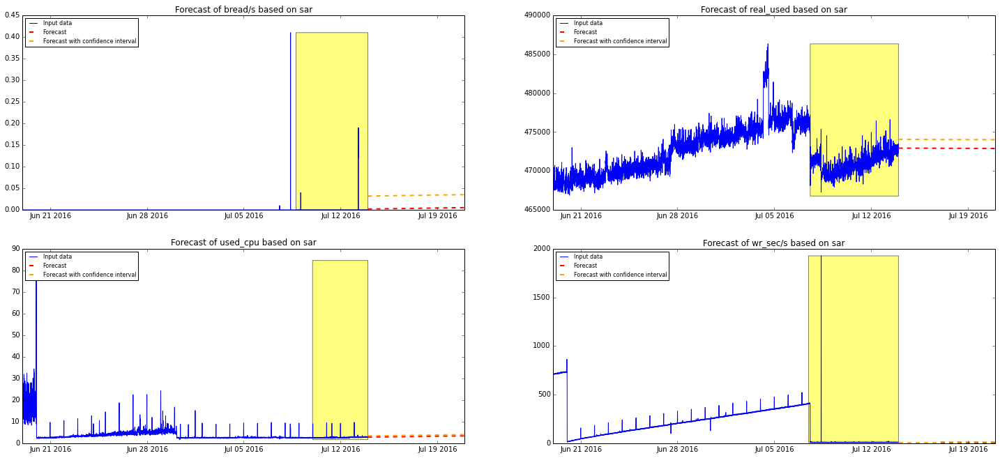

web102.api.prod.ed5


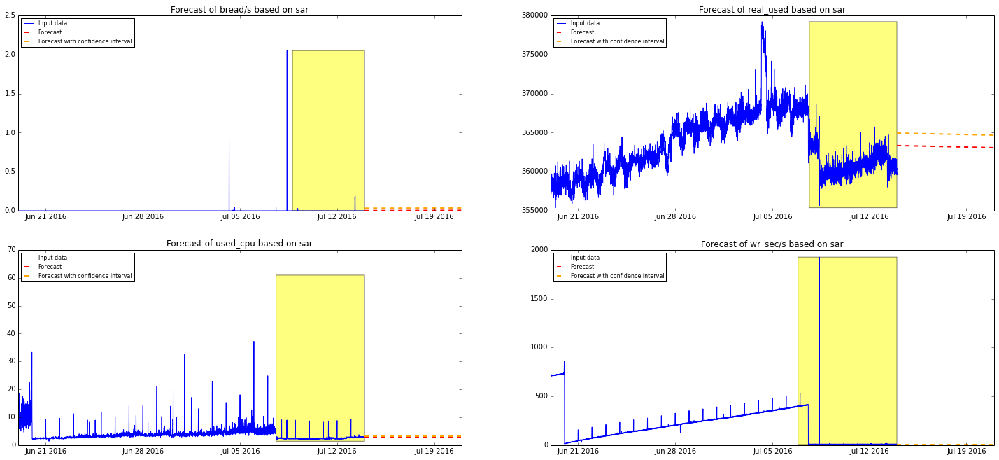

web103.api.prod.ed5


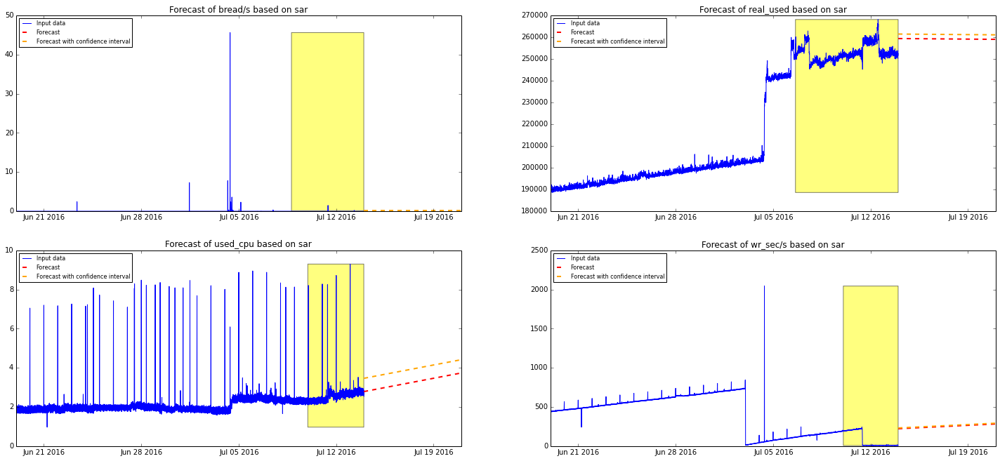

web104.api.prod.ed5


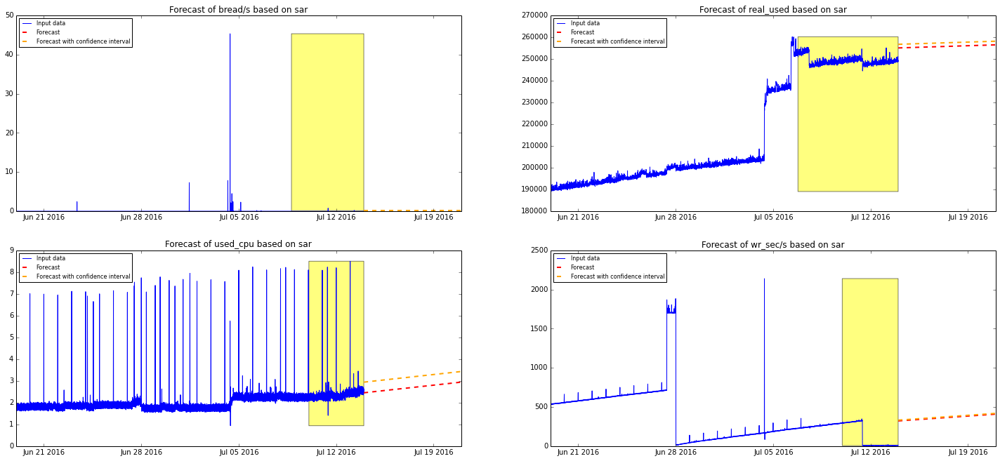

app101.eta.prod.ed1


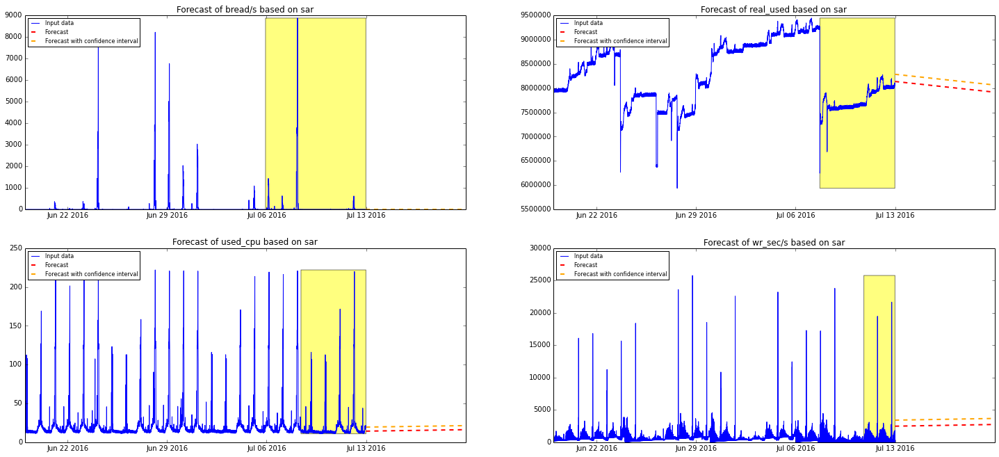

app102.eta.prod.ed1


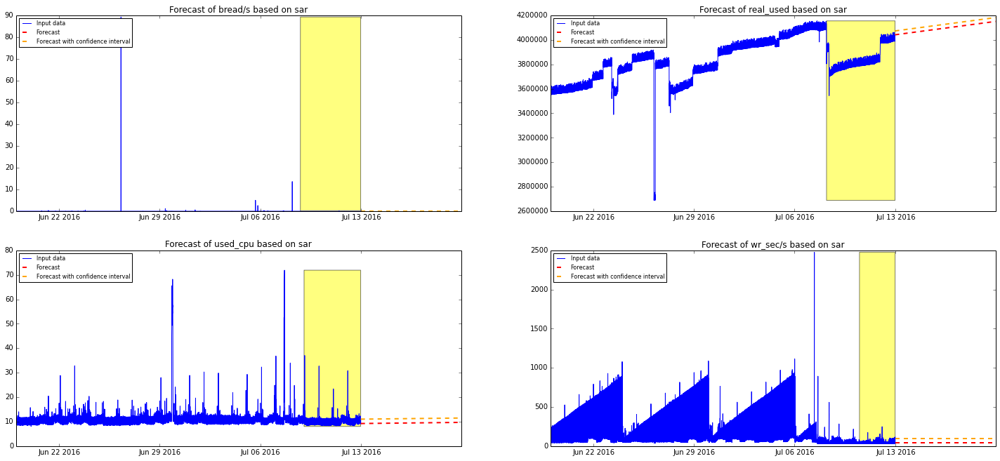

app103.eta.prod.ed1


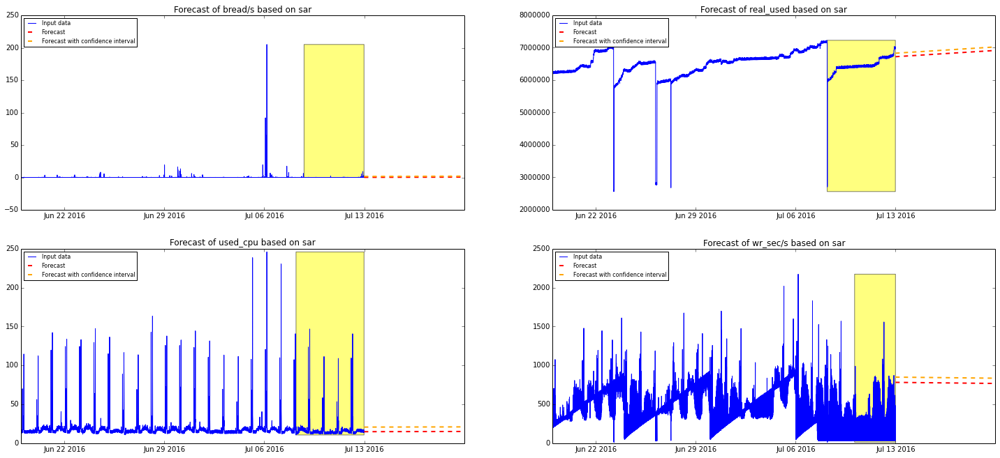

app104.eta.prod.ed1


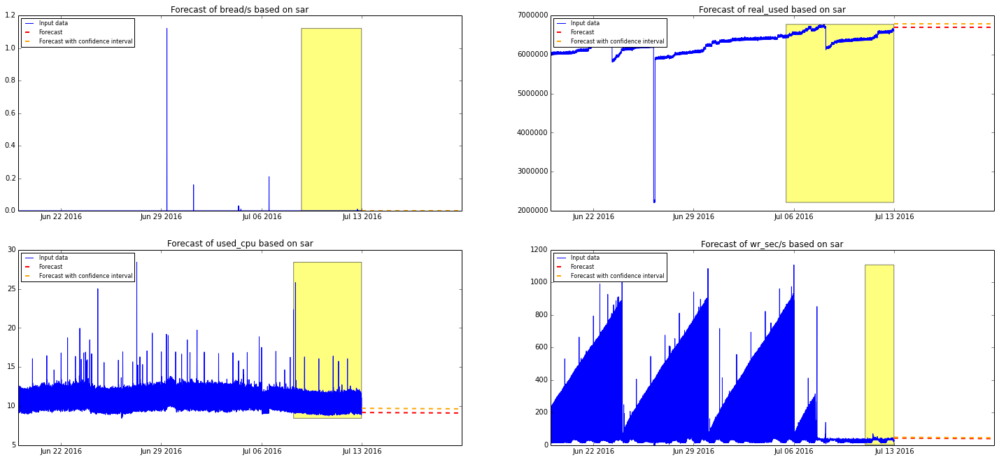

app105.eta.prod.ed1


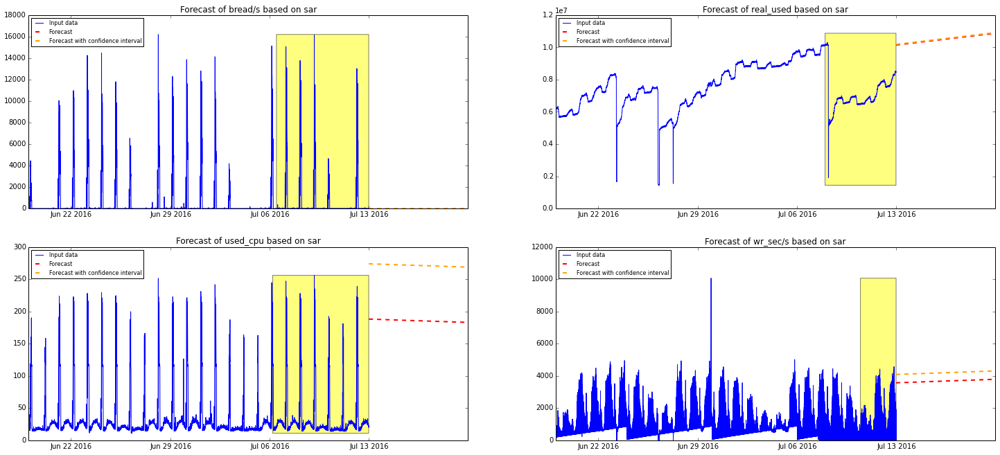

app106.eta.prod.ed1


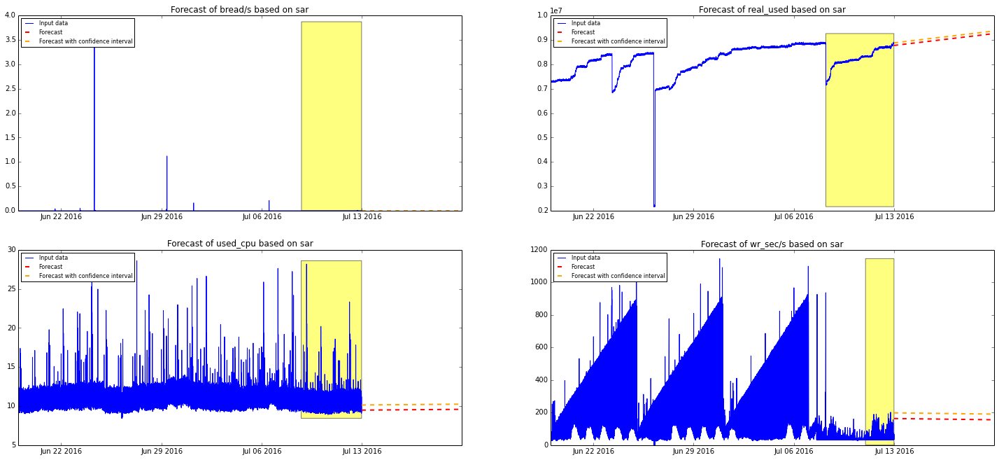

app107.eta.prod.ed1


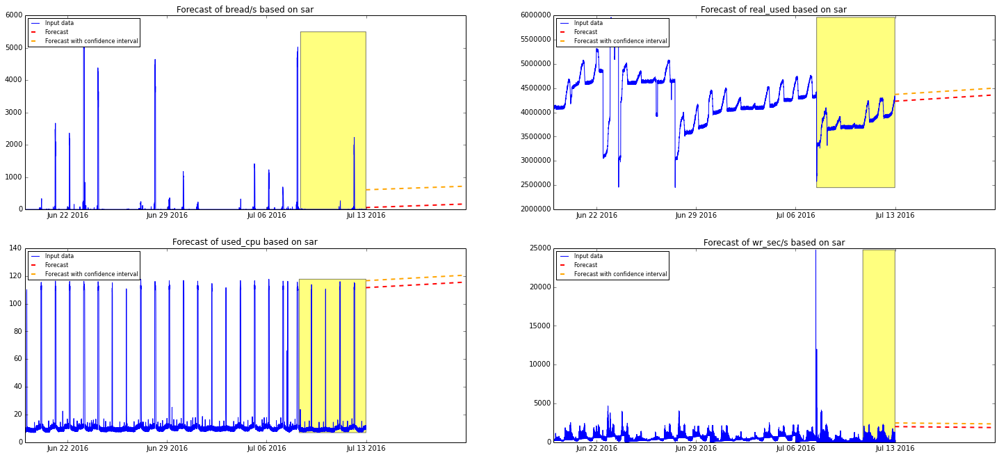

app108.eta.prod.ed1


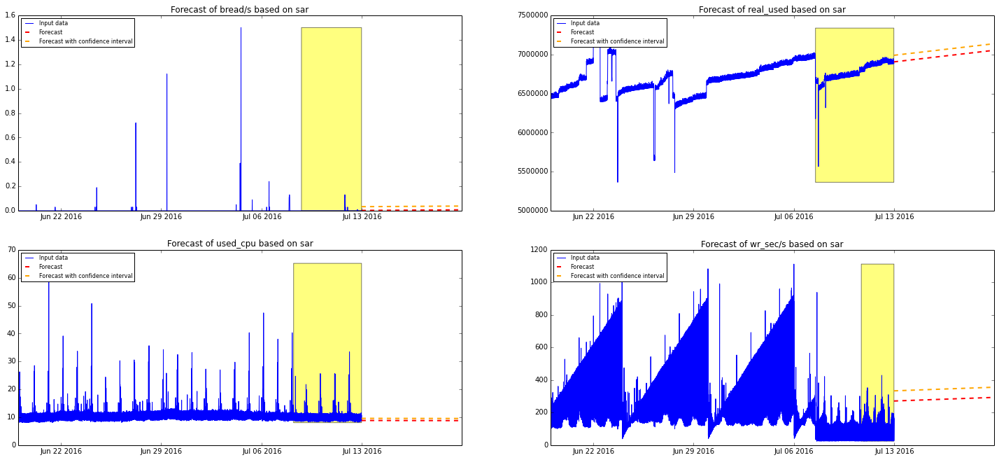

app109.eta.prod.ed1


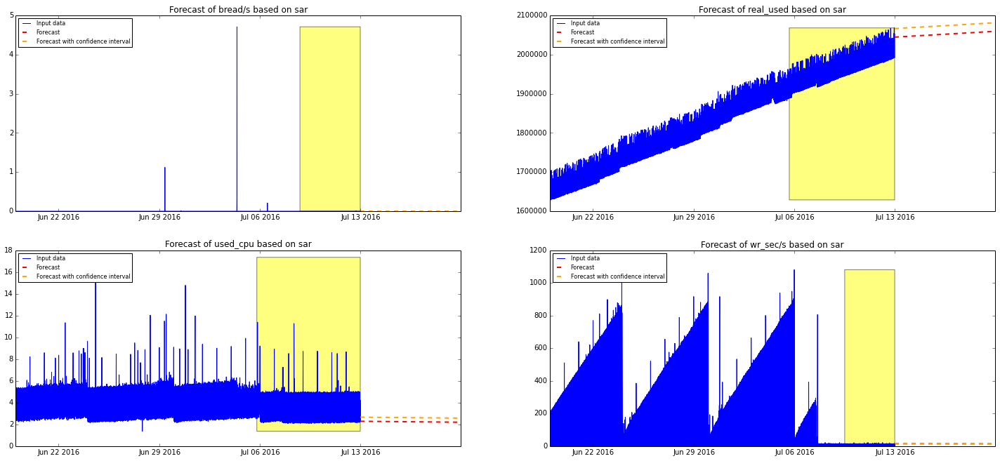

app110.eta.prod.ed1


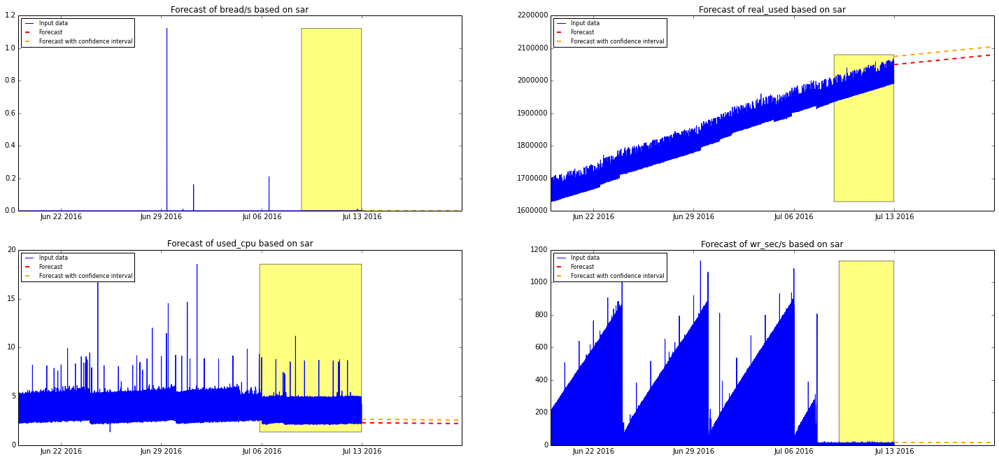

app111.eta.prod.ed1


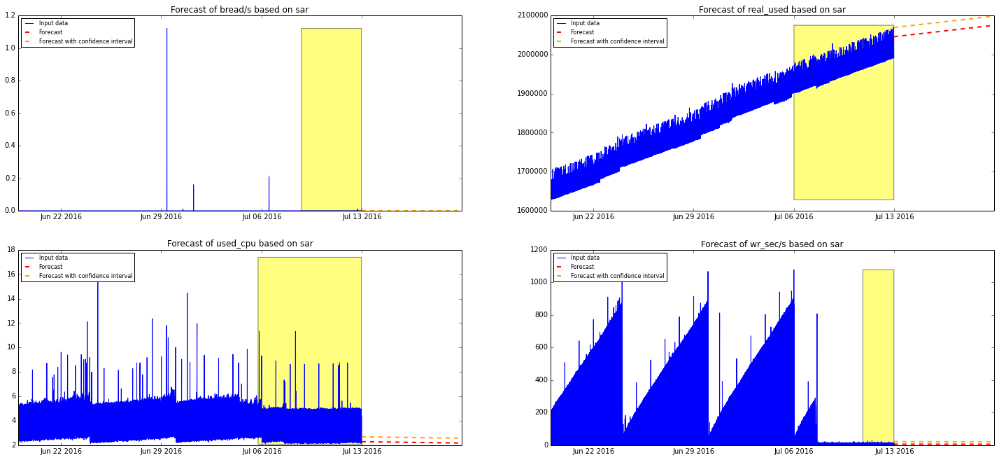

app112.eta.prod.ed1


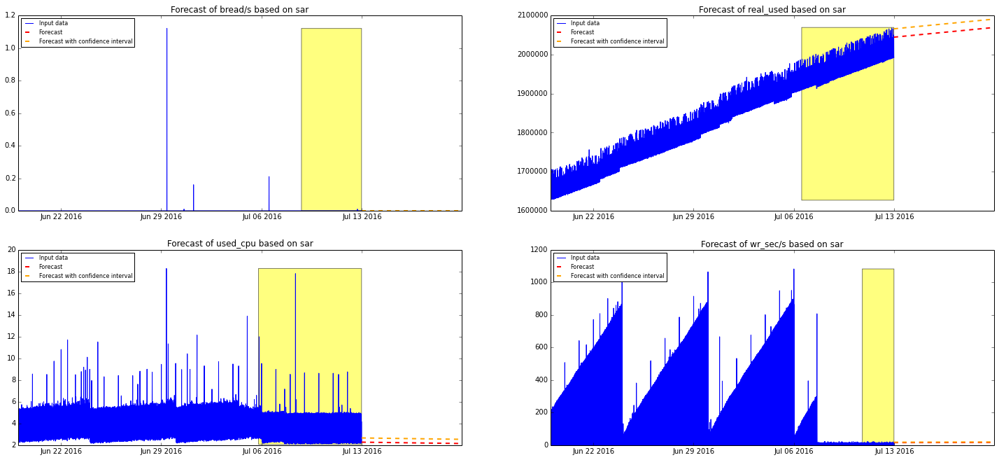

app101.eta.prod.ed5


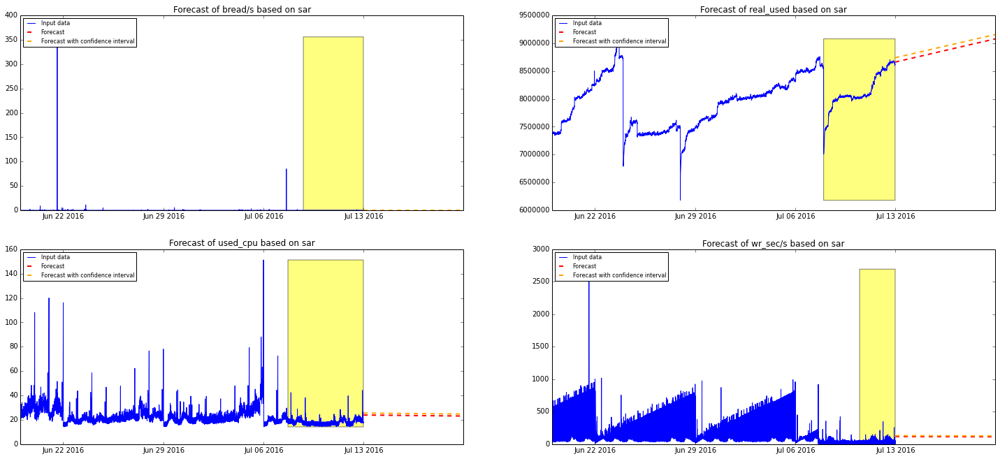

app102.eta.prod.ed5


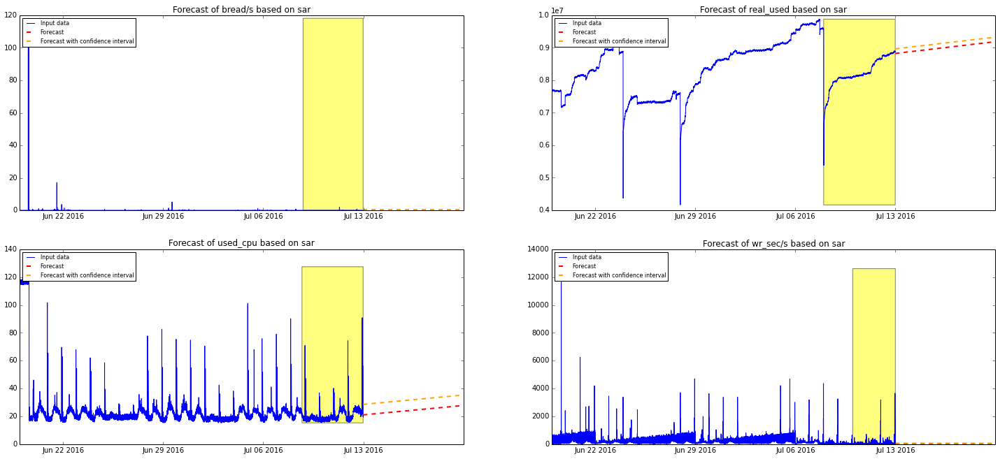

app103.eta.prod.ed5


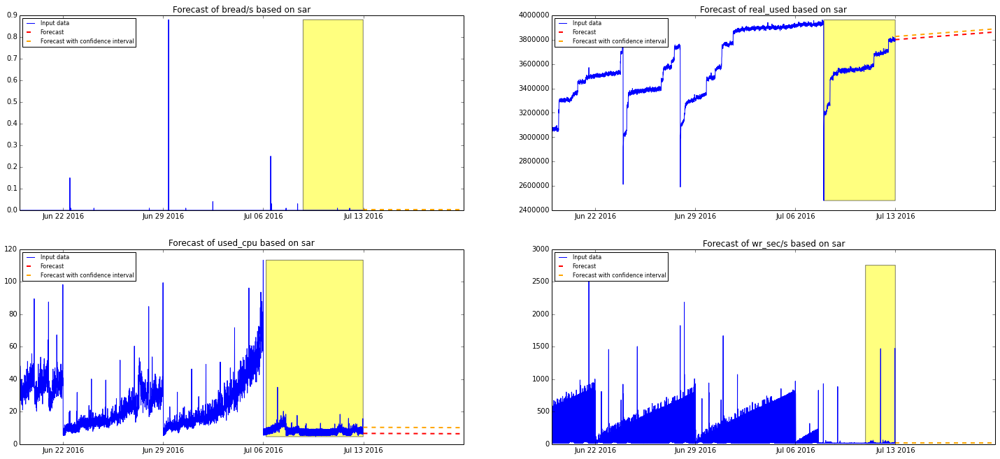

app104.eta.prod.ed5


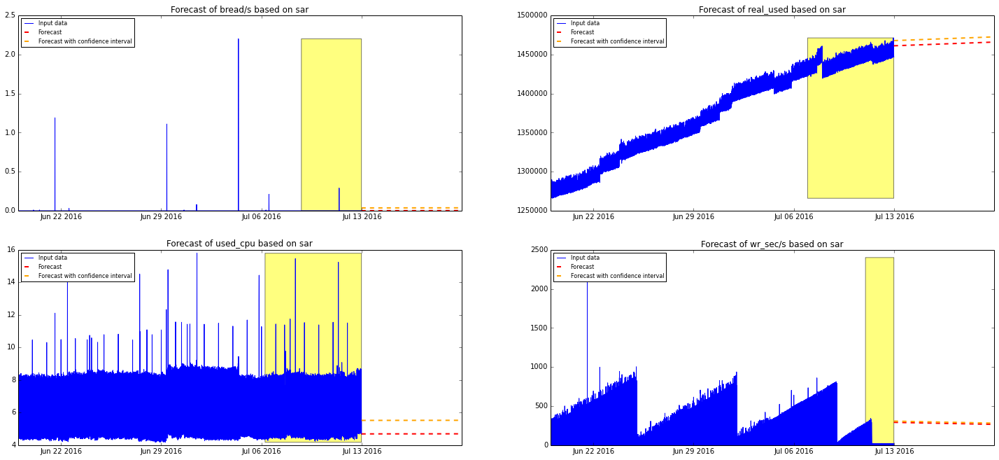

custom101.eta.prod.ed1


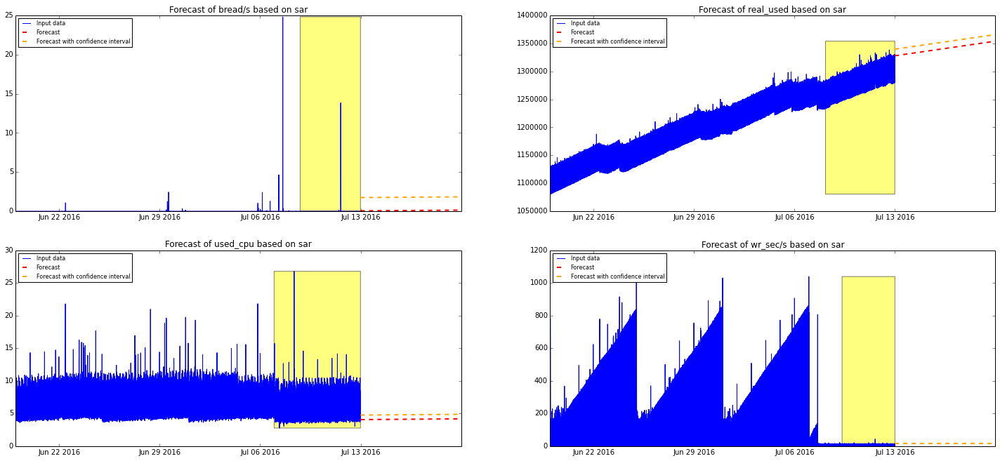

custom102.eta.prod.ed1


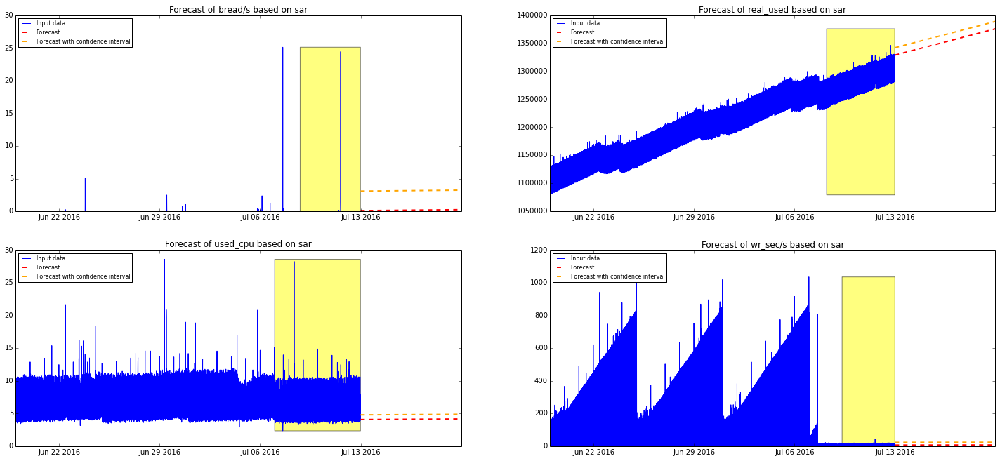

custom101.eta.prod.ed5


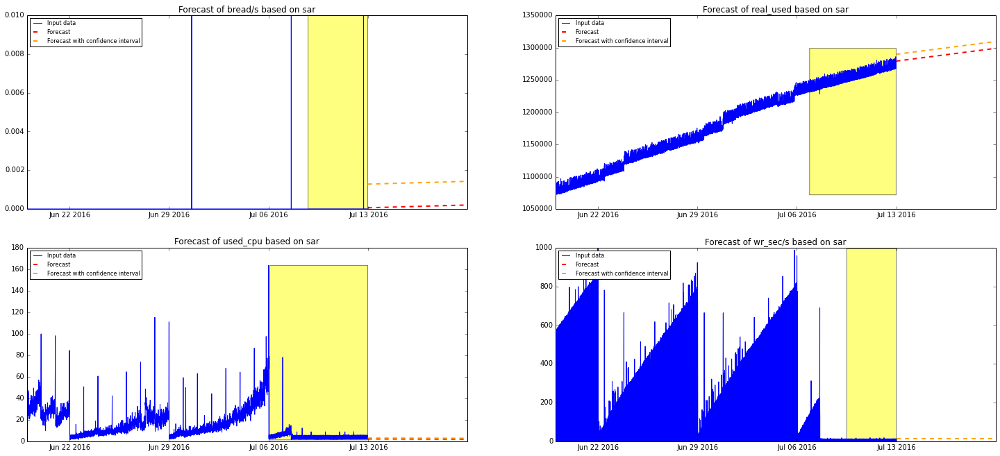

custom102.eta.prod.ed5


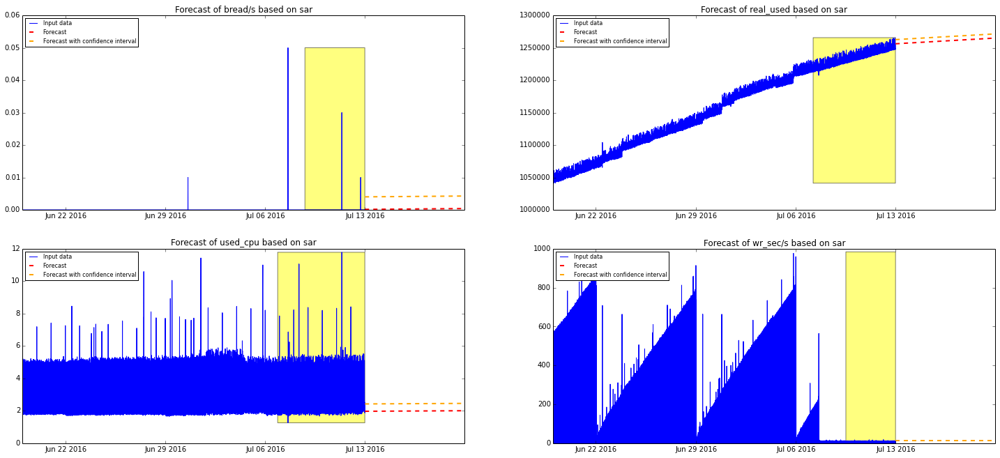

db101.eta.prod.ed1


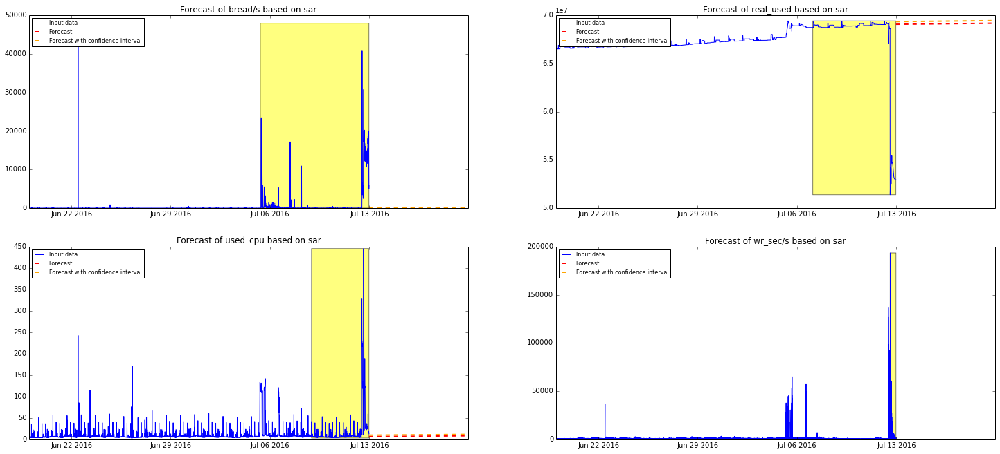

db102.eta.prod.ed1


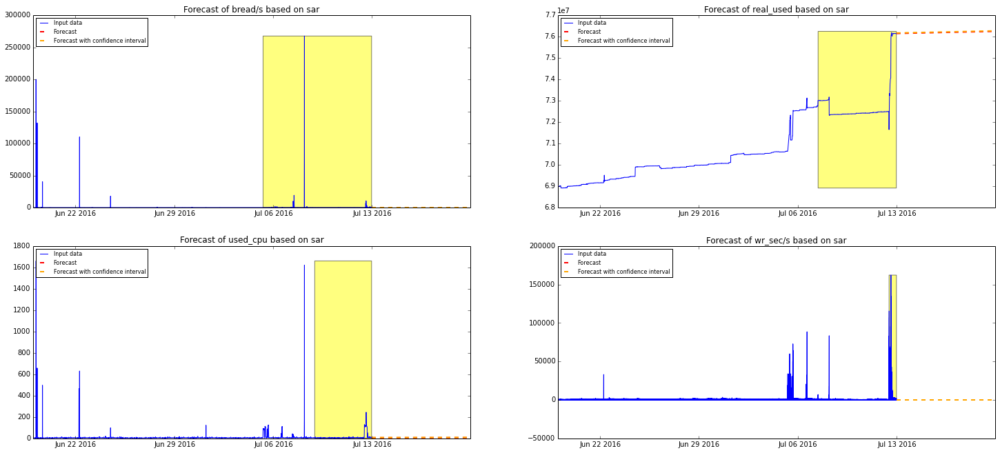

db101.eta.prod.ed5


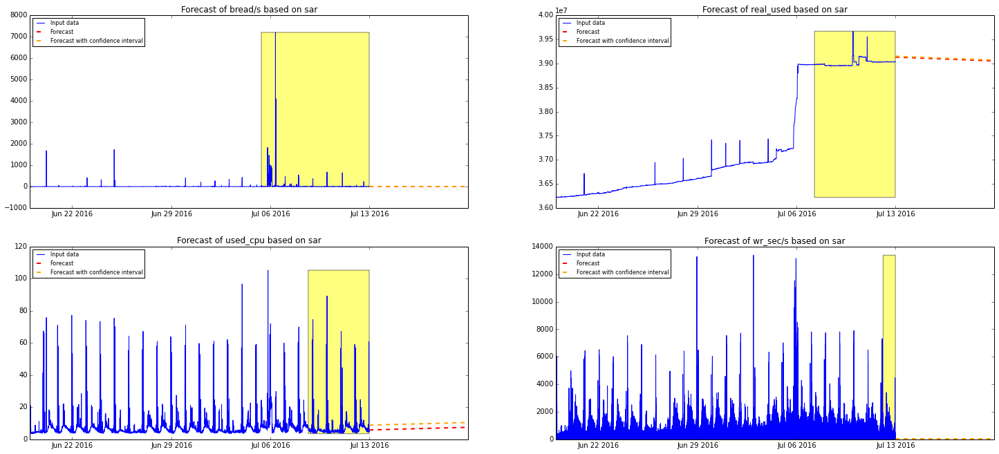

db102.eta.prod.ed5


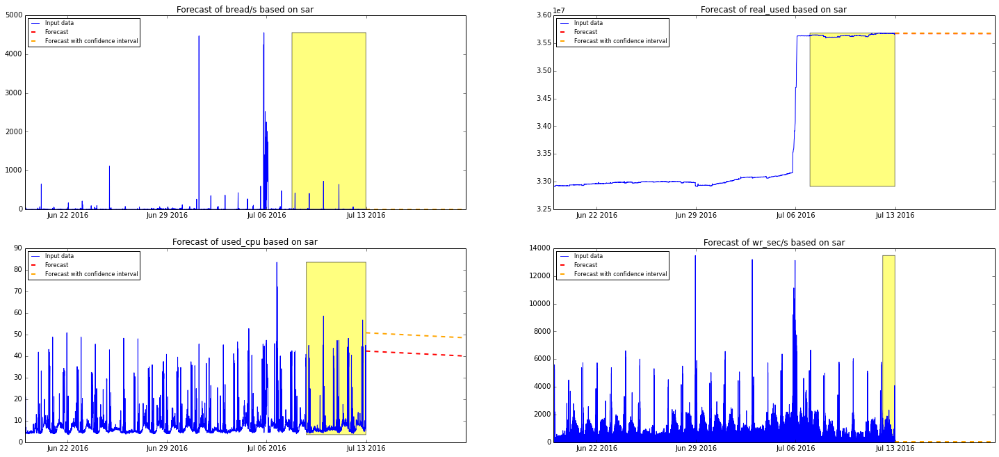

web101.eta.prod.ed1


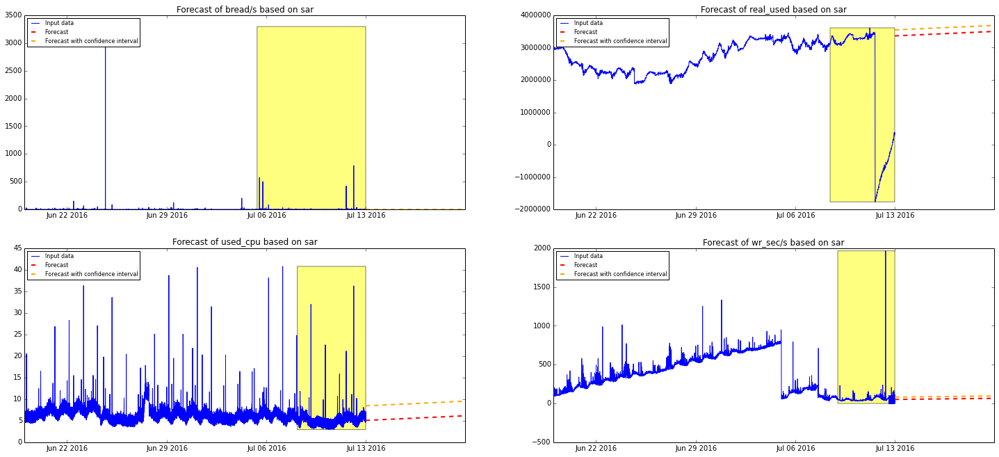

web102.eta.prod.ed1


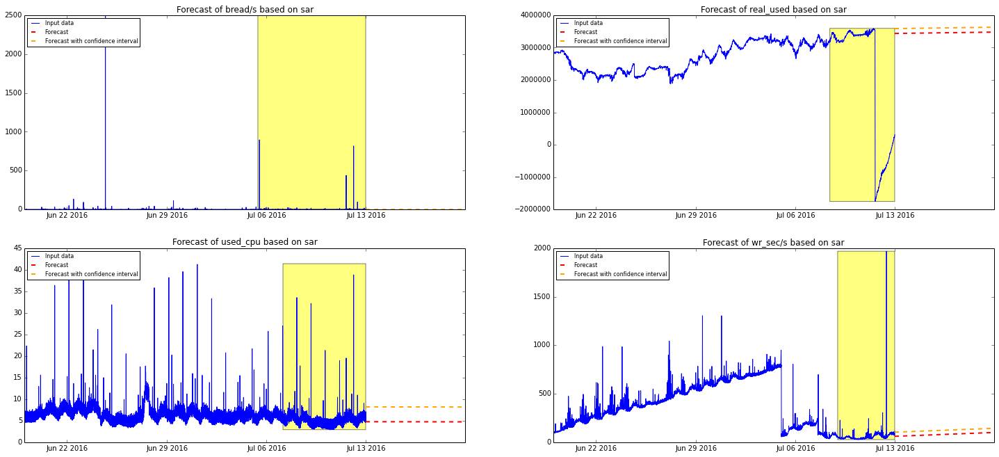

web103.eta.prod.ed1


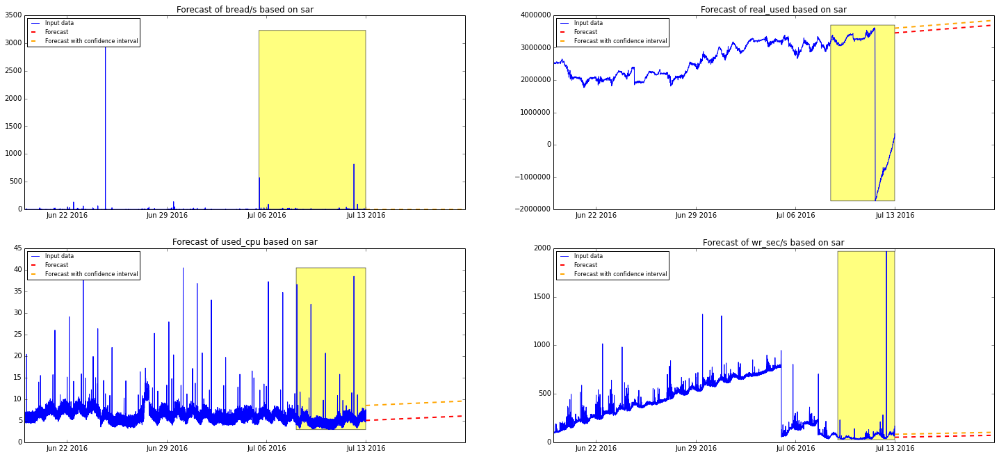

web104.eta.prod.ed1


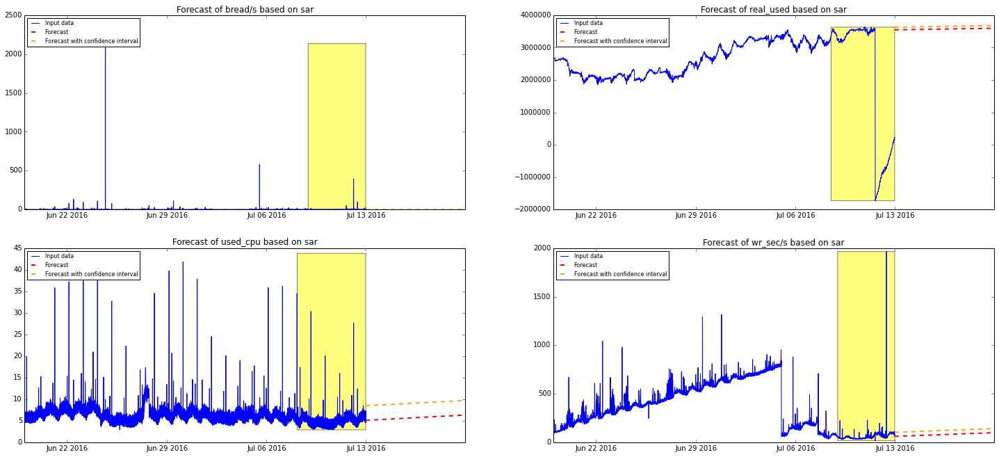

web105.eta.prod.ed1


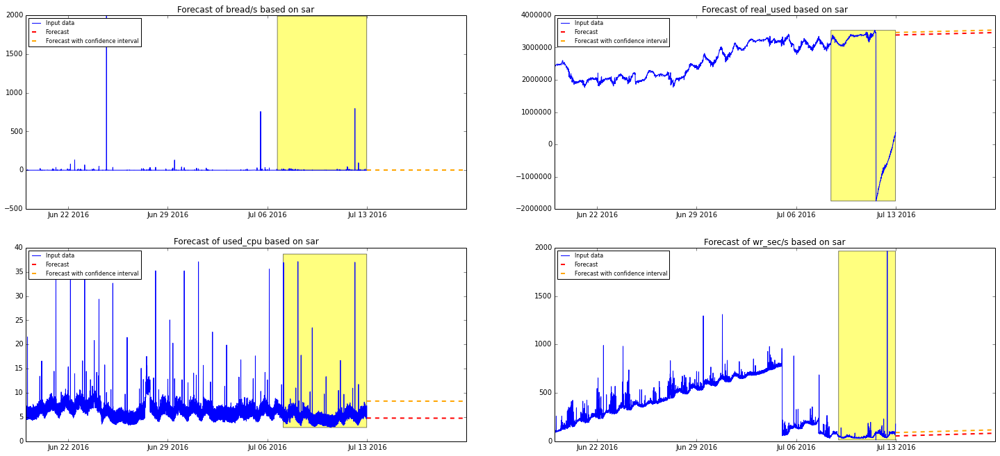

web106.eta.prod.ed1


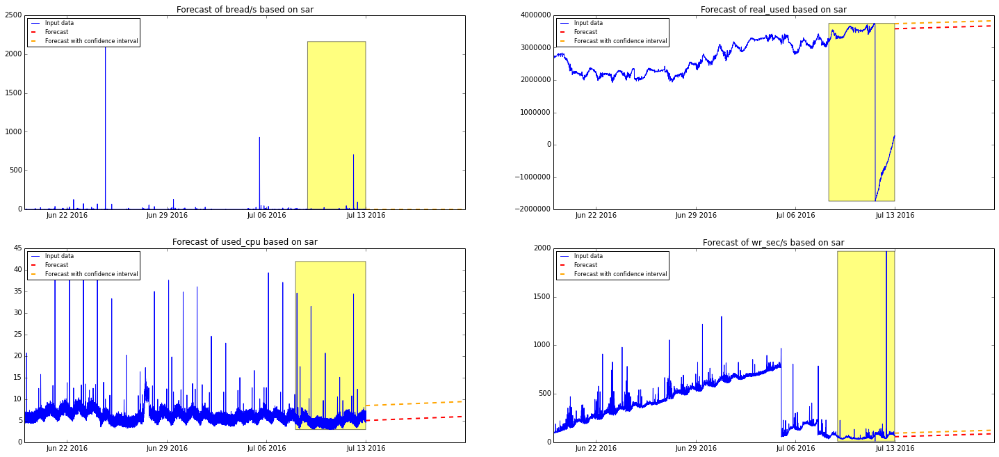

web107.eta.prod.ed1


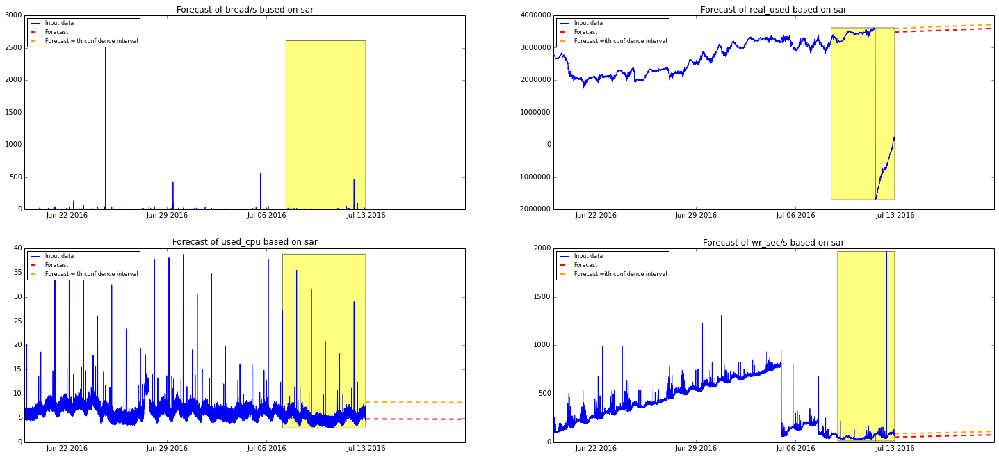

web108.eta.prod.ed1


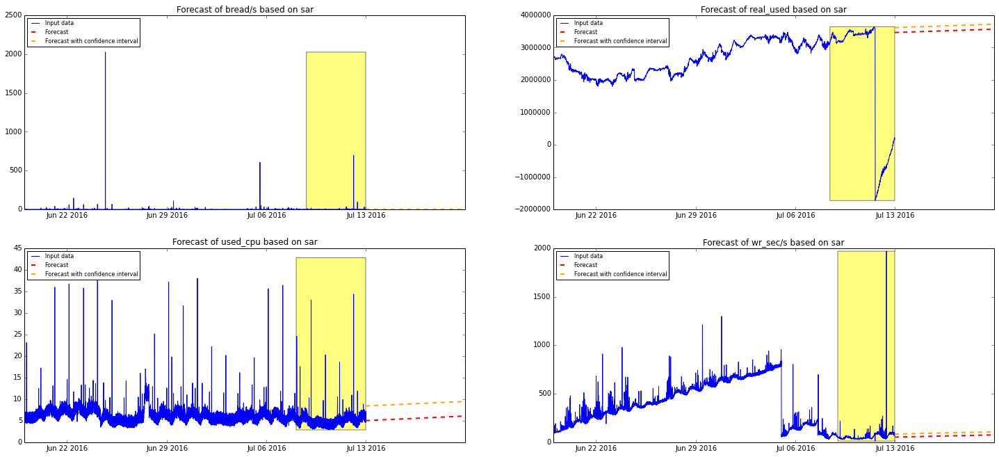

web109.eta.prod.ed1


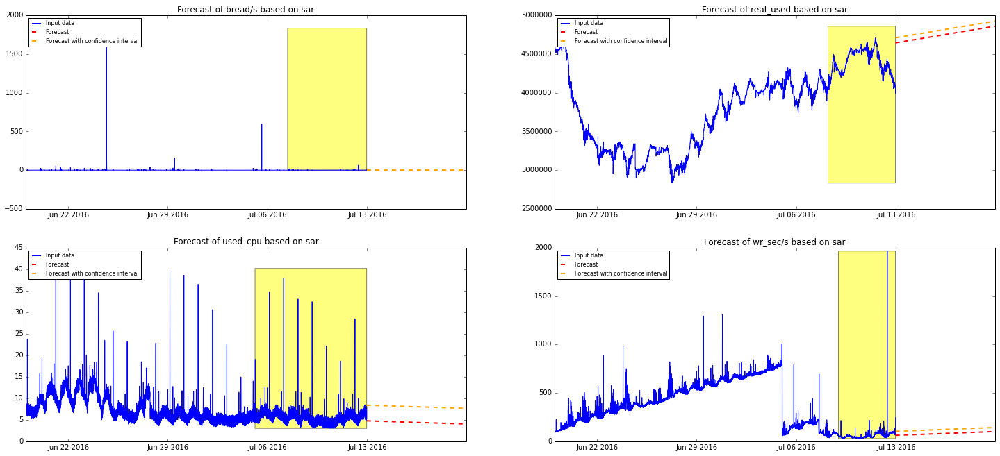

web110.eta.prod.ed1


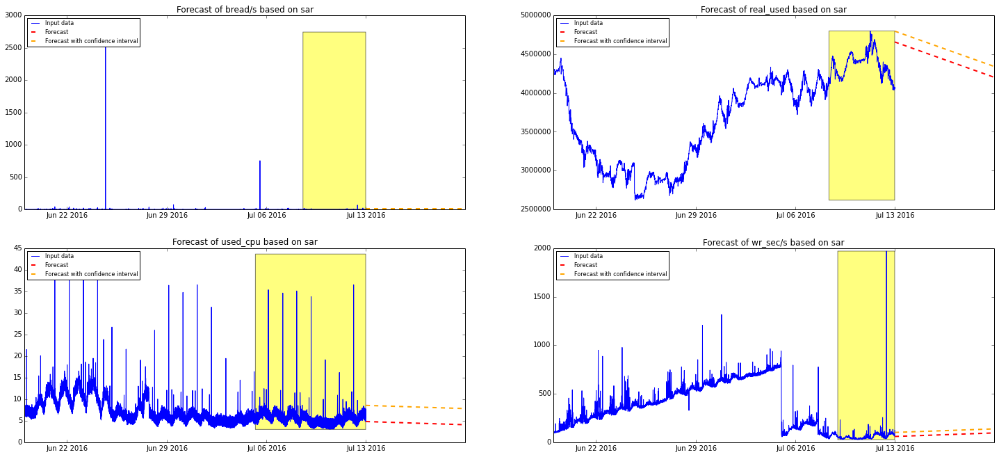

web111.eta.prod.ed1


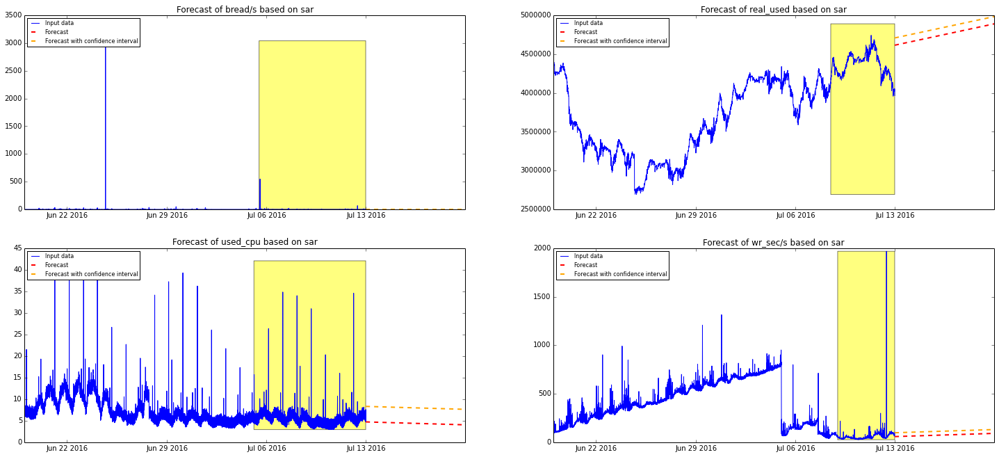

web112.eta.prod.ed1


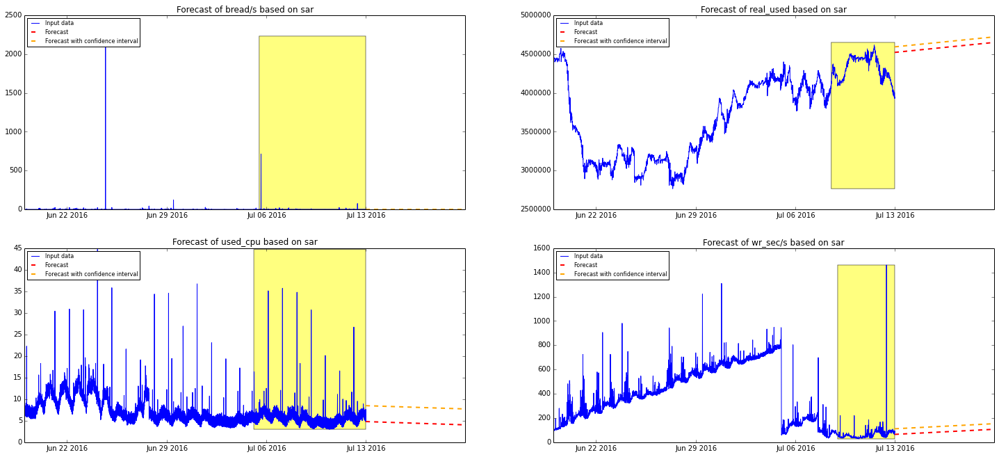

web113.eta.prod.ed1


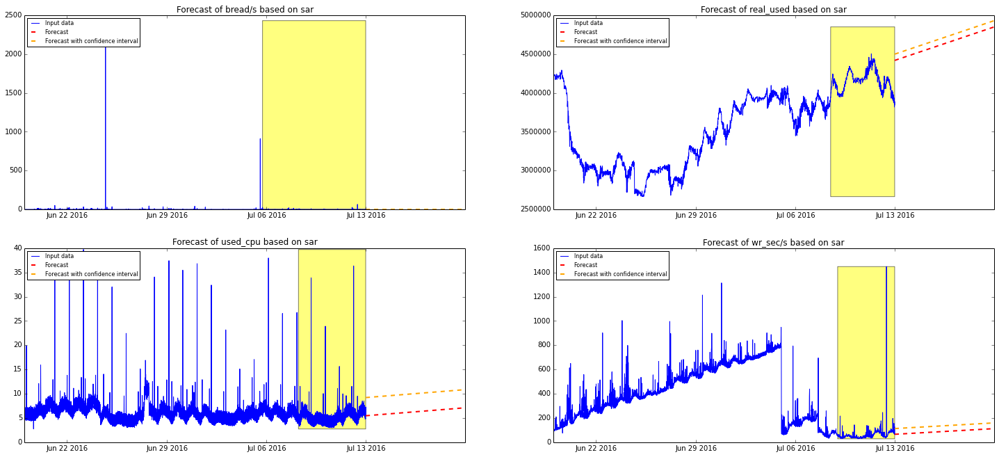

web114.eta.prod.ed1


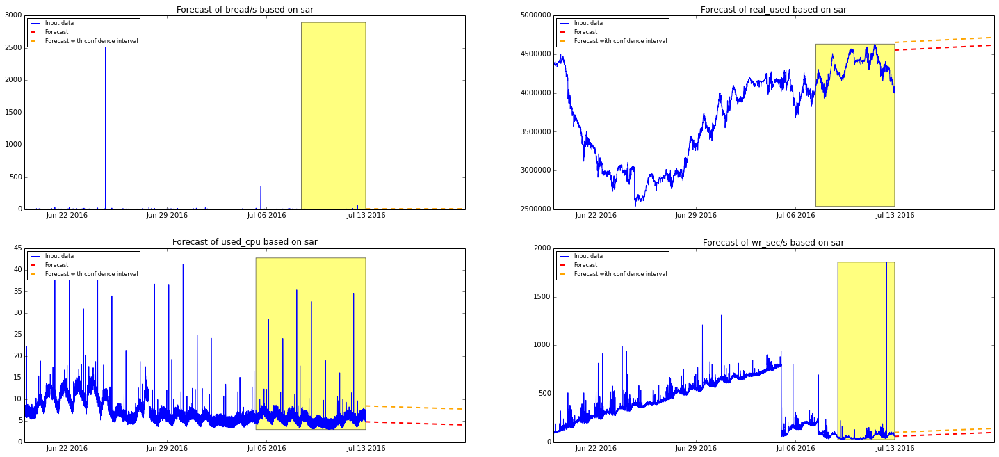

web115.eta.prod.ed1


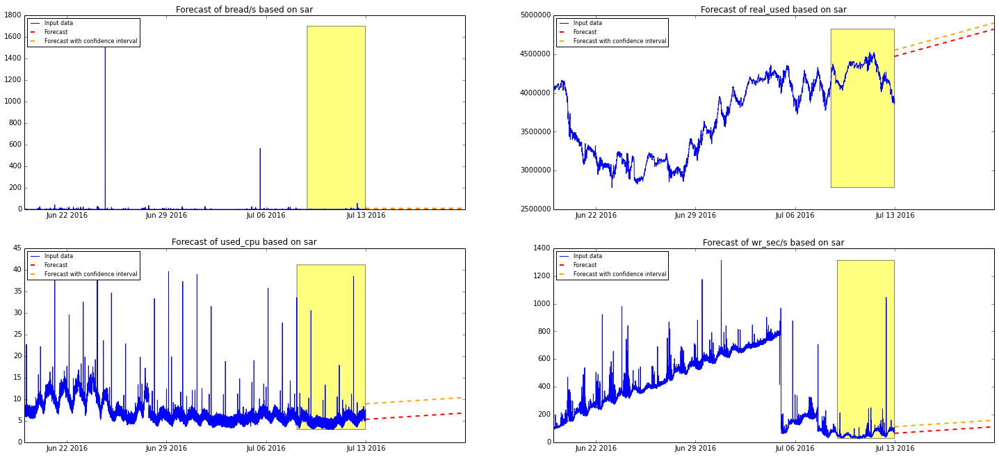

web116.eta.prod.ed1


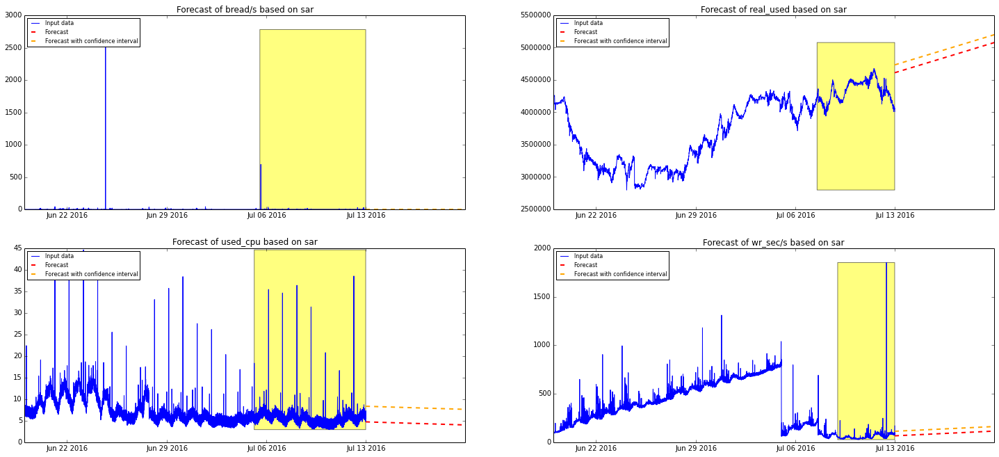

web117.eta.prod.ed1


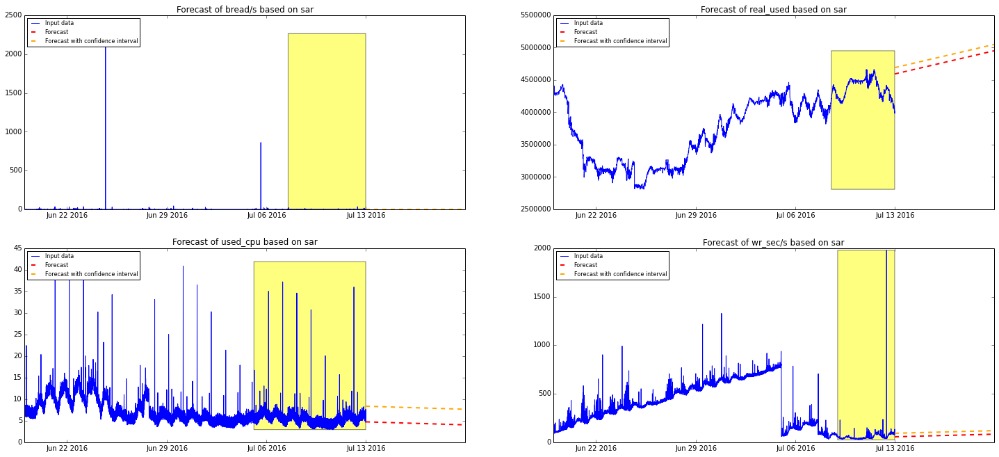

web118.eta.prod.ed1


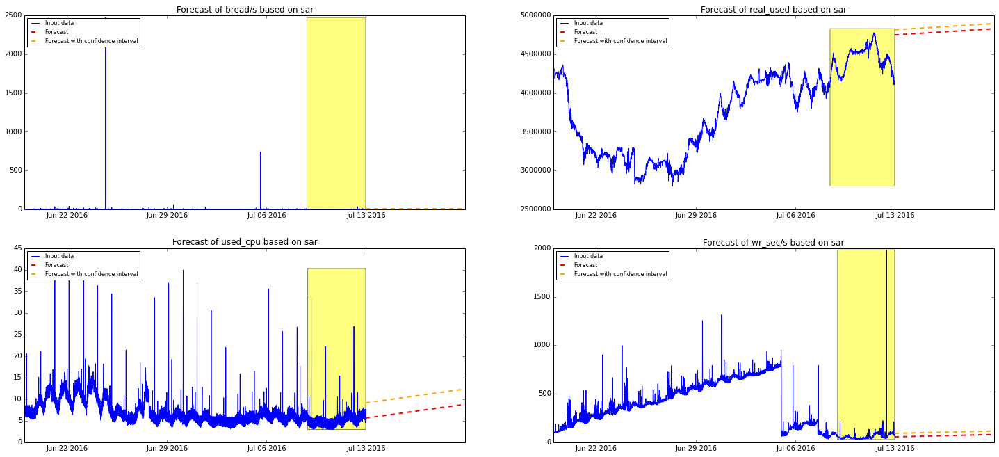

web119.eta.prod.ed1


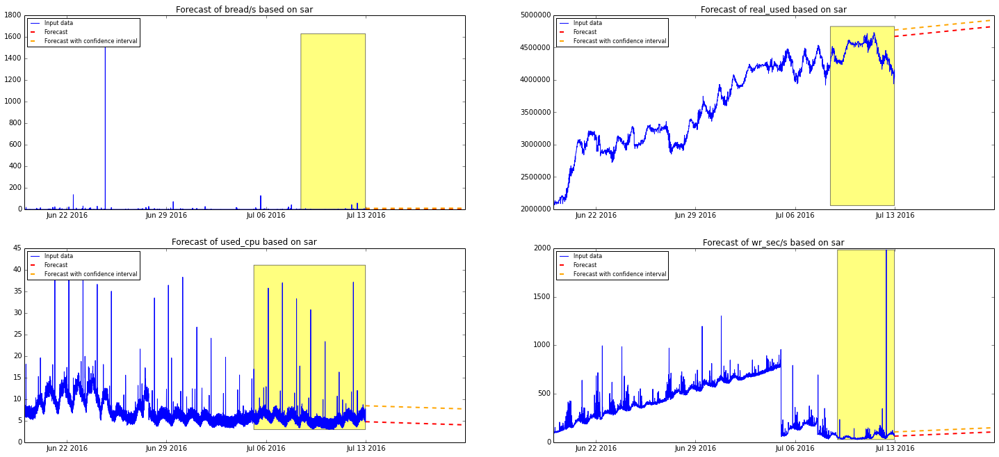

web101.eta.prod.ed5


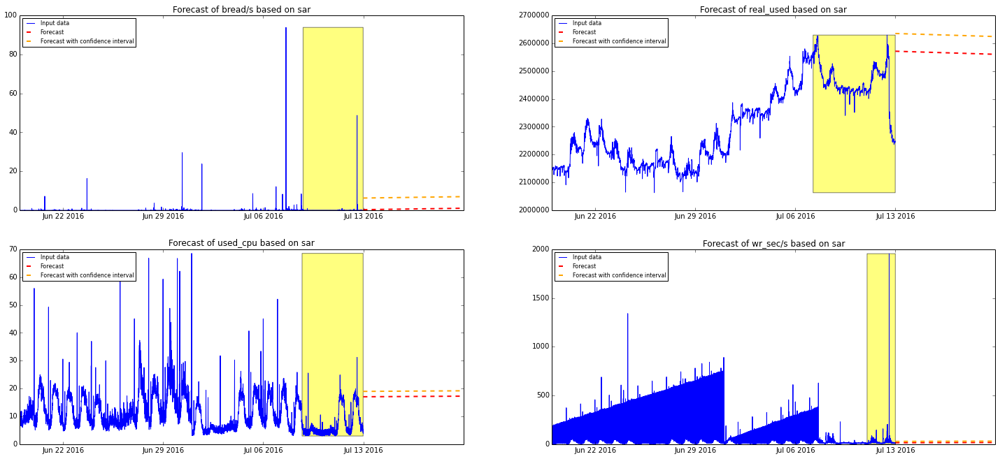

web102.eta.prod.ed5


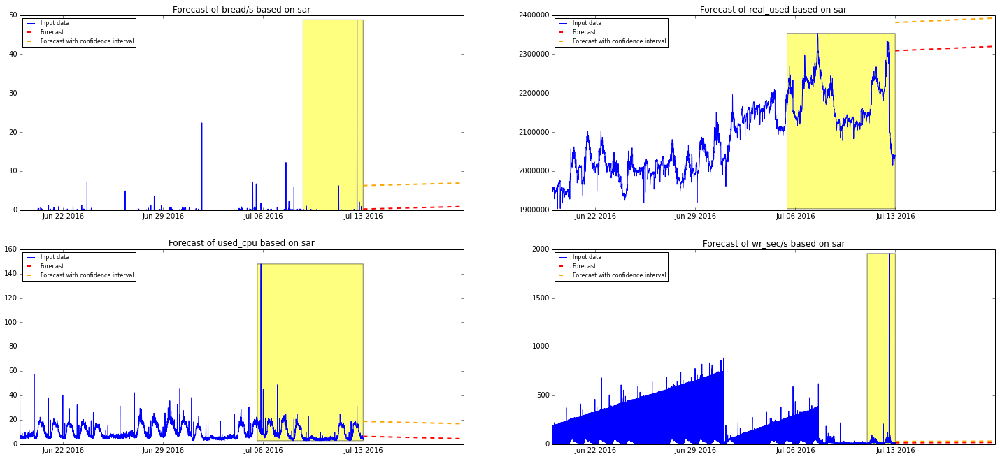

web103.eta.prod.ed5


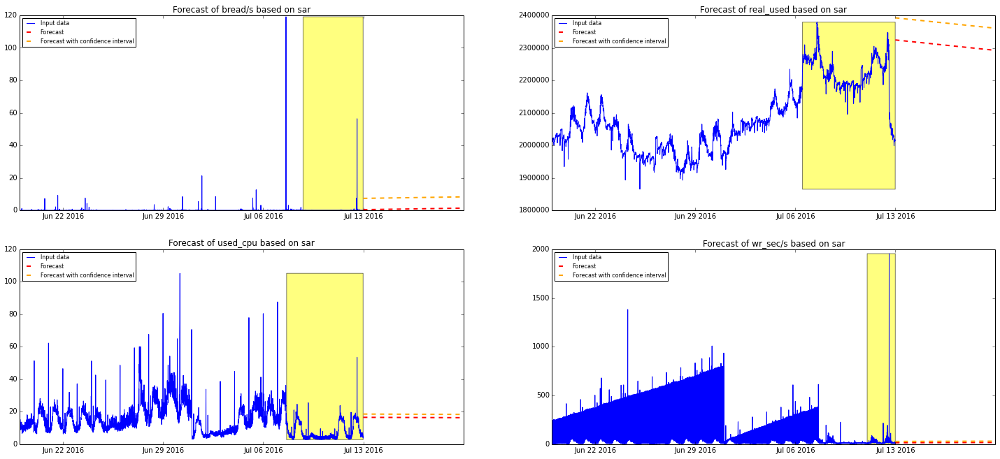

web104.eta.prod.ed5


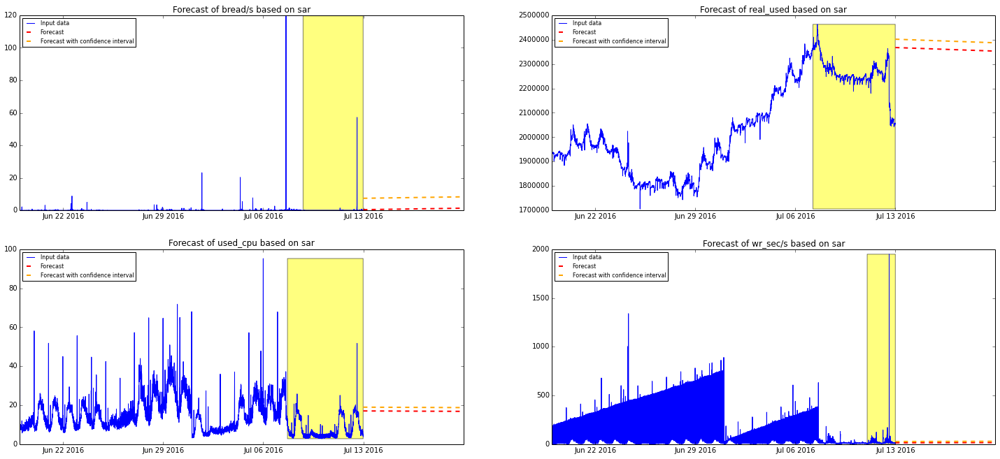

web105.eta.prod.ed5


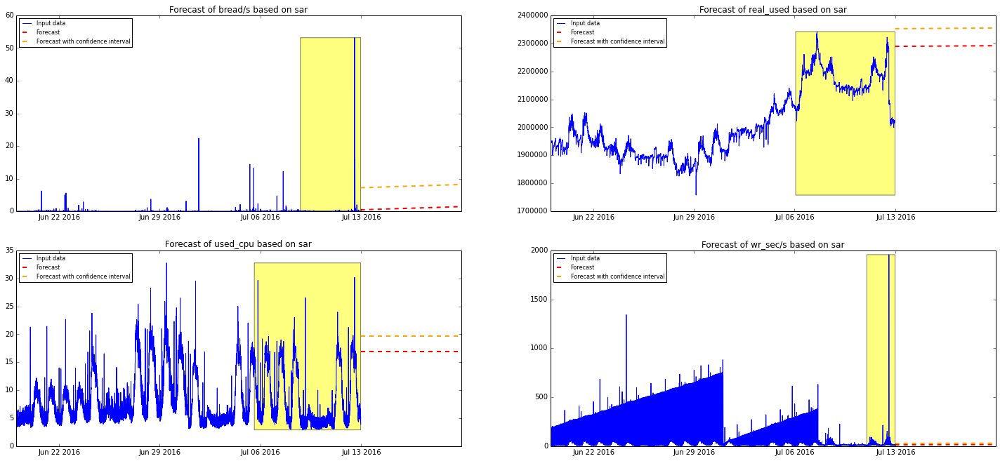

web106.eta.prod.ed5


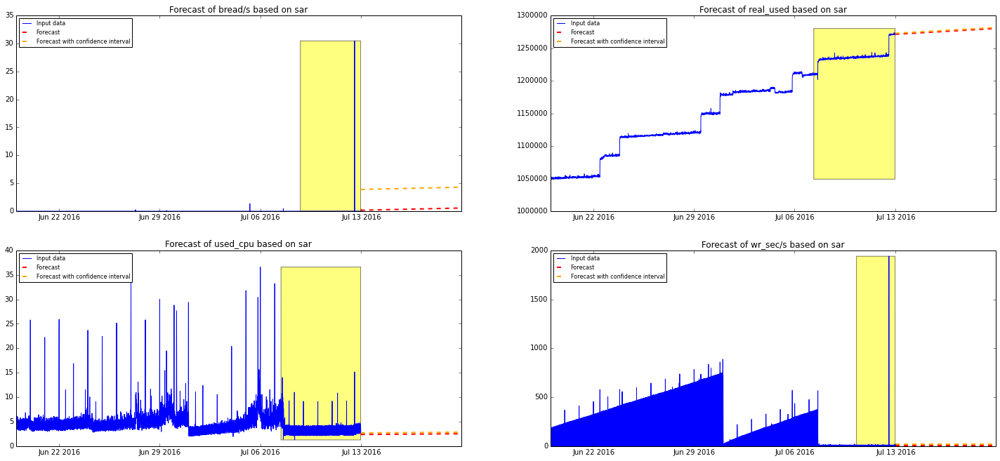

web107.eta.prod.ed5


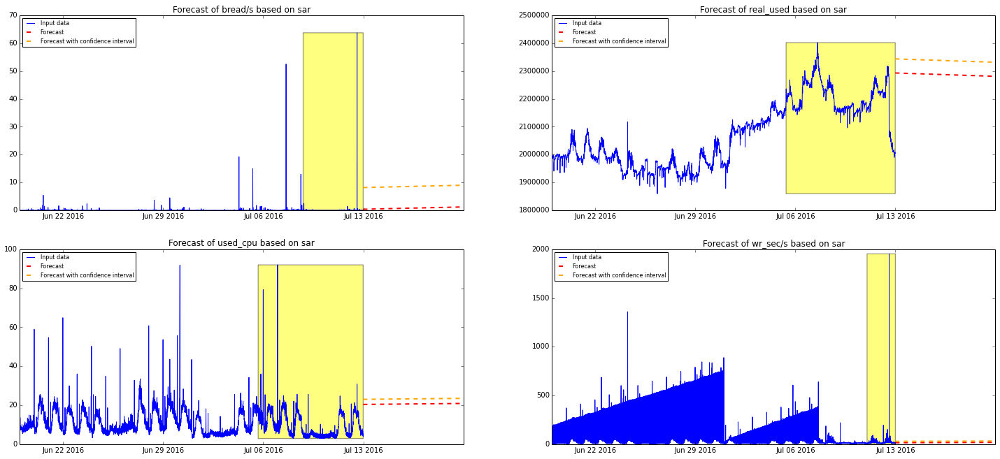

web108.eta.prod.ed5


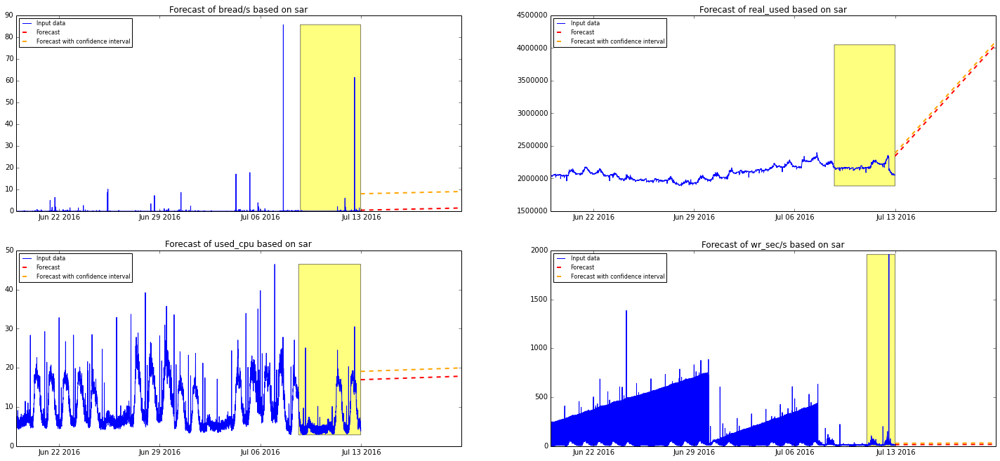

services101.eta.prod.ed1


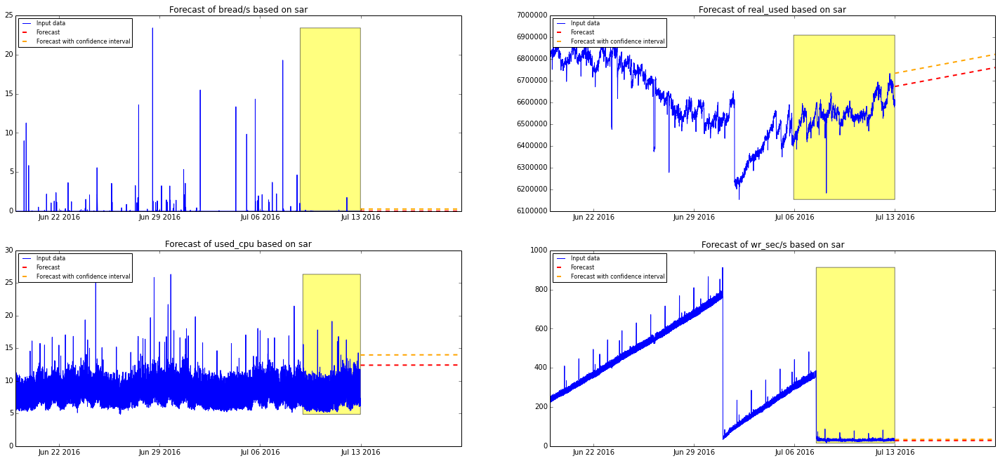

services102.eta.prod.ed1


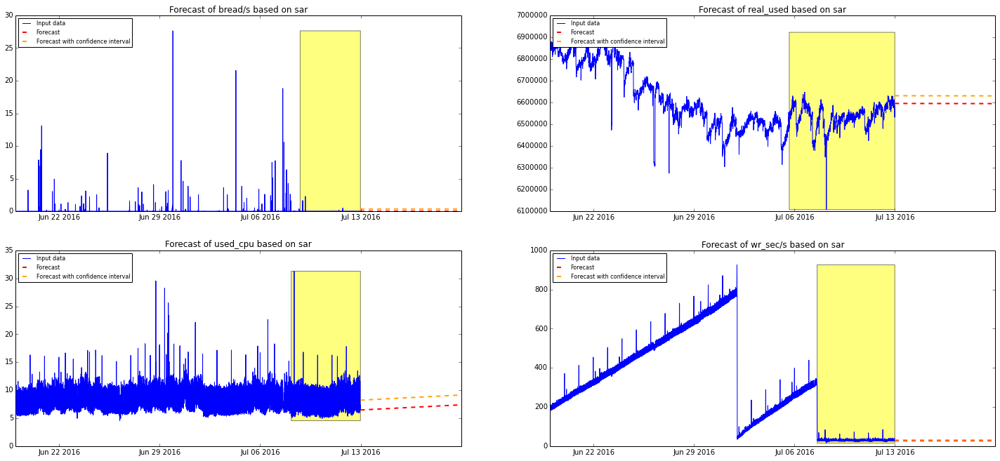

services103.eta.prod.ed1


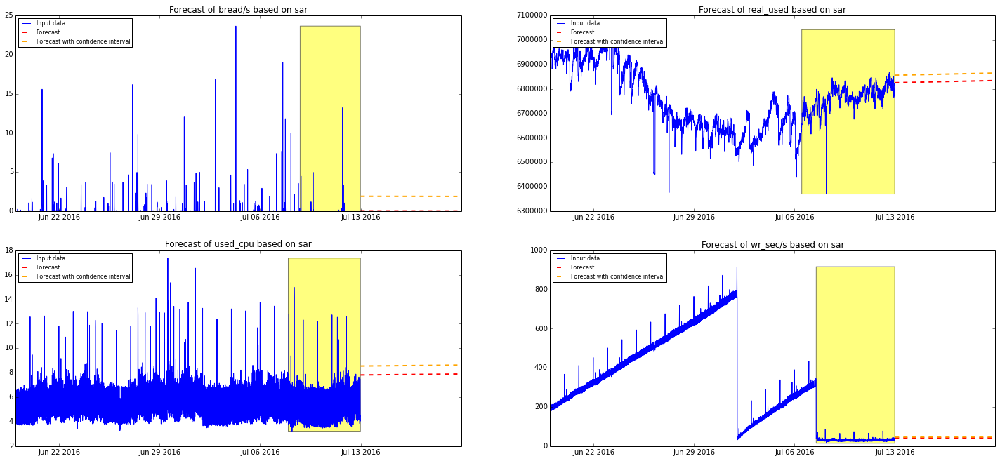

services104.eta.prod.ed1


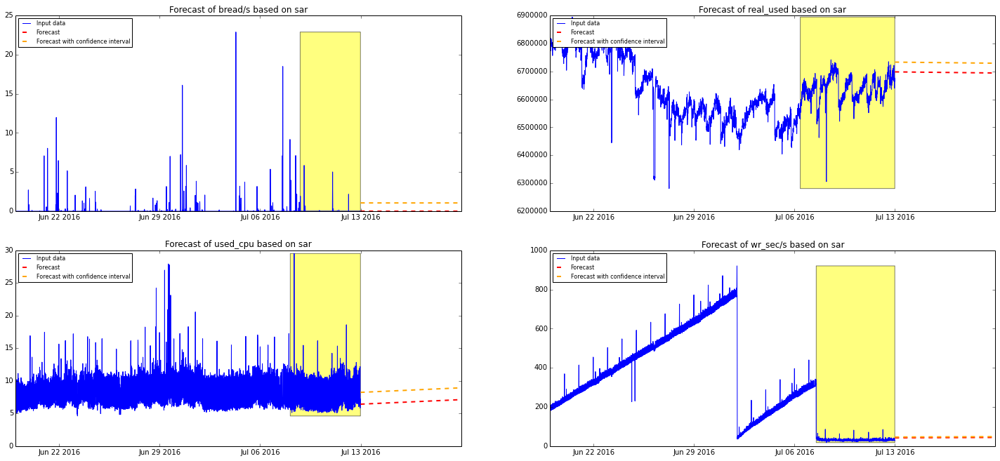

services105.eta.prod.ed1


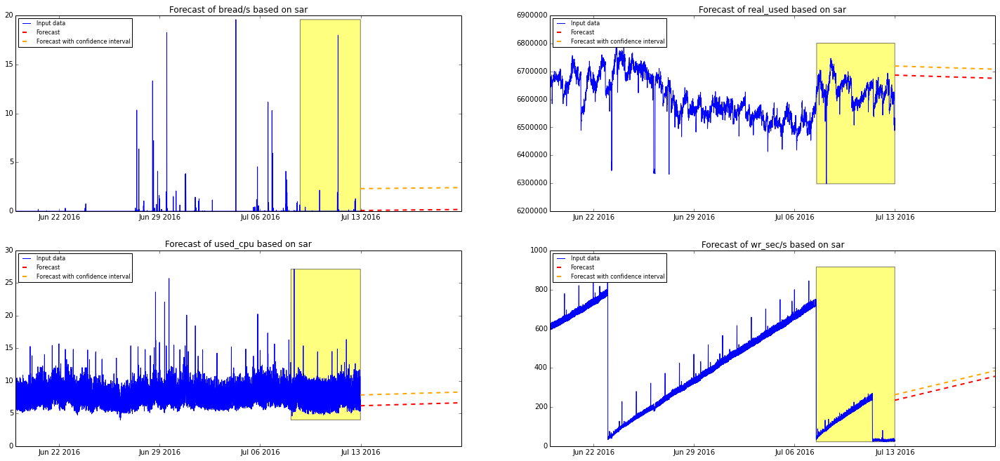

services101.eta.prod.ed5


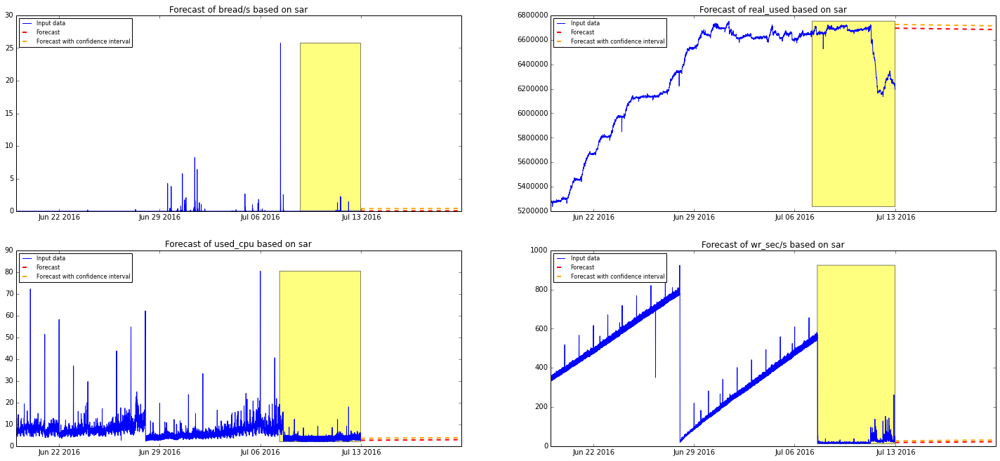

services102.eta.prod.ed5


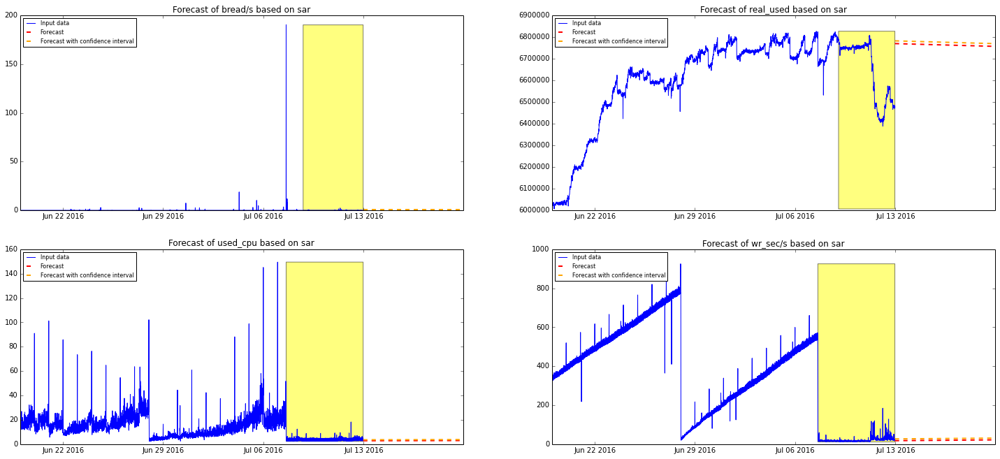

services103.eta.prod.ed5


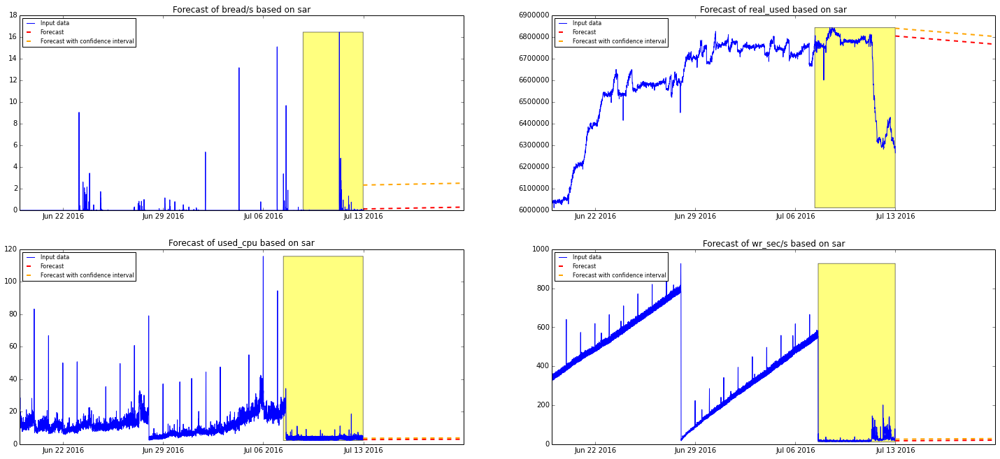

services104.eta.prod.ed5


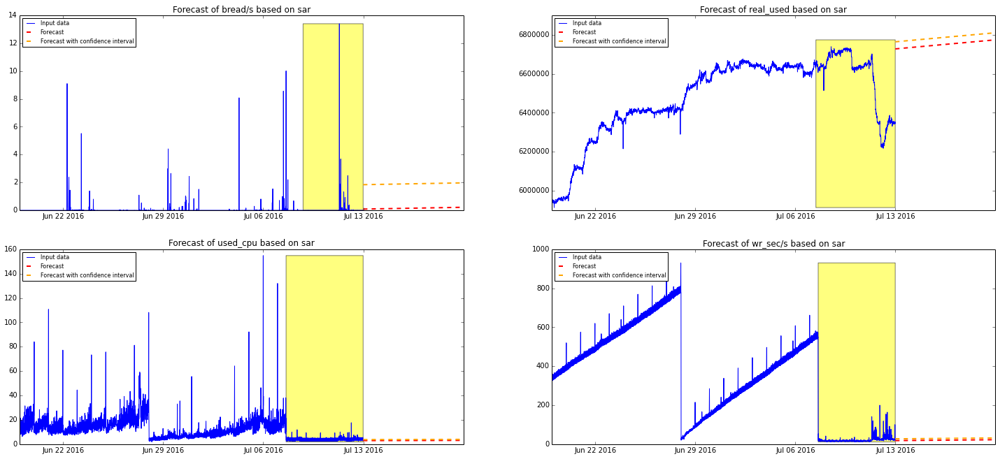

fs101.eta.prod.ed1


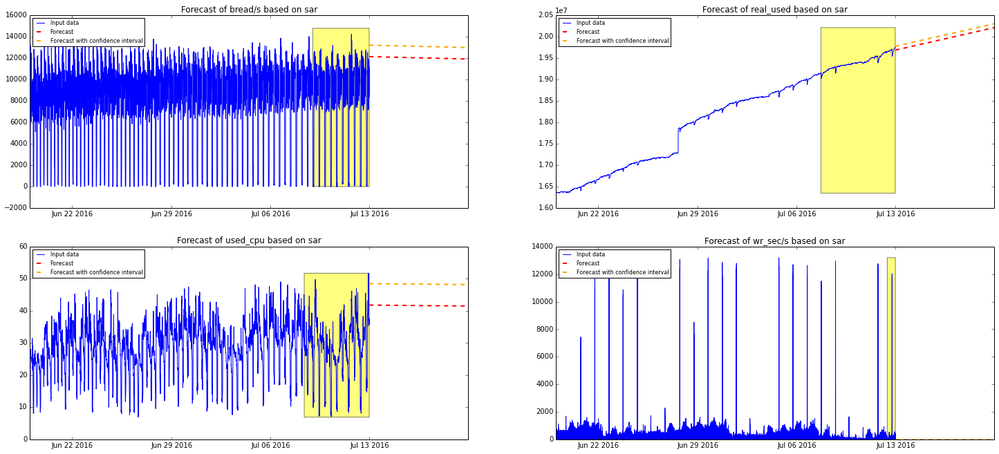

fs102.eta.prod.ed1


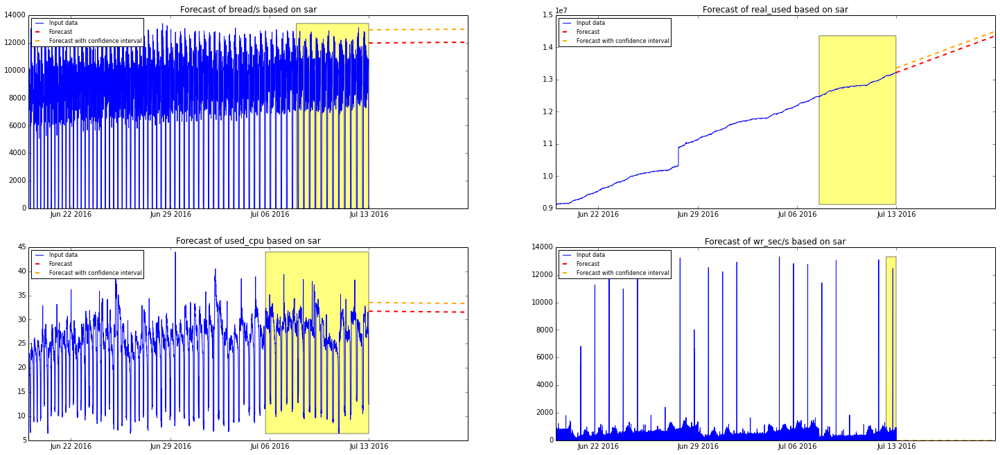

fs101.eta.prod.ed5


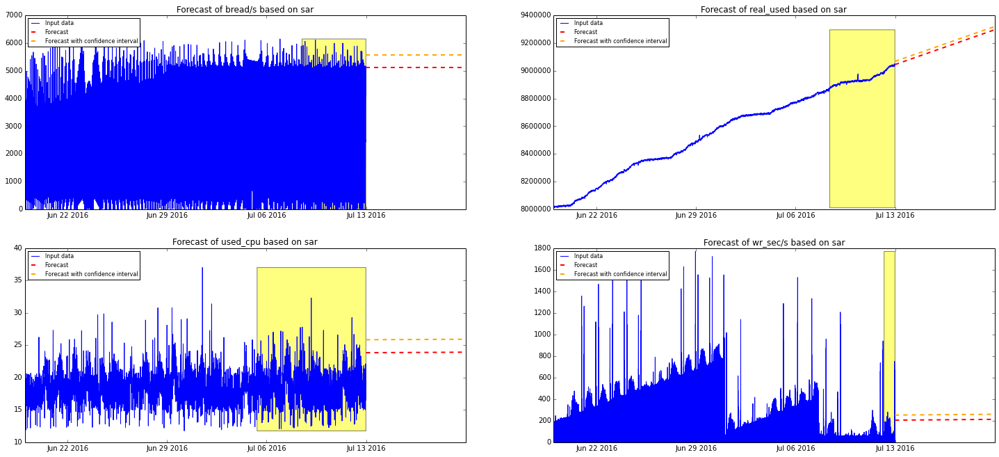

fs102.eta.prod.ed5


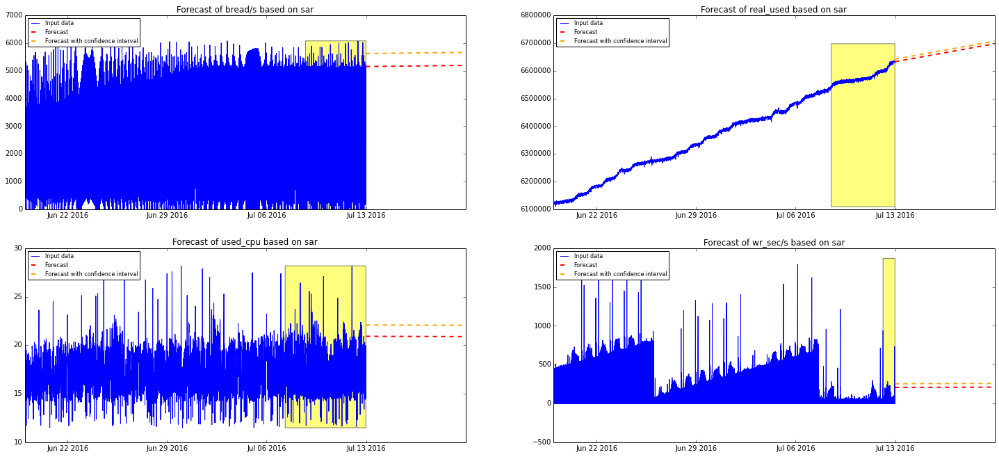

ha101.eta.prod.ed1


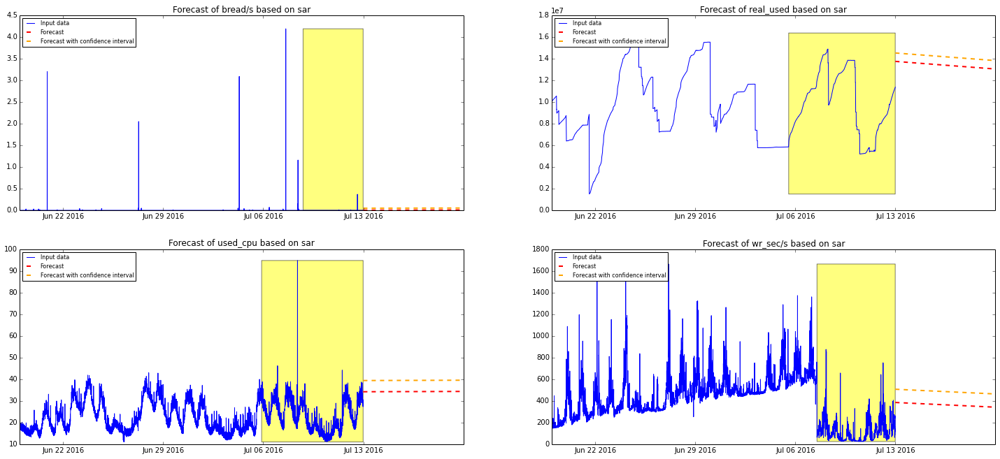

ha102.eta.prod.ed1


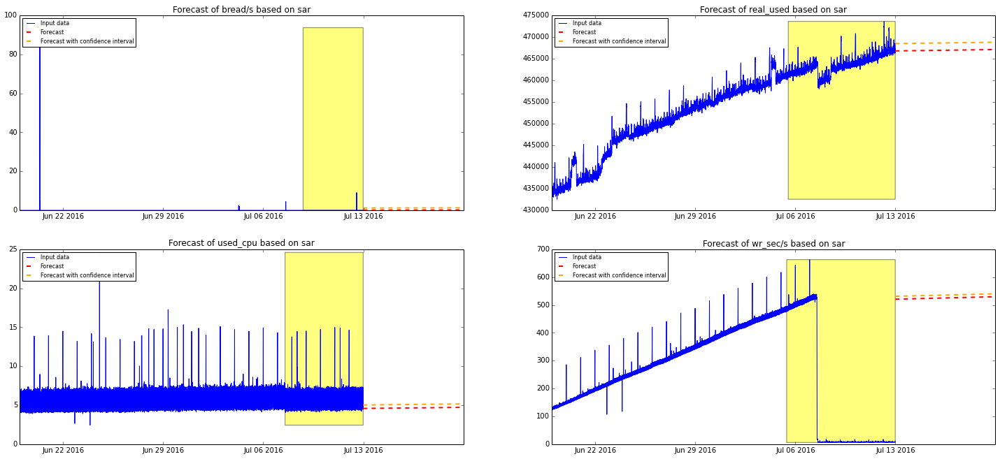

ha101.eta.prod.ed5


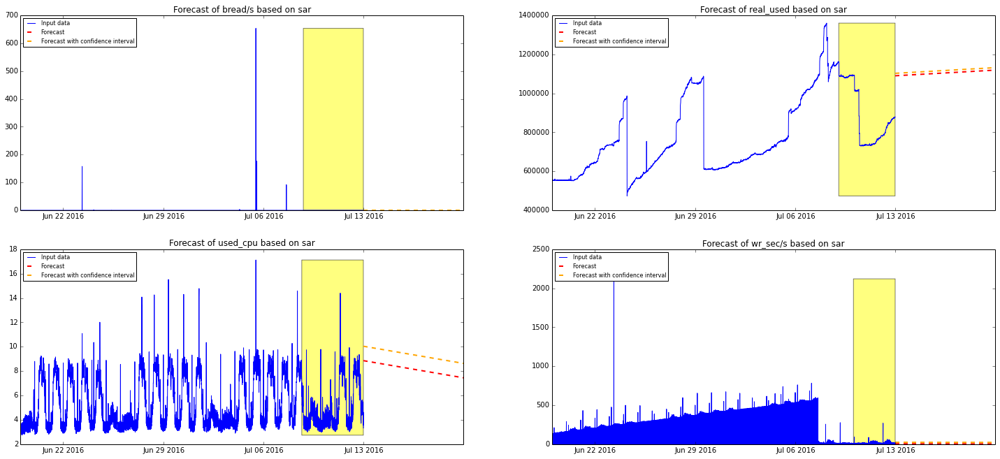

ha102.eta.prod.ed5


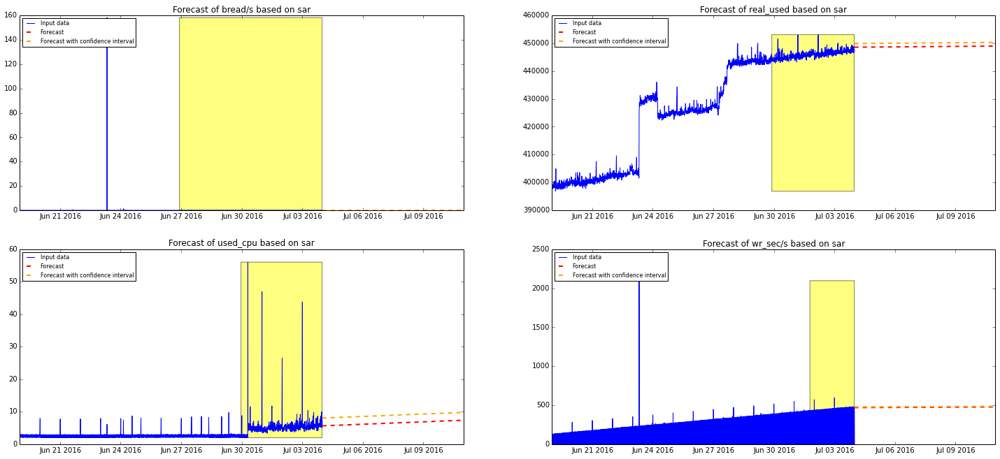

red101.eta.prod.ed1


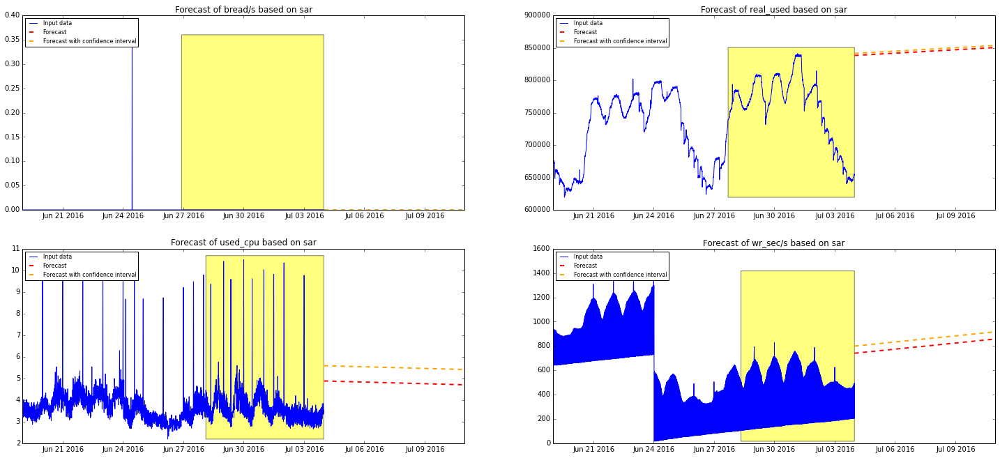

red102.eta.prod.ed1


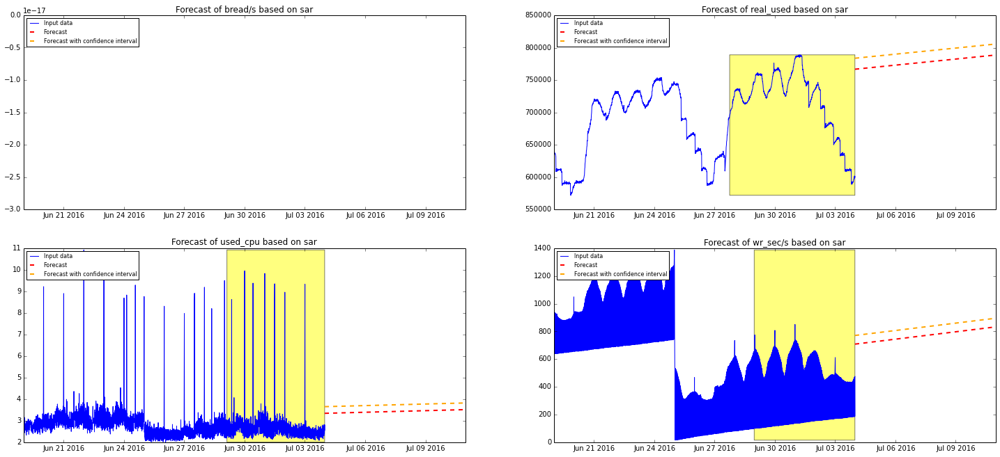

red103.eta.prod.ed1


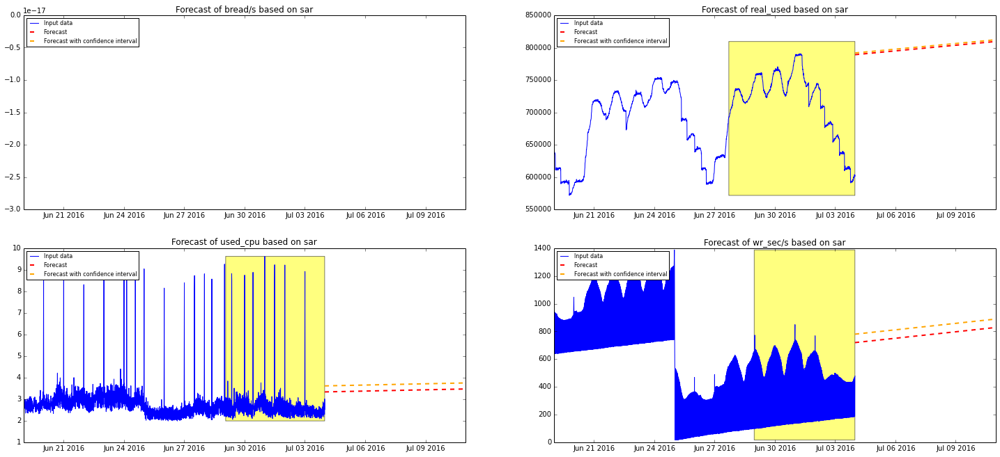

red101.eta.prod.ed5


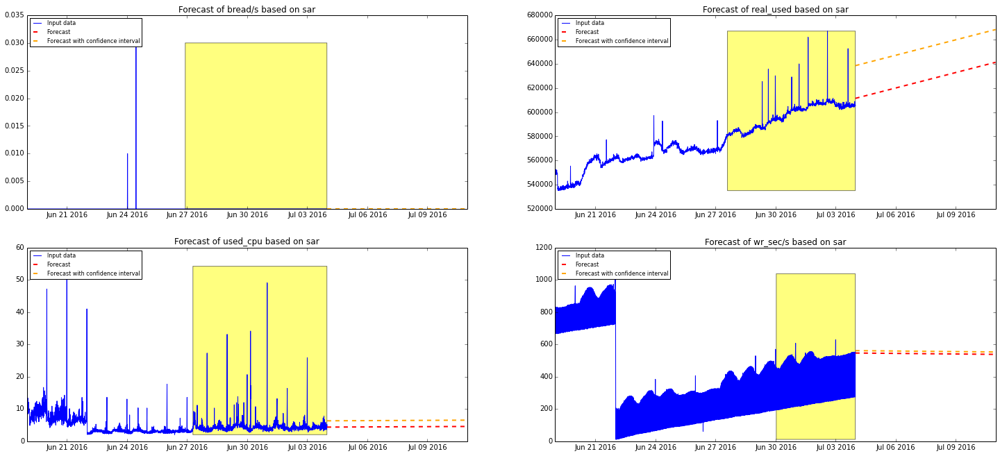

red102.eta.prod.ed5


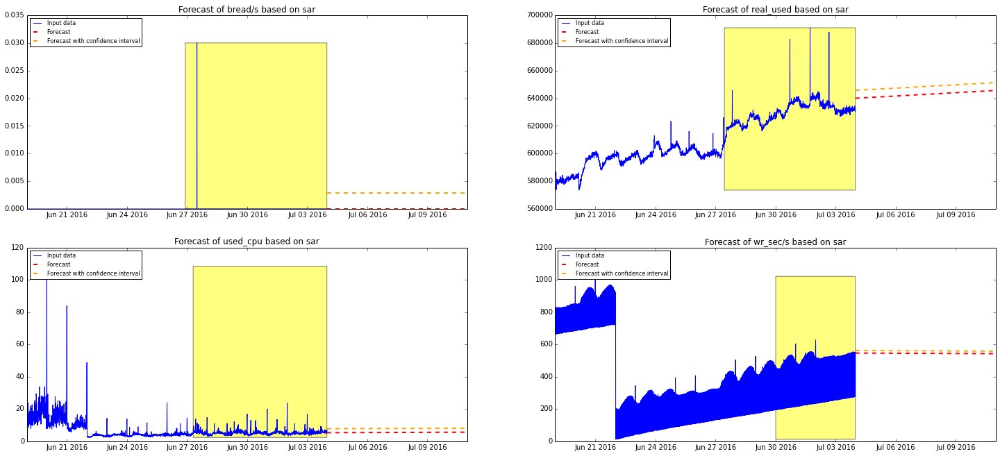

red103.eta.prod.ed5


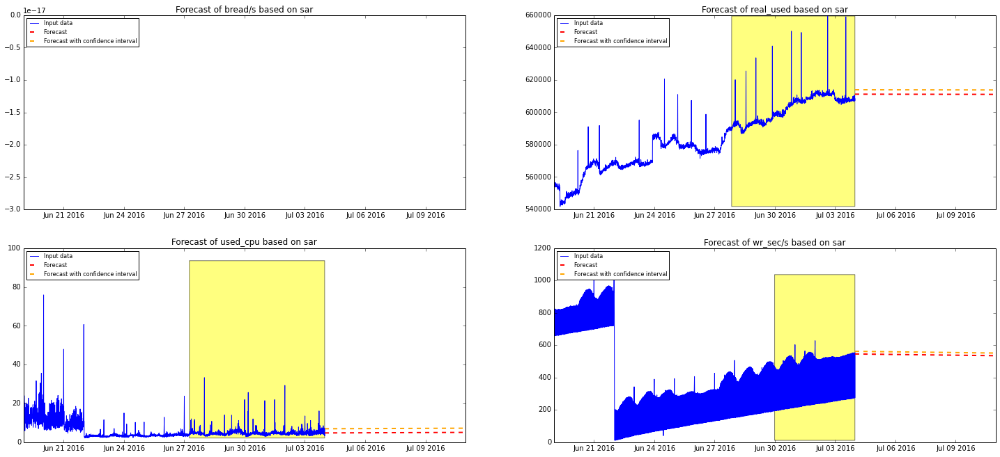

red104.eta.prod.ed1


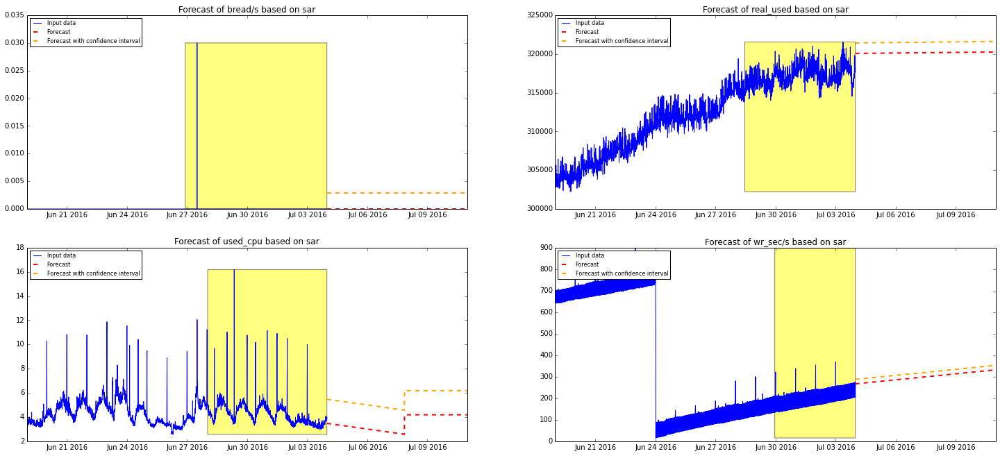

red105.eta.prod.ed1


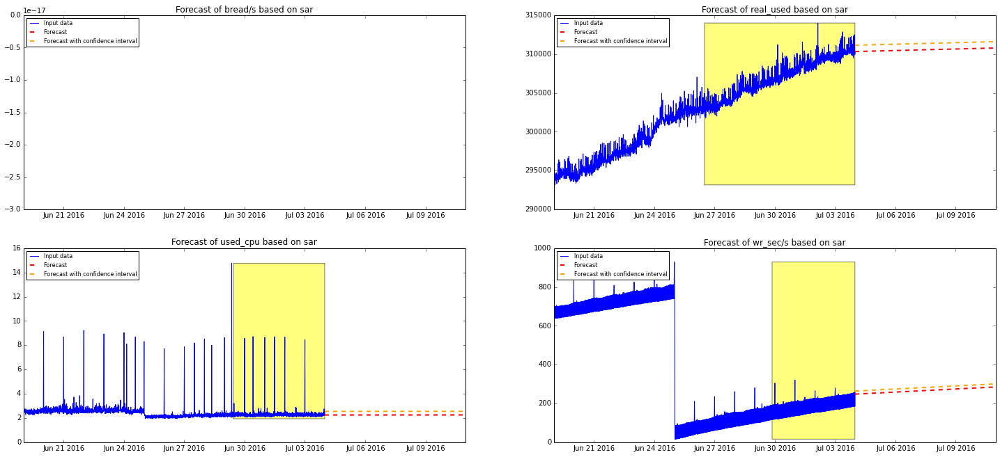

red106.eta.prod.ed1


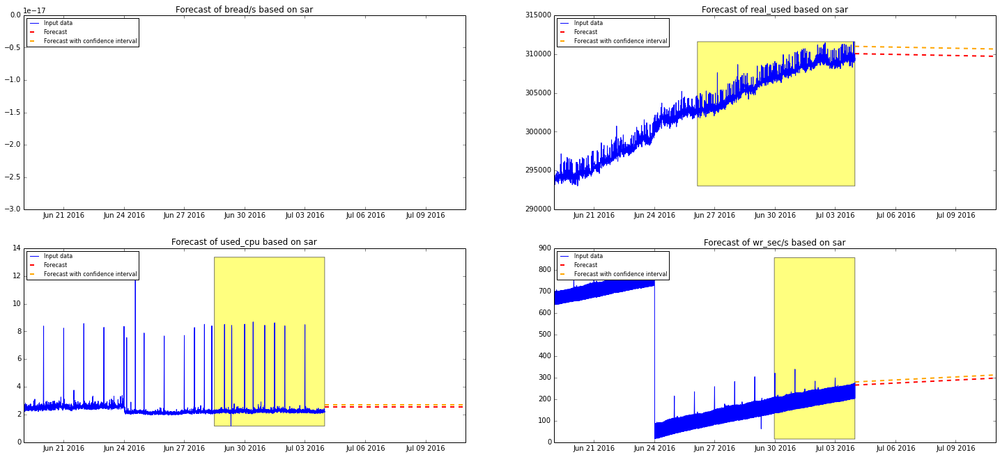

red104.eta.prod.ed5


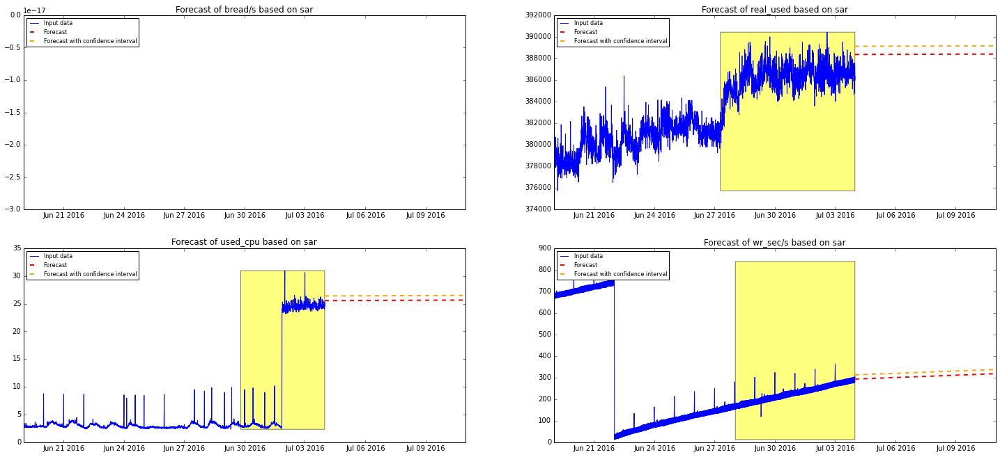

red105.eta.prod.ed5


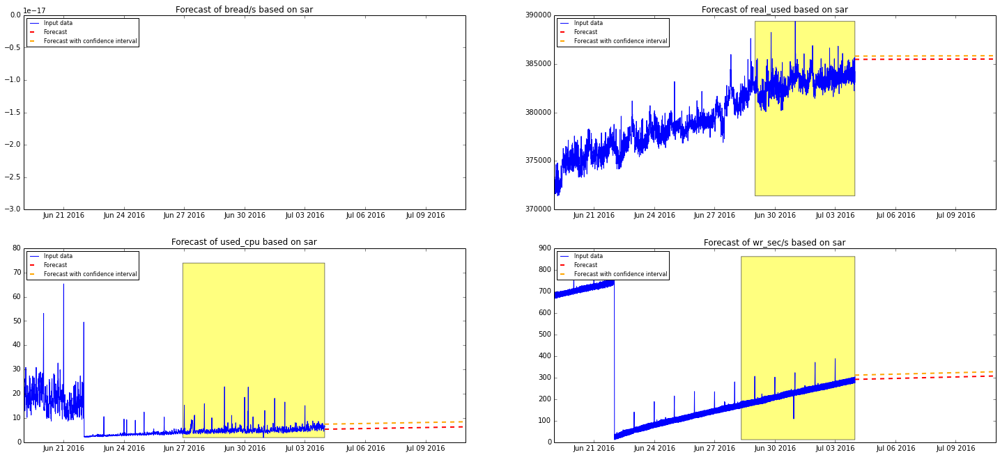

red106.eta.prod.ed5


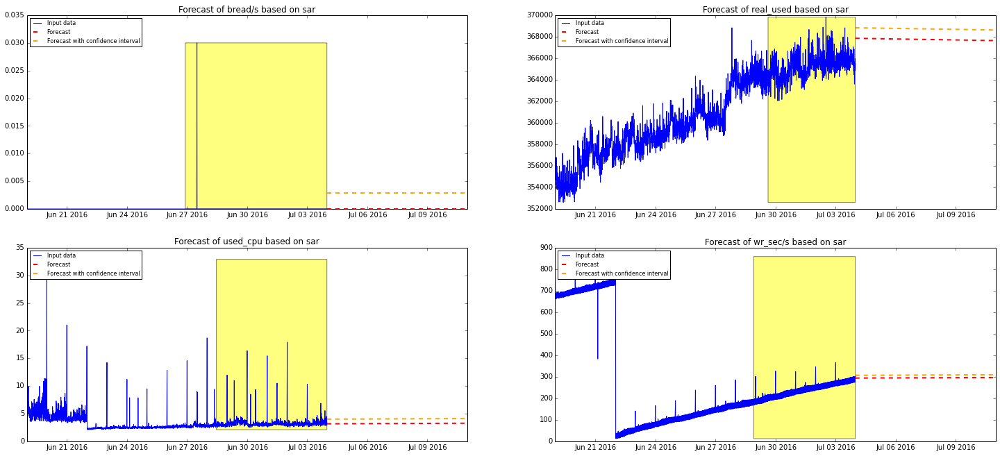

st101.eta.prod.ed1


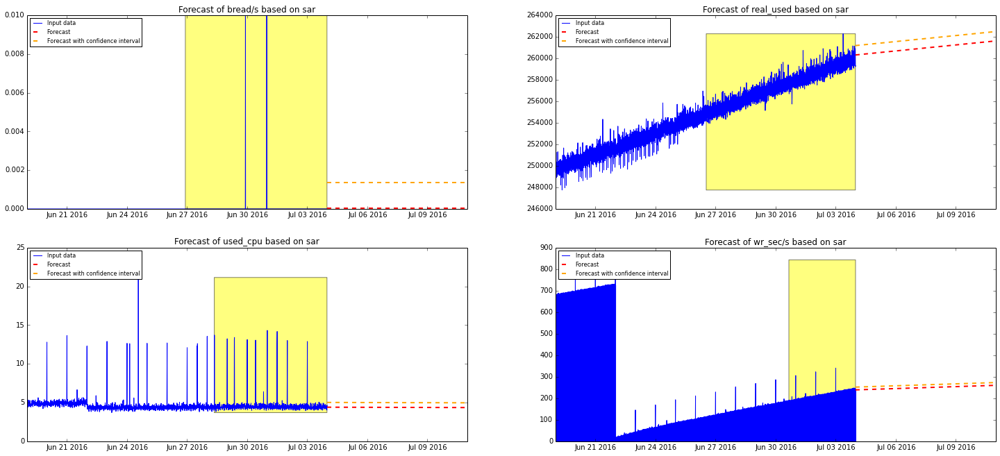

st102.eta.prod.ed1


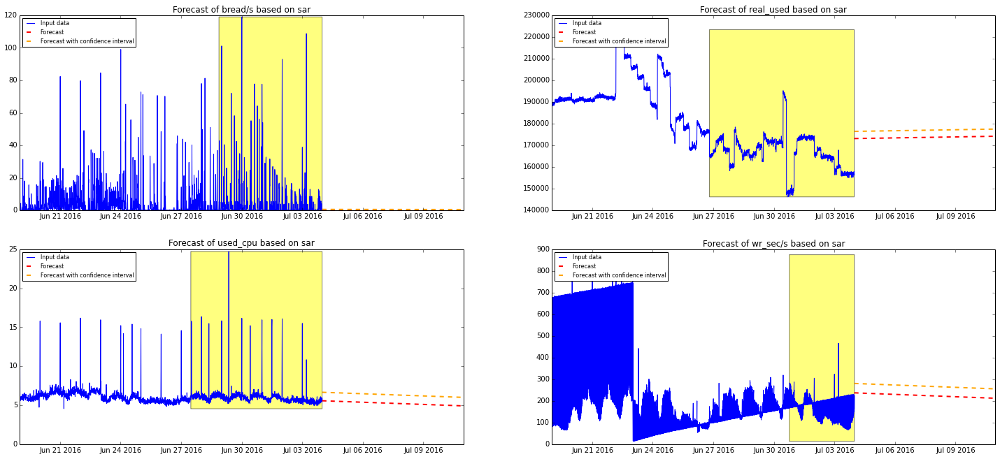

st101.eta.prod.ed5


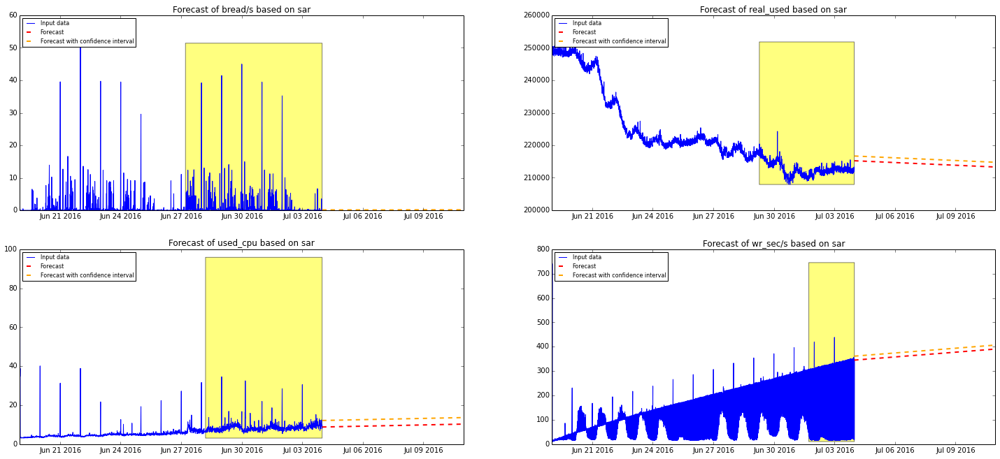

st102.eta.prod.ed5


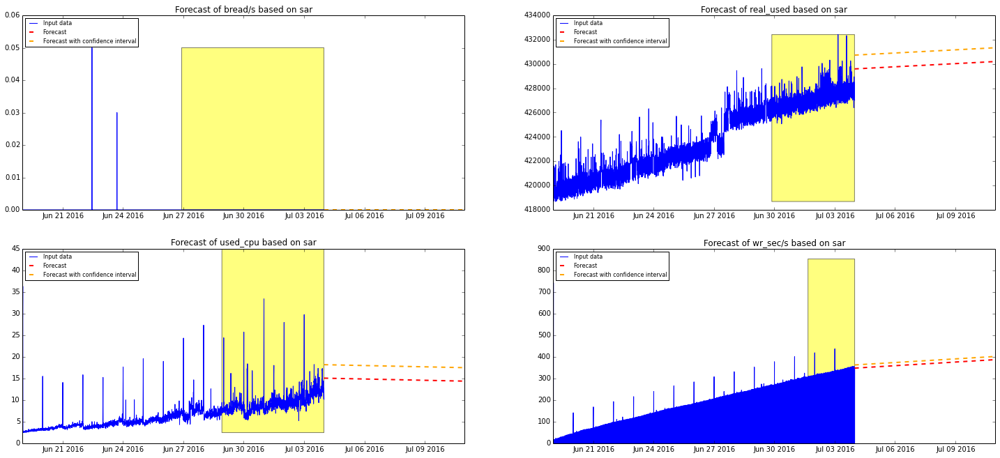

be101.etawf.prod.ed1


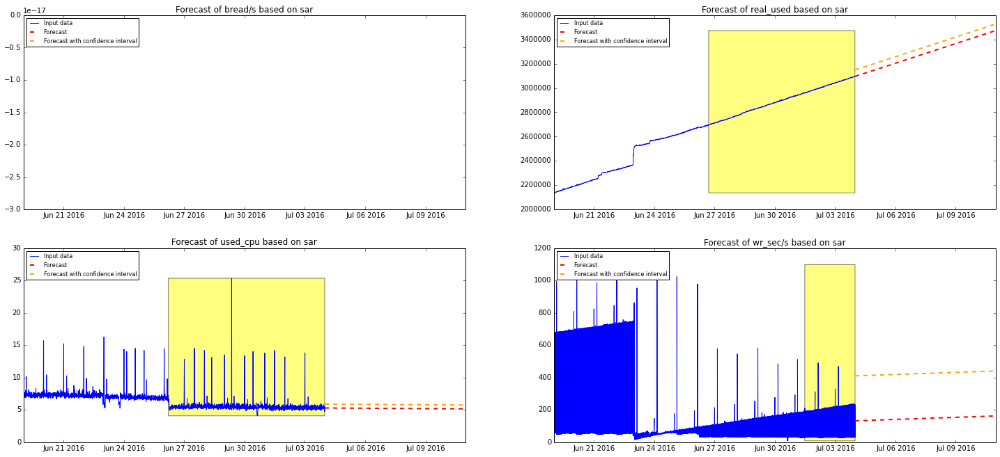

be102.etawf.prod.ed1


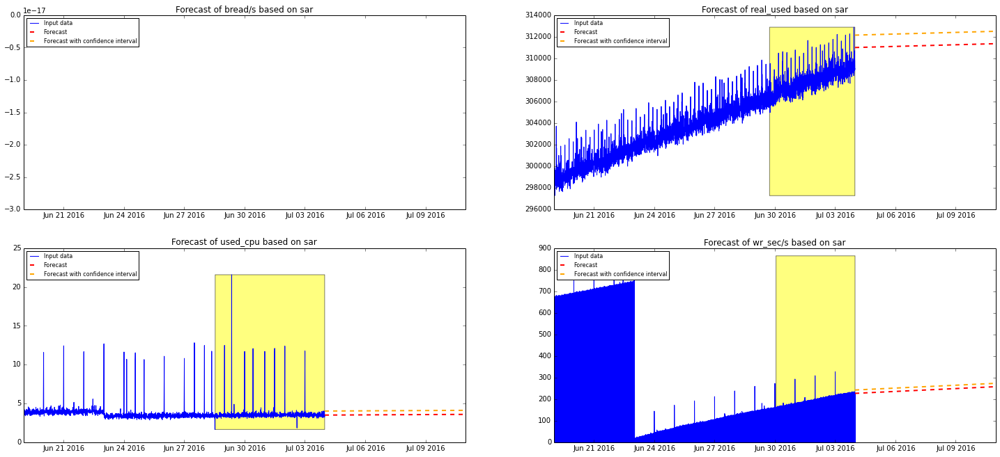

be101.etawf.prod.ed5


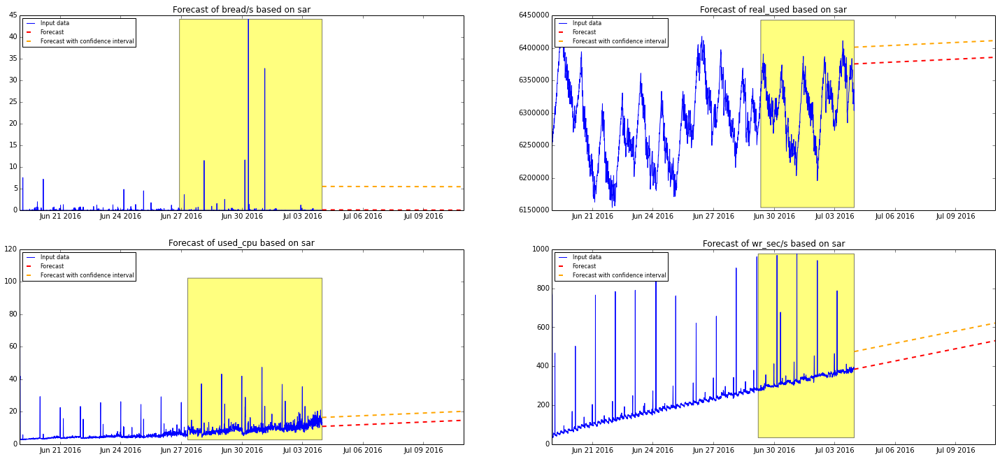

be102.etawf.prod.ed5


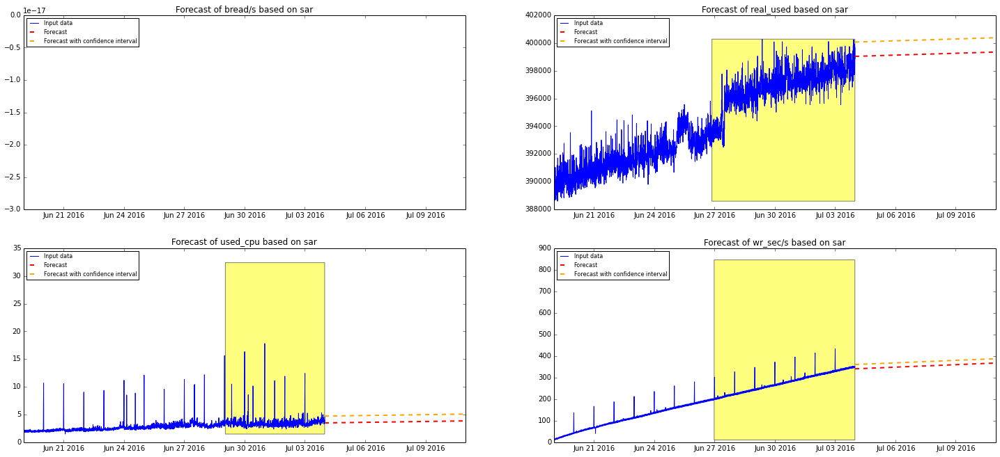

In [196]:
data=pd.read_csv("/home/annac/SG5_hosts.csv")
data1=pd.read_csv("/home/annac/POD16_2hosts.csv")
data.columns=['Group','server']
data1.columns=['Group','server']
data=data.append(data1)
data=data.reset_index()
data=data[['Group', 'server']]
print(data.head())
gr=""
for i in data.index:
    if type(data['Group'].values[i])==float and np.isnan(data['Group'].values[i]):
        data['Group'][i]=gr
    else:
        gr=data['Group'][i]
data.columns=['group','server']
H=data.server.unique()
minsize=""
print (data.columns)
DF=pd.DataFrame()
start_d="2016-06-19 00:00:00 AM"
for i in data.index.unique():
    d=data.iloc[i]
    print(d['server'])
    host=d['server']
    #loading host data
    #if host not in os.listdir('/home/annac/tmp/'):
    #    r=get_host_data (host, user, password)
    #    if r==0:
    #        continue
    #    get_resource_tables(path+host)
    if host  in os.listdir(path) and host!='red002.lp.prod.ed1' and len(os.listdir(path+host))>30:
        if start_d=="":
            D=forecast_on_sar(host, user, start="2016-06-16 00:00:00 AM", plot_clust=False)
        else:
            D=forecast_on_sar(host, user, start=start_d, plot_clust=False)
        DF=DF.append(D)

#DF.to_csv("/home/annac/Used_resources_etawf.csv")
    
#d=pd.read_csv("/home/annac/Used_resources.csv")
#d2=pd.read_csv("/home/annac/Used_resources2.csv")
#dd=d.append(d2)

#dd.to_csv("/home/annac/Used_resources_result.csv")

In [165]:
DF.to_csv("/home/annac/Used_resources_POD_16_2.csv")
data.to_csv("/home/annac/Groups_Servers.csv")

In [197]:
DF
data.columns=['Group','server']
DFR_CPU=pd.DataFrame()
DFR_RAM=pd.DataFrame()
for h in DF.index.unique():
    d=DF.loc[h]
    d=d[d['Param'].str.contains('real_used')]
    d=d[d.Used==max(d.Used)]
    DFR_RAM=DFR_RAM.append(d)
    d=DF.loc[h]
    d=d[d['Param']=='used_cpu']
    DFR_CPU=DFR_CPU.append(d)
DFR_RAM['server']=DFR_RAM.index.values
DFR_CPU['server']=DFR_CPU.index.values
DFR_RAM['Available']=[np.round(np.float16(DFR_RAM.loc[i]['Capacity'])-np.float16(DFR_RAM.loc[i]['Used']),2) \
                      for i in DFR_RAM.index]
DFR_CPU['Available']=[np.round(np.float16(DFR_CPU.loc[i]['Capacity'])*100-np.float16(DFR_CPU.loc[i]['Used'].replace(' %', '')),2) \
                      for i in DFR_CPU.index]
DFR_CPU=pd.merge(DFR_CPU, data)
DFR_RAM=pd.merge(DFR_RAM, data)
print(DFR_RAM.head())
print(DFR_CPU.head())

   Capacity         Details      Param  Resource Used             server  \
0         8  All data in GB  real_used  mem_data    1  be101.pc.prod.ed1   
1         8  All data in GB  real_used  mem_data    1  be102.pc.prod.ed1   
2         8  All data in GB  real_used  mem_data    2  db101.pc.prod.ed1   
3         8  All data in GB  real_used  mem_data    1  db102.pc.prod.ed1   
4         4  All data in GB  real_used  mem_data    1  fe101.pc.prod.ed1   

   Available               Group  
0          7  PC-BE-PROD-ED1-101  
1          7  PC-BE-PROD-ED1-101  
2          6  PC-DB-PROD-ED1-101  
3          7  PC-DB-PROD-ED1-101  
4          3  PC-FE-PROD-ED1-101  

[5 rows x 8 columns]
   Capacity                          Details     Param  Resource    Used  \
0         4  Used in %. All data ncores*100%  used_cpu  cpu_data  3.96 %   
1         4  Used in %. All data ncores*100%  used_cpu  cpu_data  3.64 %   
2         4  Used in %. All data ncores*100%  used_cpu  cpu_data  4.45 %   
3      

In [155]:
#np.isnan(data['Group'][1])
data['Group'].values[1]

nan

API-FE-PROD-ED1-01
    Capacity         Details      Param  Resource Used               server  \
47         4  All data in GB  real_used  mem_data    1  web001.api.prod.ed1   
48         4  All data in GB  real_used  mem_data    1  web002.api.prod.ed1   
49         4  All data in GB  real_used  mem_data    1  web003.api.prod.ed1   
50         4  All data in GB  real_used  mem_data    1  web004.api.prod.ed1   

    Available               Group  
47          3  API-FE-PROD-ED1-01  
48          3  API-FE-PROD-ED1-01  
49          3  API-FE-PROD-ED1-01  
50          3  API-FE-PROD-ED1-01  

[4 rows x 8 columns]
API-FE-PROD-ED1-01
                Group  Number Resource  Sum_capacity  Sum_used
0  API-FE-PROD-ED1-01       4   Memory            16     4.000
1  API-FE-PROD-ED1-01       4      CPU          1600   103.875

[2 rows x 5 columns]
Summary CPU 
Used 6.4921875 %
Summary RAM 
Used 25.0 %
API-FE-PROD-ED2-101
    Capacity         Details      Param  Resource Used               server  \

/usr/local/lib/python2.7/dist-packages/IPython/kernel/__main__.py:33: SettingWithCopyWarning: A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_index,col_indexer] = value instead


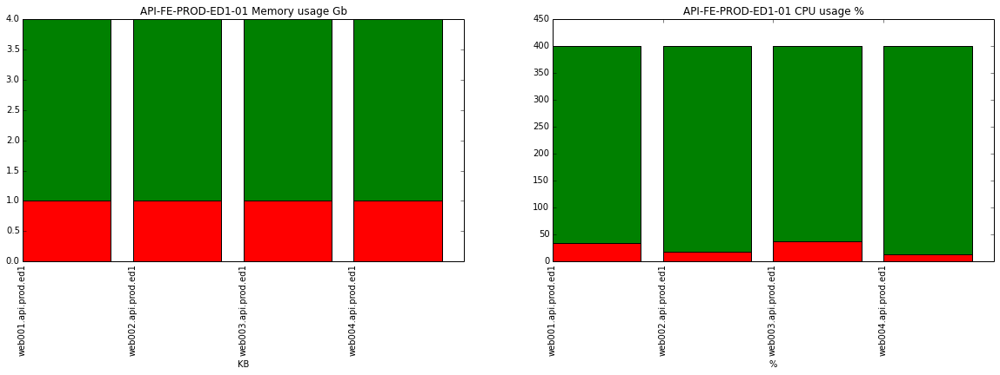

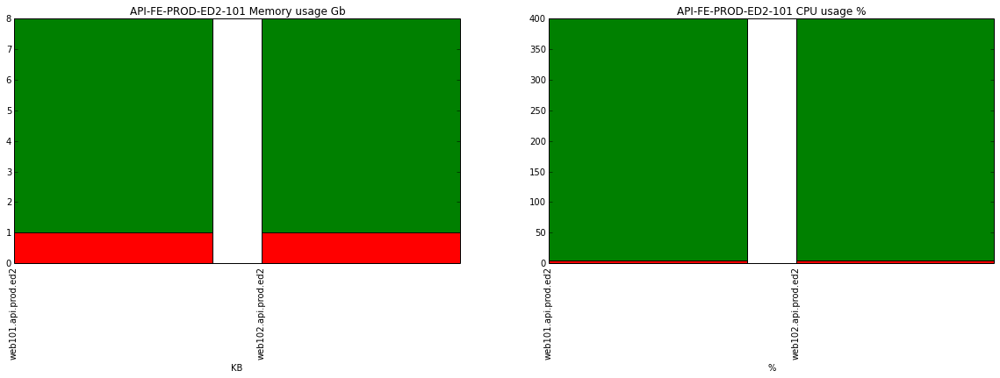

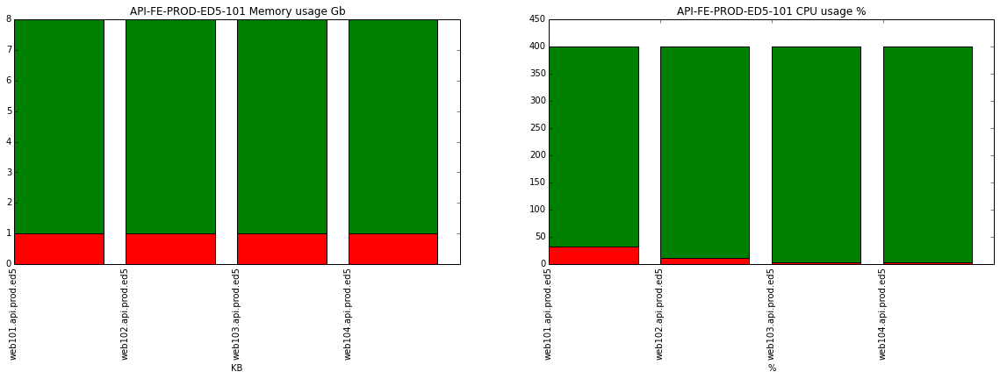

In [198]:
D=get_resource_data('API-FE-PROD')
D.to_csv(path+"API-FE-PROD_stats.csv")

#### ETA-BE-APP-PROD group of hosts

ETA-BE-APP.ETA-BE-APP-PROD-ED1-101
    Capacity         Details      Param  Resource Used               server  \
57        48  All data in GB  real_used  mem_data    9  app101.eta.prod.ed1   
58        48  All data in GB  real_used  mem_data    4  app102.eta.prod.ed1   
59        48  All data in GB  real_used  mem_data    7  app103.eta.prod.ed1   
60        48  All data in GB  real_used  mem_data    7  app104.eta.prod.ed1   
61        48  All data in GB  real_used  mem_data   10  app105.eta.prod.ed1   
62        48  All data in GB  real_used  mem_data    9  app106.eta.prod.ed1   
63        48  All data in GB  real_used  mem_data    5  app107.eta.prod.ed1   
64        48  All data in GB  real_used  mem_data    7  app108.eta.prod.ed1   
65        48  All data in GB  real_used  mem_data    2  app109.eta.prod.ed1   
66        48  All data in GB  real_used  mem_data    2  app110.eta.prod.ed1   
67        48  All data in GB  real_used  mem_data    2  app111.eta.prod.ed1   
68        48  All

/usr/local/lib/python2.7/dist-packages/IPython/kernel/__main__.py:33: SettingWithCopyWarning: A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_index,col_indexer] = value instead


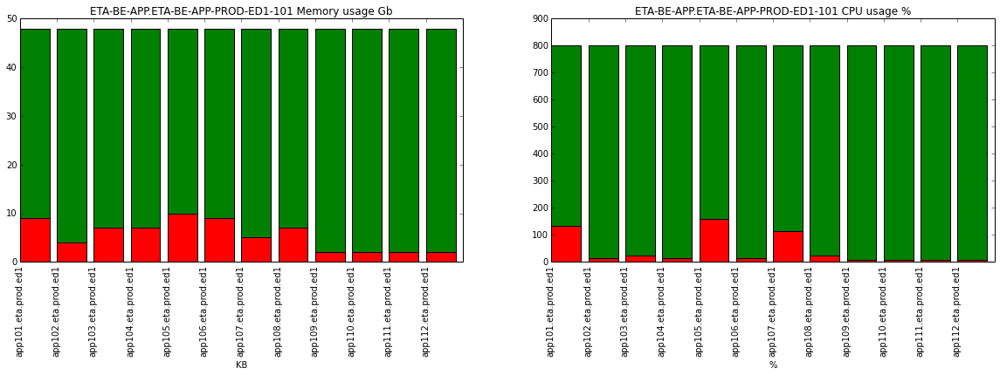

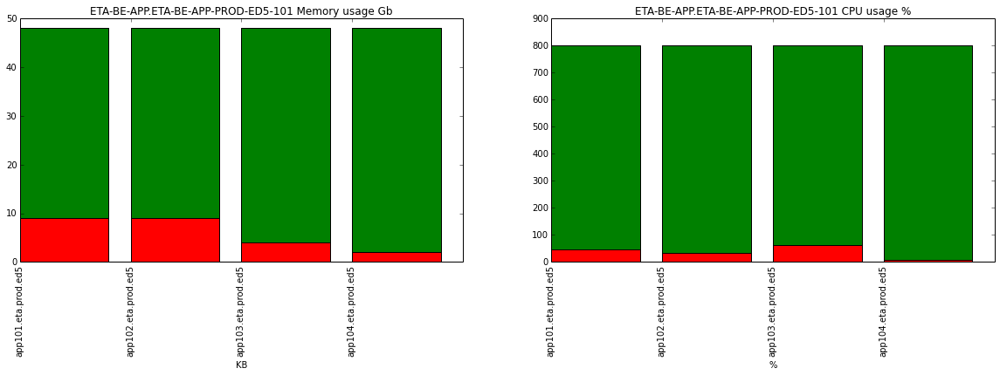

In [199]:
D=get_resource_data('ETA-BE-APP-PROD')
D.to_csv(path+"ETA-BE-APP-PROD_stats.csv")

### ETA-BE-CUSTOM group of hosts

ETA-BE-CUSTOM.ETA-BE-CUSTOM-PROD-ED1-101
    Capacity         Details      Param  Resource Used  \
73        16  All data in GB  real_used  mem_data    2   
74        16  All data in GB  real_used  mem_data    2   

                    server  Available  \
73  custom101.eta.prod.ed1         14   
74  custom102.eta.prod.ed1         14   

                                       Group  
73  ETA-BE-CUSTOM.ETA-BE-CUSTOM-PROD-ED1-101  
74  ETA-BE-CUSTOM.ETA-BE-CUSTOM-PROD-ED1-101  

[2 rows x 8 columns]
ETA-BE-CUSTOM.ETA-BE-CUSTOM-PROD-ED1-101
                                      Group  Number Resource  Sum_capacity  \
0  ETA-BE-CUSTOM.ETA-BE-CUSTOM-PROD-ED1-101       2   Memory            32   
1  ETA-BE-CUSTOM.ETA-BE-CUSTOM-PROD-ED1-101       2      CPU           800   

    Sum_used  
0   4.000000  
1  23.859375  

[2 rows x 5 columns]
Summary CPU 
Used 2.982421875 %
Summary RAM 
Used 12.5 %
ETA-BE-CUSTOM.ETA-BE-CUSTOM-PROD-ED5-101
    Capacity         Details      Param  Resource Used  

/usr/local/lib/python2.7/dist-packages/IPython/kernel/__main__.py:33: SettingWithCopyWarning: A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_index,col_indexer] = value instead


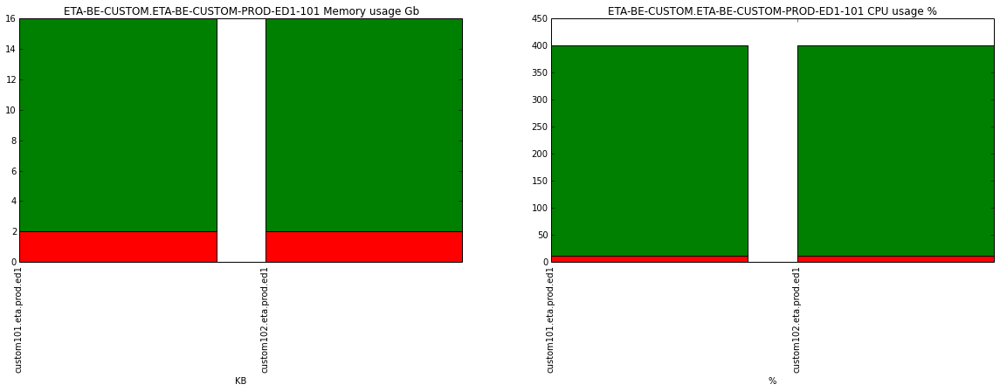

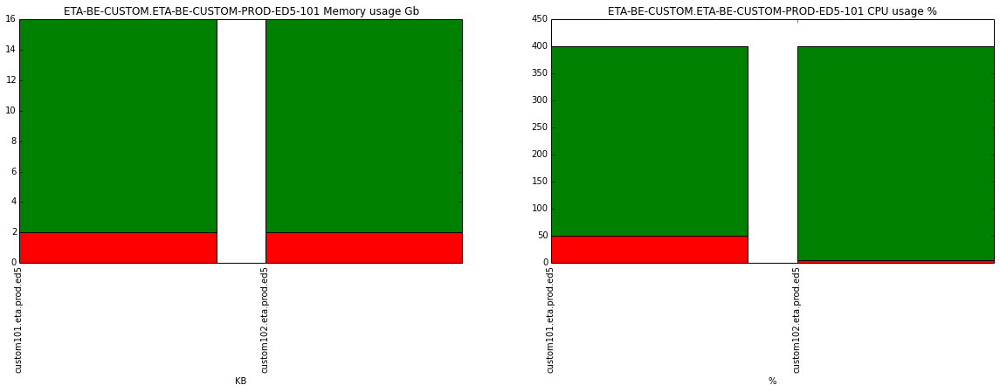

In [200]:
D=get_resource_data('ETA-BE-CUSTOM')
D.to_csv(path+"ETA-BE-CUSTOM_stats.csv")

### ETA-FE-PROD group 

ETA-FE.ETA-FE-PROD-ED1-101
    Capacity         Details      Param  Resource Used               server  \
81         6  All data in GB  real_used  mem_data    4  web101.eta.prod.ed1   
82         6  All data in GB  real_used  mem_data    4  web102.eta.prod.ed1   
83         6  All data in GB  real_used  mem_data    4  web103.eta.prod.ed1   
84         6  All data in GB  real_used  mem_data    4  web104.eta.prod.ed1   
85         6  All data in GB  real_used  mem_data    4  web105.eta.prod.ed1   
86         6  All data in GB  real_used  mem_data    4  web106.eta.prod.ed1   
87         6  All data in GB  real_used  mem_data    4  web107.eta.prod.ed1   
88         6  All data in GB  real_used  mem_data    4  web108.eta.prod.ed1   
89         8  All data in GB  real_used  mem_data    5  web109.eta.prod.ed1   
90         8  All data in GB  real_used  mem_data    5  web110.eta.prod.ed1   
91         8  All data in GB  real_used  mem_data    5  web111.eta.prod.ed1   
92         8  All data in

/usr/local/lib/python2.7/dist-packages/IPython/kernel/__main__.py:33: SettingWithCopyWarning: A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_index,col_indexer] = value instead


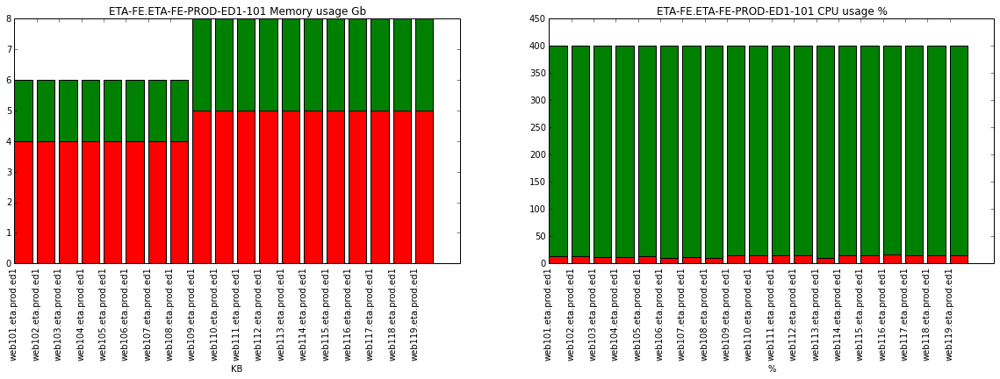

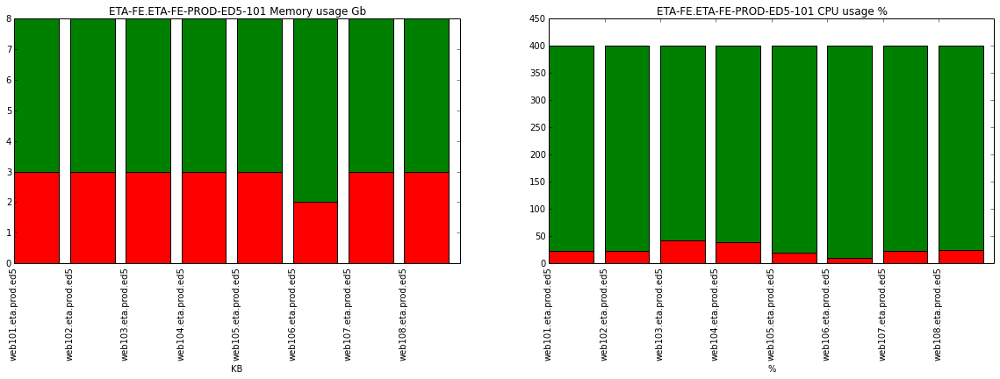

In [201]:
D=get_resource_data('ETA-FE-PROD')
D.to_csv(path+"ETA-BE-APP-PROD_stats.csv")

ETA-FE-SERVICES.ETA-FE-SERVICES-PROD-ED1-101
                                          Group  Number Resource  \
0  ETA-FE-SERVICES.ETA-FE-SERVICES-PROD-ED1-101       5   Memory   
1  ETA-FE-SERVICES.ETA-FE-SERVICES-PROD-ED1-101       5      CPU   

   Sum_capacity  Sum_used  
0            40  35.00000  
1          2000  62.84375  

[2 rows x 5 columns]
Summary CPU 
Used 3.1421875 %
Summary RAM 
Used 87.5 %
ETA-FE-SERVICES.ETA-FE-SERVICES-PROD-ED5-101
                                          Group  Number Resource  \
0  ETA-FE-SERVICES.ETA-FE-SERVICES-PROD-ED5-101       4   Memory   
1  ETA-FE-SERVICES.ETA-FE-SERVICES-PROD-ED5-101       4      CPU   

   Sum_capacity  Sum_used  
0            32      28.0  
1          1600     120.5  

[2 rows x 5 columns]
Summary CPU 
Used 7.53125 %
Summary RAM 
Used 87.5 %


/usr/local/lib/python2.7/dist-packages/IPython/kernel/__main__.py:31: SettingWithCopyWarning: A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_index,col_indexer] = value instead


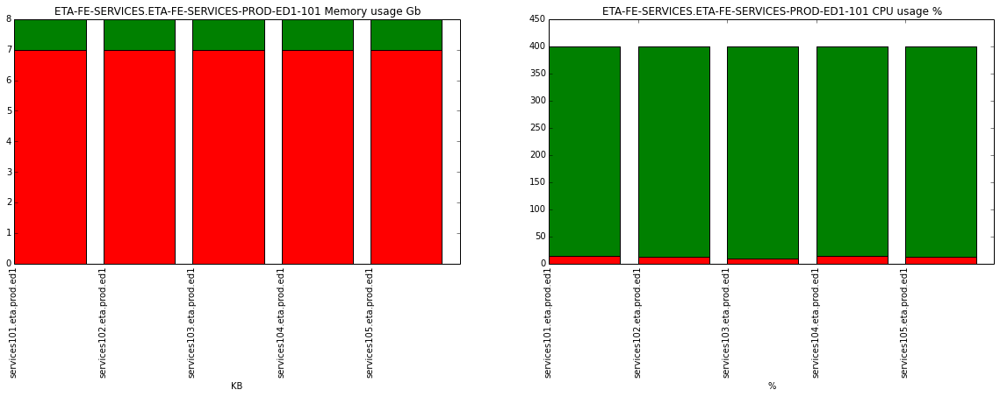

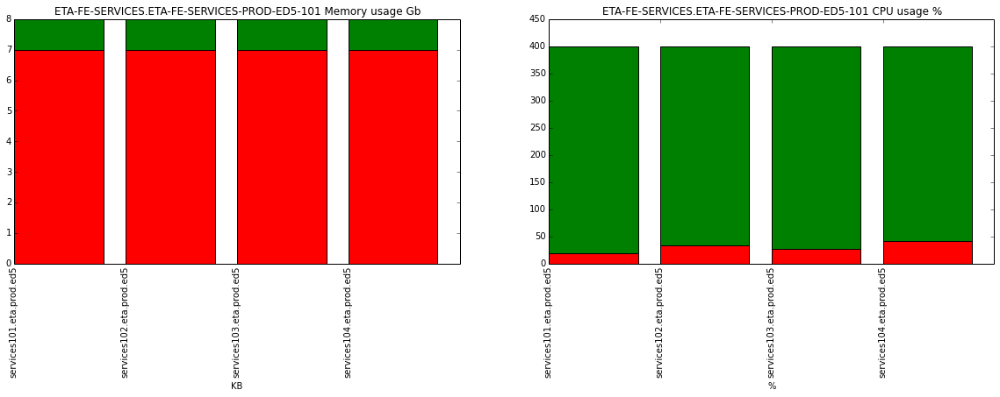

In [49]:
D=get_resource_data('ETA-FE-SERVICES')
D.to_csv(path+"ETA-FE-SERVICES.csv")

ETA-DB.ETA-DB-PROD-ED1-101
                        Group  Number Resource  Sum_capacity  Sum_used
0  ETA-DB.ETA-DB-PROD-ED1-101       2   Memory           504   137.000
1  ETA-DB.ETA-DB-PROD-ED1-101       2      CPU          9600    62.375

[2 rows x 5 columns]
Summary CPU 
Used 0.649739583333 %
Summary RAM 
Used 27.1728515625 %
ETA-DB.ETA-DB-PROD-ED5-101
                        Group  Number Resource  Sum_capacity  Sum_used
0  ETA-DB.ETA-DB-PROD-ED5-101       2   Memory           504   73.0000
1  ETA-DB.ETA-DB-PROD-ED5-101       2      CPU          9600   96.6875

[2 rows x 5 columns]
Summary CPU 
Used 1.00716145833 %
Summary RAM 
Used 14.4897460938 %


/usr/local/lib/python2.7/dist-packages/IPython/kernel/__main__.py:31: SettingWithCopyWarning: A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_index,col_indexer] = value instead


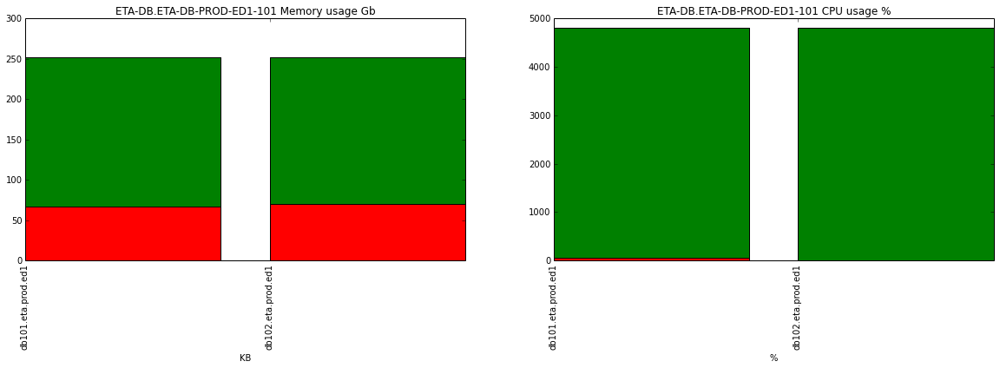

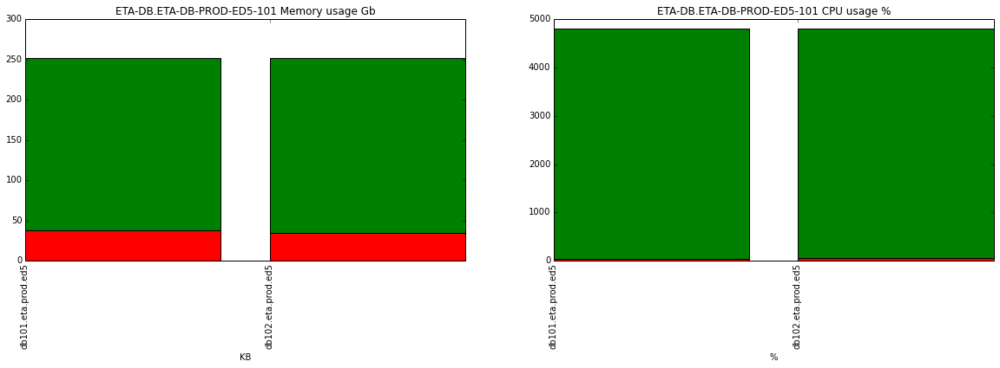

In [50]:
D=get_resource_data('ETA-DB-PROD')
D.to_csv(path+"ETA-DB-PROD.csv")


ETA-FS.ETA-FS-PROD-ED1-101
                        Group  Number Resource  Sum_capacity  Sum_used
0  ETA-FS.ETA-FS-PROD-ED1-101       2   Memory           504    32.000
1  ETA-FS.ETA-FS-PROD-ED1-101       2      CPU          9600    81.875

[2 rows x 5 columns]
Summary CPU 
Used 0.852864583333 %
Summary RAM 
Used 6.34765625 %
ETA-FS.ETA-FS-PROD-ED5-101
                        Group  Number Resource  Sum_capacity  Sum_used
0  ETA-FS.ETA-FS-PROD-ED5-101       2   Memory           504     16.00
1  ETA-FS.ETA-FS-PROD-ED5-101       2      CPU          9600     47.25

[2 rows x 5 columns]
Summary CPU 
Used 0.4921875 %
Summary RAM 
Used 3.173828125 %


/usr/local/lib/python2.7/dist-packages/IPython/kernel/__main__.py:31: SettingWithCopyWarning: A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_index,col_indexer] = value instead


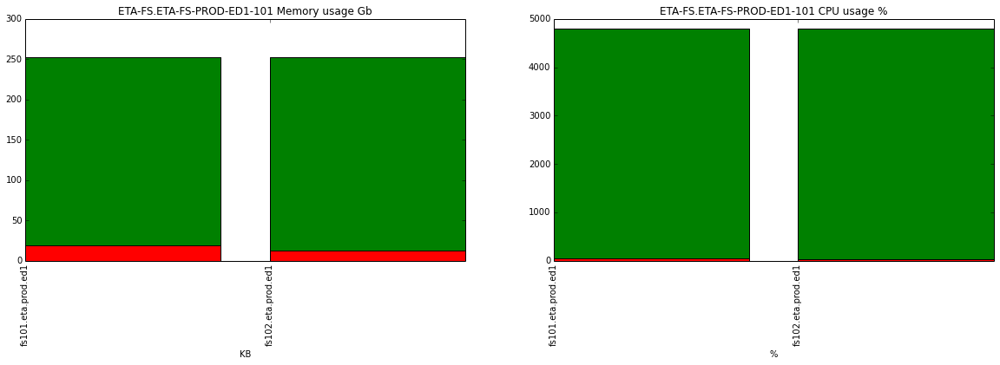

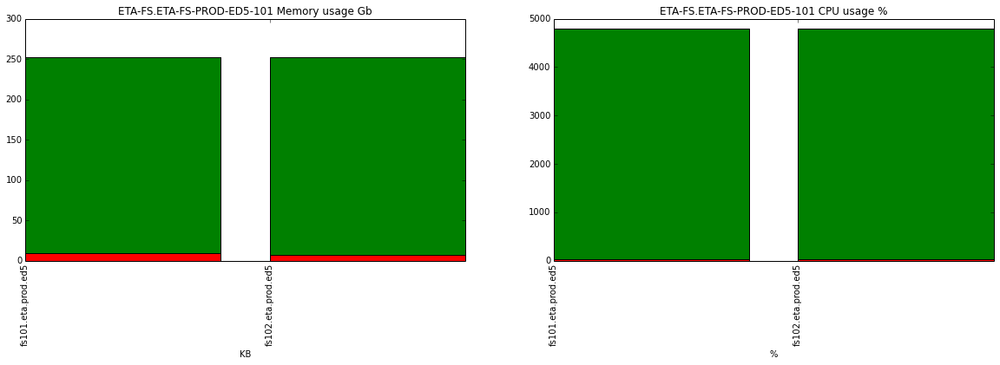

In [51]:
D=get_resource_data('ETA-FS-PROD')
D.to_csv(path+"ETA-FS-PROD.csv")

ETAWF-BE.ETAWF-BE-PROD-ED1-101
                            Group  Number Resource  Sum_capacity   Sum_used
0  ETAWF-BE.ETAWF-BE-PROD-ED1-101       2   Memory            16   4.000000
1  ETAWF-BE.ETAWF-BE-PROD-ED1-101       2      CPU           800  12.296875

[2 rows x 5 columns]
Summary CPU 
Used 1.537109375 %
Summary RAM 
Used 25.0 %
ETAWF-BE.ETAWF-BE-PROD-ED5-101
                            Group  Number Resource  Sum_capacity  Sum_used
0  ETAWF-BE.ETAWF-BE-PROD-ED5-101       2   Memory            16   8.00000
1  ETAWF-BE.ETAWF-BE-PROD-ED5-101       2      CPU           800  20.84375

[2 rows x 5 columns]
Summary CPU 
Used 2.60546875 %
Summary RAM 
Used 50.0 %


/usr/local/lib/python2.7/dist-packages/IPython/kernel/__main__.py:31: SettingWithCopyWarning: A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_index,col_indexer] = value instead


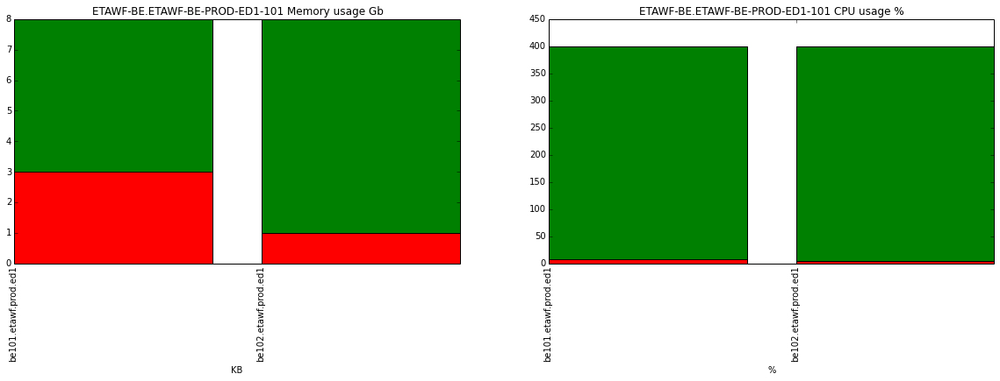

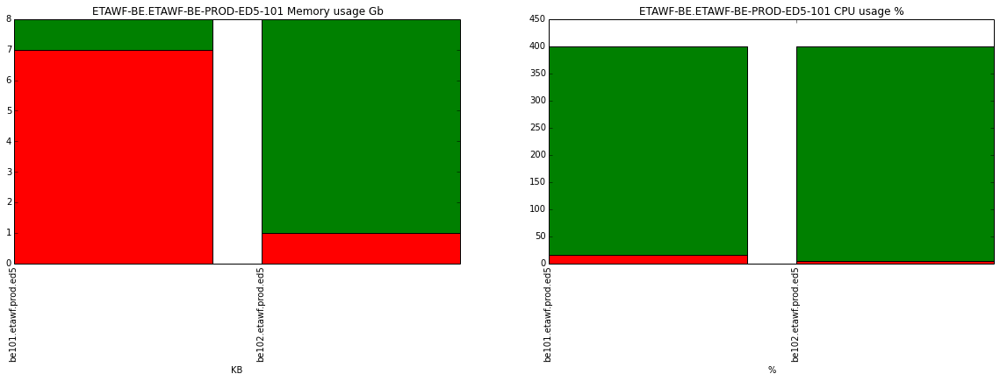

In [52]:
D=get_resource_data('ETAWF-BE-PROD')
D.to_csv(path+'ETAWF-BE-PROD')

In [27]:
data=pd.read_csv("/home/annac/POD16_2hosts.csv", sep="\t")
H=data.server.unique()
user="annac"
password="ITssa2016"
minsize=""
print (data.columns)
DF=pd.DataFrame()
host='app102.eta.prod.ed1'
get_resource_tables(path+host)

Index([u'Group', u'server'], dtype='object')


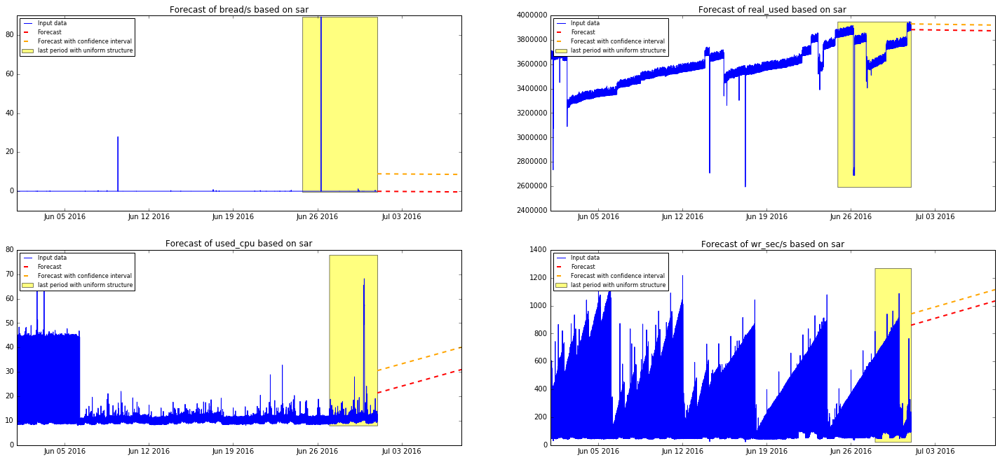

In [55]:
D=forecast_on_sar(host, user, plot_clust=False)#, start="2016-06-16 00:00:00 AM")

In [43]:
DFR_CPU=pd.DataFrame()
for h in DF.index.unique():
    d=DF.loc[h]
    d=d[d['Param']=='used_cpu']
    DFR_CPU=DFR_CPU.append(d)
DFR_CPU.head()
DFR_CPU['Available']=[np.round(np.float16(DFR_CPU.loc[i]['Capacity'])*100-np.float16(DFR_CPU.loc[i]['Used'].replace(' %', '')),2) \
                      for i in DFR_CPU.index]
DFR_CPU['server']=DFR_CPU.index.values
DFR_CPU=pd.merge(DFR_CPU, data)
DFR_CPU.head(20)

,Capacity,Details,Param,Resource,Used,Available,server,Group
0,8,Used in %. All data ncores*100%,used_cpu,cpu_data,132.81 %,667.25,app101.eta.prod.ed1,ETA-BE-APP.ETA-BE-APP-PROD-ED1-101
1,8,Used in %. All data ncores*100%,used_cpu,cpu_data,13.94 %,786.06,app102.eta.prod.ed1,ETA-BE-APP.ETA-BE-APP-PROD-ED1-101
2,8,Used in %. All data ncores*100%,used_cpu,cpu_data,22.9 %,777.09,app103.eta.prod.ed1,ETA-BE-APP.ETA-BE-APP-PROD-ED1-101
3,8,Used in %. All data ncores*100%,used_cpu,cpu_data,13.46 %,786.54,app104.eta.prod.ed1,ETA-BE-APP.ETA-BE-APP-PROD-ED1-101
4,8,Used in %. All data ncores*100%,used_cpu,cpu_data,159.86 %,640.12,app105.eta.prod.ed1,ETA-BE-APP.ETA-BE-APP-PROD-ED1-101
5,8,Used in %. All data ncores*100%,used_cpu,cpu_data,14.89 %,785.11,app106.eta.prod.ed1,ETA-BE-APP.ETA-BE-APP-PROD-ED1-101
6,8,Used in %. All data ncores*100%,used_cpu,cpu_data,114.73 %,685.25,app107.eta.prod.ed1,ETA-BE-APP.ETA-BE-APP-PROD-ED1-101
7,8,Used in %. All data ncores*100%,used_cpu,cpu_data,22.02 %,777.98,app108.eta.prod.ed1,ETA-BE-APP.ETA-BE-APP-PROD-ED1-101
8,8,Used in %. All data ncores*100%,used_cpu,cpu_data,6.24 %,793.76,app109.eta.prod.ed1,ETA-BE-APP.ETA-BE-APP-PROD-ED1-101
9,8,Used in %. All data ncores*100%,used_cpu,cpu_data,6.13 %,793.87,app110.eta.prod.ed1,ETA-BE-APP.ETA-BE-APP-PROD-ED1-101
